<a href="https://colab.research.google.com/github/savinats/LCPb-Project/blob/main/Next_Token_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from transformers import GPT2LMHeadModel, GPT2Tokenizer, GPT2Model
import transformers
import sklearn.manifold
import numpy as np
import matplotlib.pyplot as plt
import torch
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

In [ ]:
#Load pre-trained model and tokenizer
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
model = GPT2LMHeadModel.from_pretrained("gpt2")

In [ ]:
#Encode text
input_text = "I like ice cream. But "
input_ids = tokenizer.encode(input_text, return_tensors="pt")
tokenized_input = tokenizer.encode(input_text, add_special_tokens=False)

In [ ]:
#Generate text
output_ids = input_ids #initialize
num_tokens = len(tokenized_input)
print(f"Number of tokens in the input sentence: {num_tokens}")
print([tokenizer.decode(i)+" " for i in tokenized_input])

Number of tokens in the input sentence: 7
['I ', ' like ', ' ice ', ' cream ', '. ', ' But ', '  ']


**Generated text**

In [ ]:
#Decode and print the final generated text
#setting the parameters
max_length = 50
do_sample = True            # enable sampling to be able to change the following parameters
top_k = 50                  # considers only the top k most probable next tokens
top_p = 0.95                # it dynamically chooses the number of tokens to consider, based on their cumulative probability.
temperature = 0.7           # controls the randomness of predictions; applies temp before softmax. T<1: model more deterministic, T>1: output's more random + diverse
repetition_penalty = 1.1    # encourages more diverse output

attention_mask = torch.ones(input_ids.shape, dtype=torch.long)

#output = model.generate(input_ids, max_length = 100)
output = model.generate(
    input_ids,
    attention_mask = attention_mask,
    max_length=100,
    pad_token_id=tokenizer.eos_token_id, # the eos token_id default is 50256 (like the warning said)
    do_sample=True,
    top_k=50,
    top_p=0.95,
    temperature=0.7,
    repetition_penalty=1.1
)
text_output = tokenizer.decode(output[0], skip_special_tokens=True)

print(f"\n*Input text: {input_text}")
print(f"*Generated text: {text_output}")

#not complete answer????


*Input text: Pancakes are good for 
*Generated text: Pancakes are good for iced tea, too.

I also like it with a glass of sparkling water or ice cream to add the sweetness and finish up your drink! I didn't know that this would be possible without glasses because my friends gave me some free ones during their time on our honeymoon in Hawaii (they had an amazing selection)! And you can buy them at most any grocery store around here if not already available there…if they're cheap enough….but please don´


**PLOTS FOR NEXT MOST PROBABLE TOKEN *WITHOUT*  USING THE MULTINOMIAL DISTRIBUTION & SAMPLING**

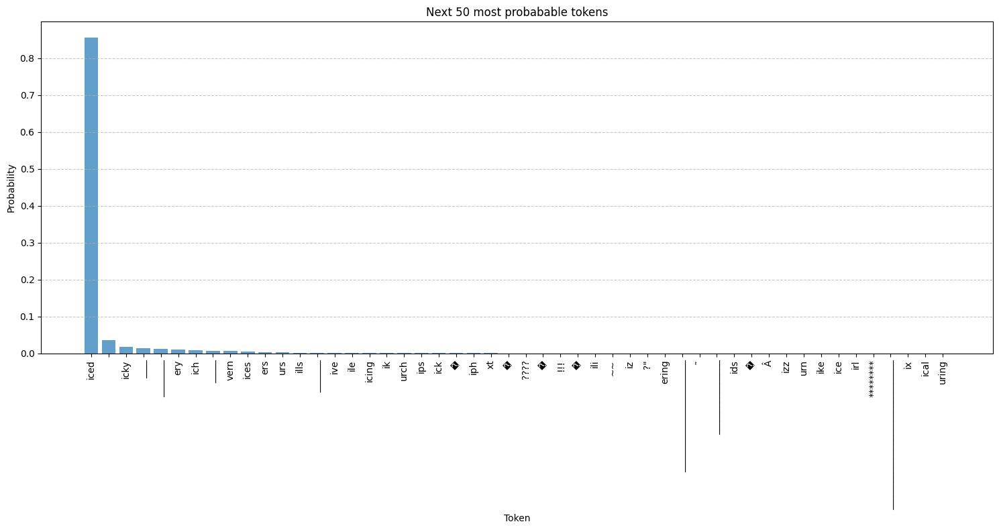

Generated so far: Pancakes are good for iced


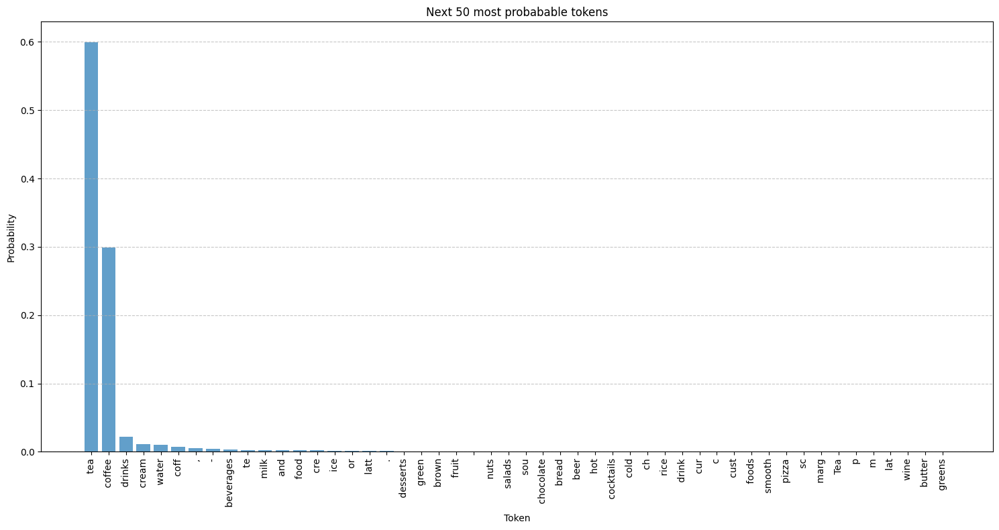

Generated so far: Pancakes are good for iced tea


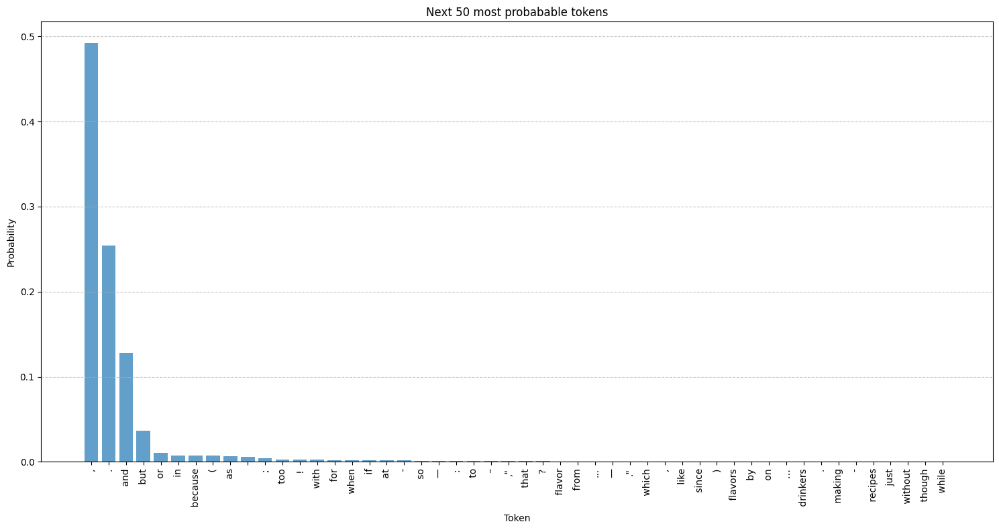

Generated so far: Pancakes are good for iced tea,


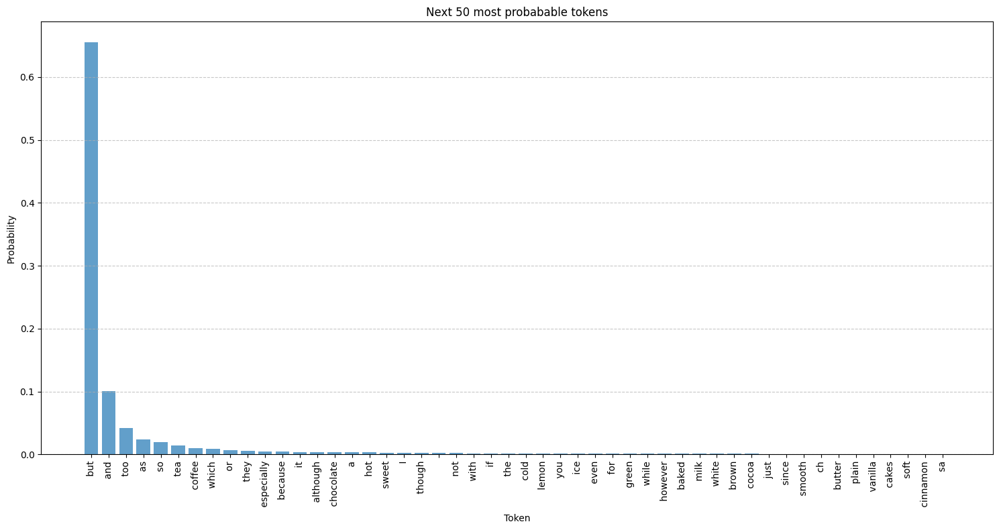

Generated so far: Pancakes are good for iced tea, but


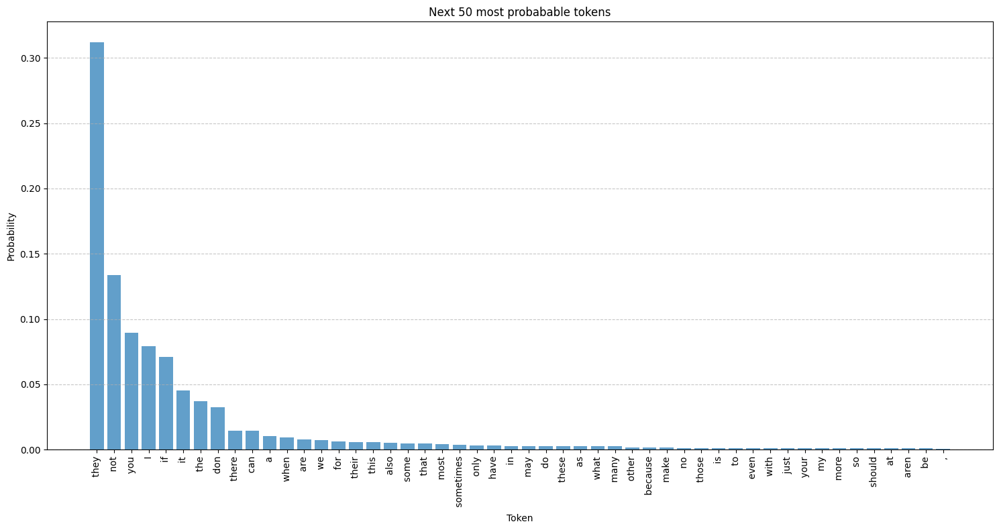

Generated so far: Pancakes are good for iced tea, but they


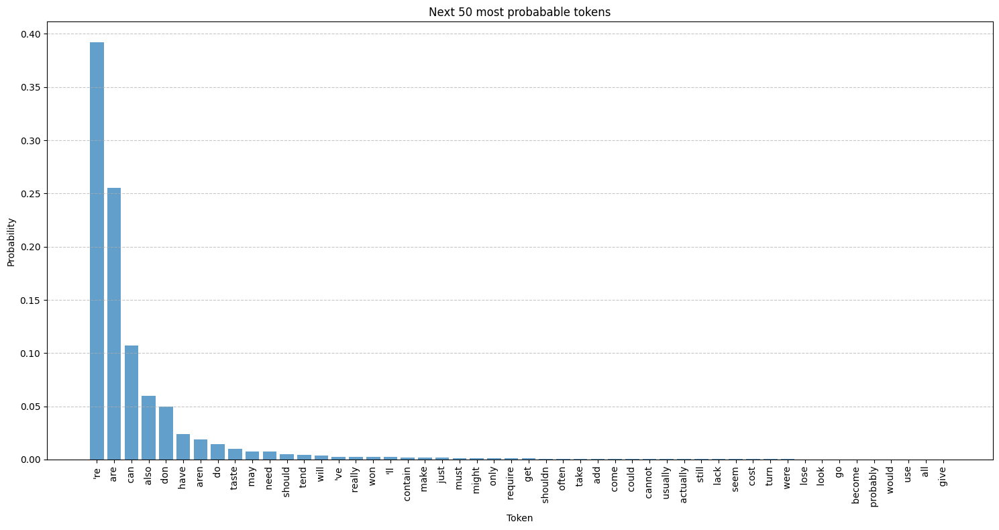

Generated so far: Pancakes are good for iced tea, but they're


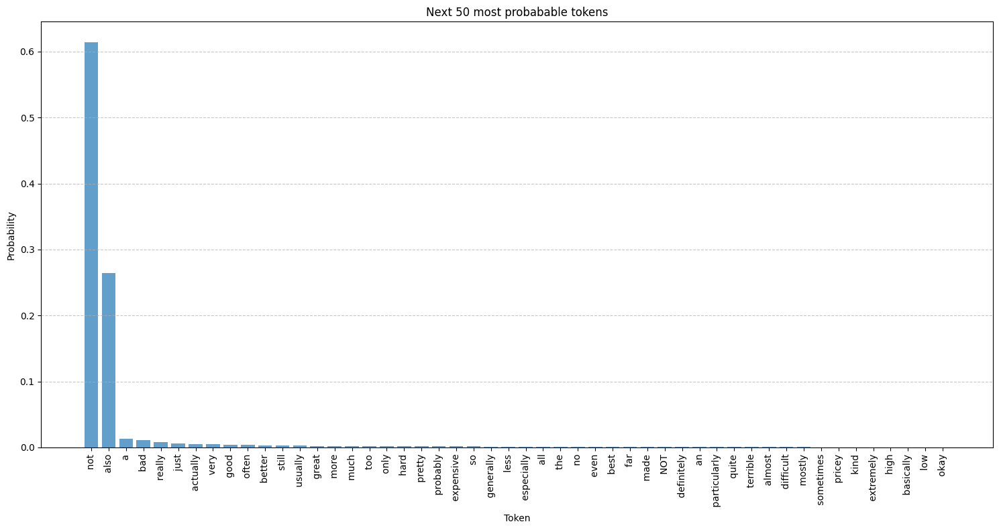

Generated so far: Pancakes are good for iced tea, but they're not


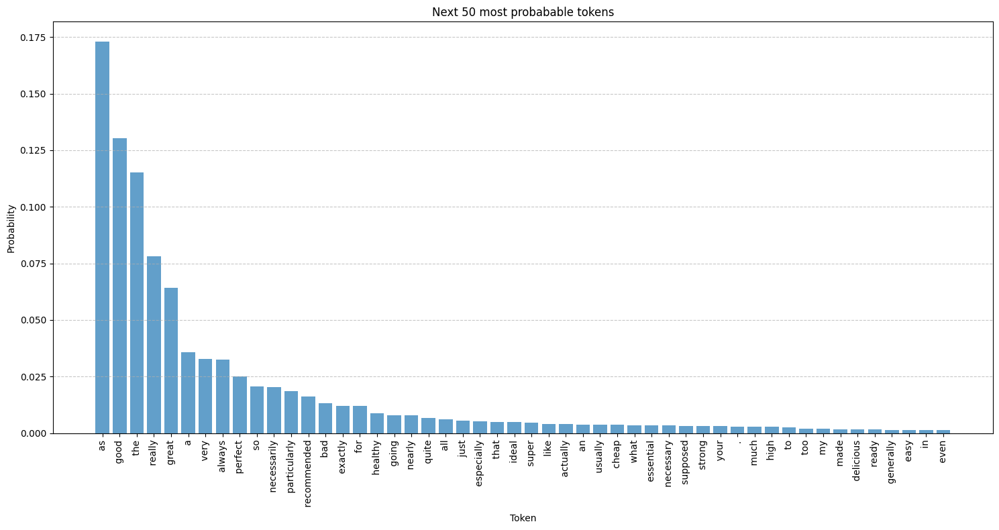

Generated so far: Pancakes are good for iced tea, but they're not as


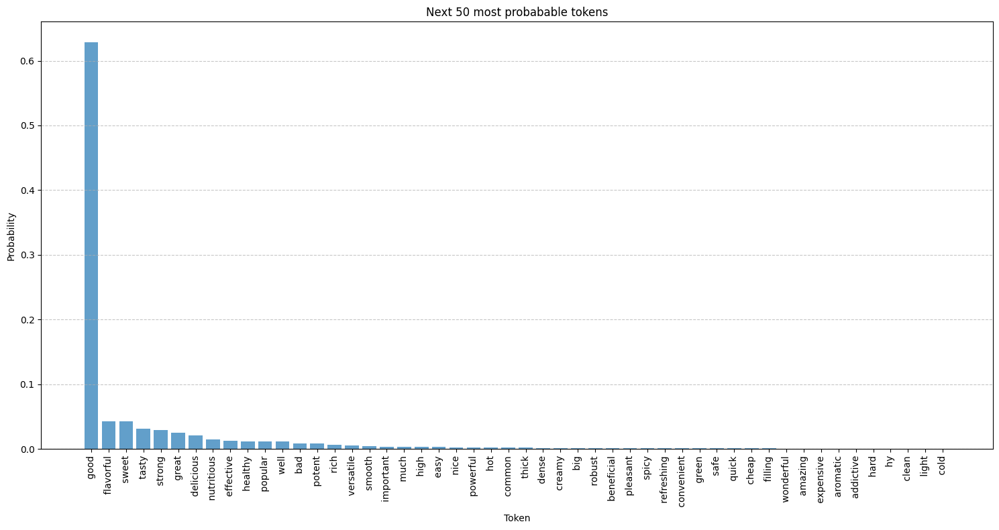

Generated so far: Pancakes are good for iced tea, but they're not as good


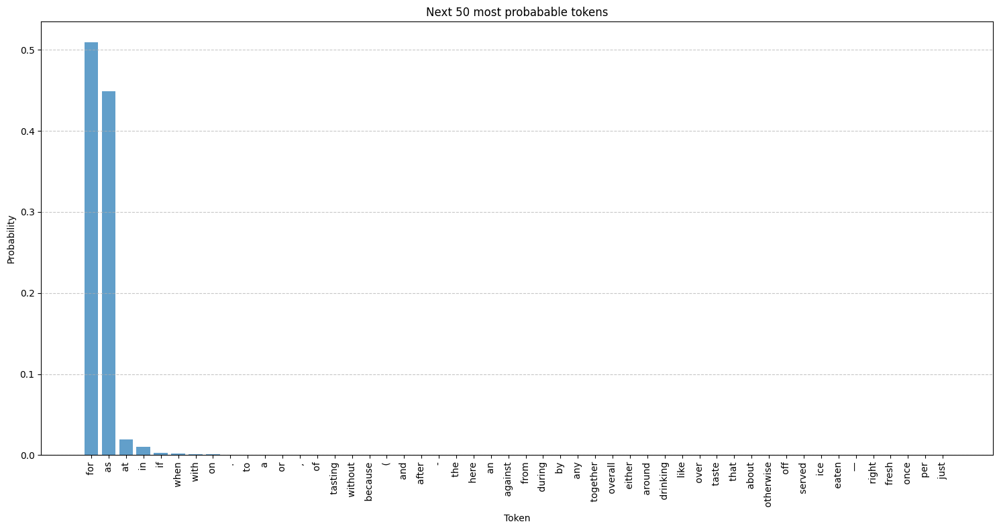

Generated so far: Pancakes are good for iced tea, but they're not as good for


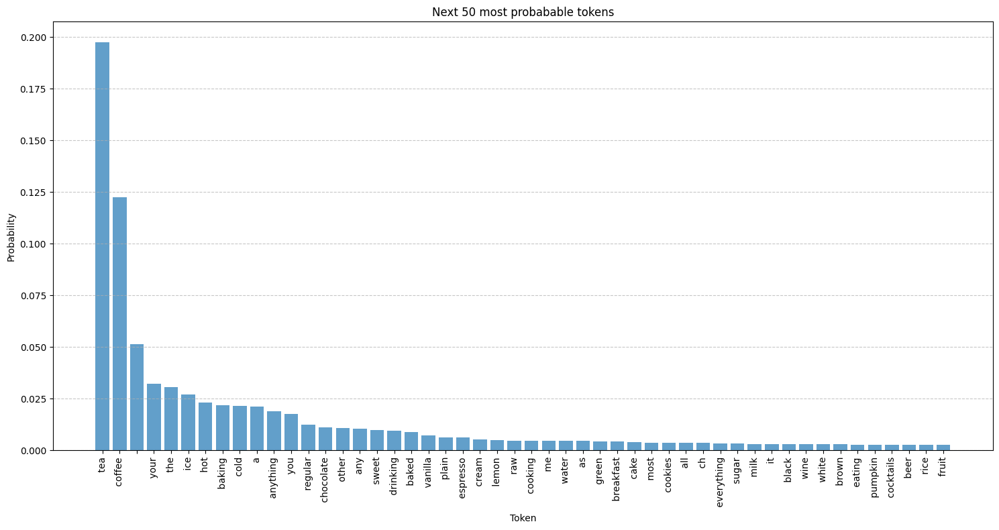

Generated so far: Pancakes are good for iced tea, but they're not as good for tea


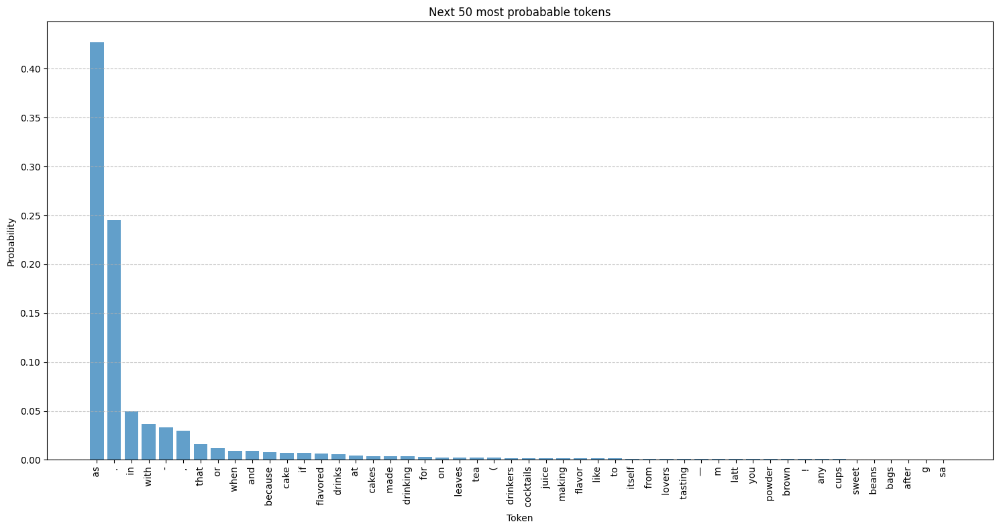

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as


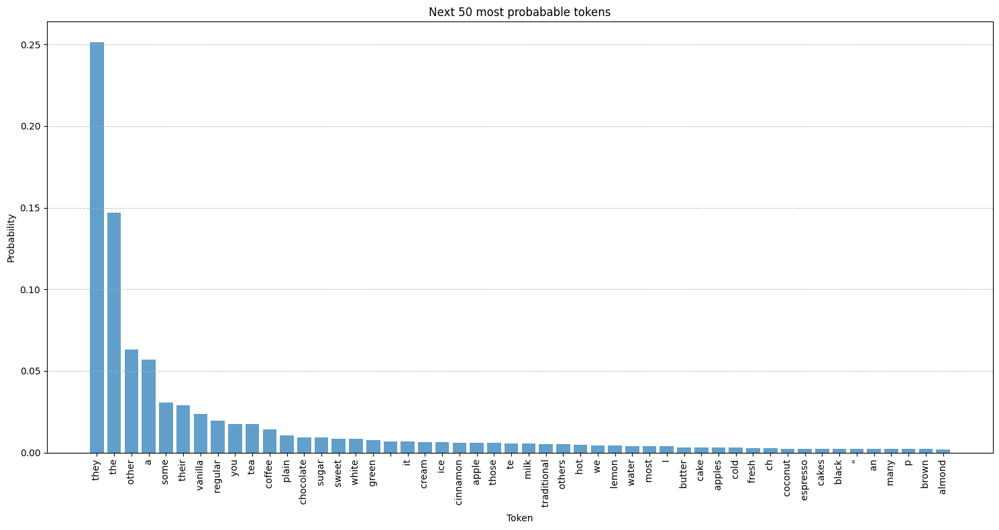

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they


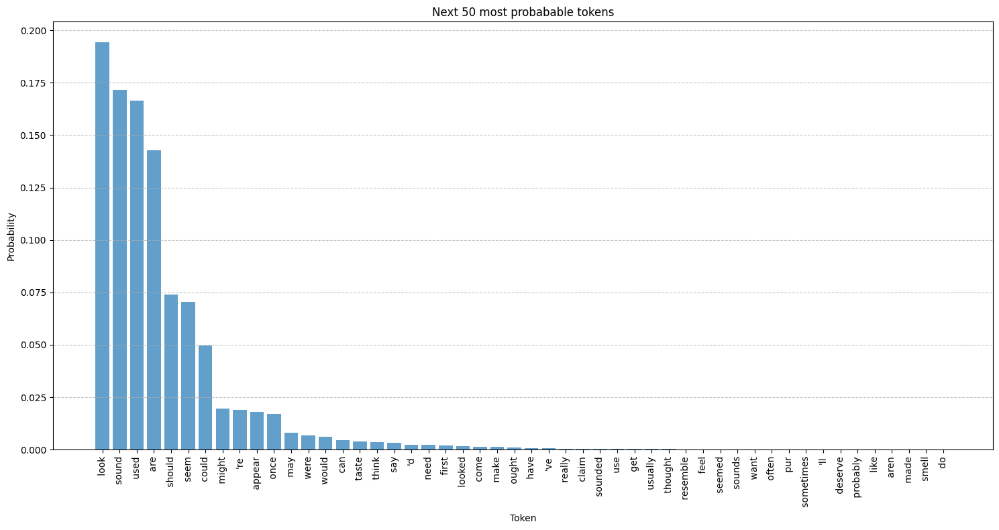

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look


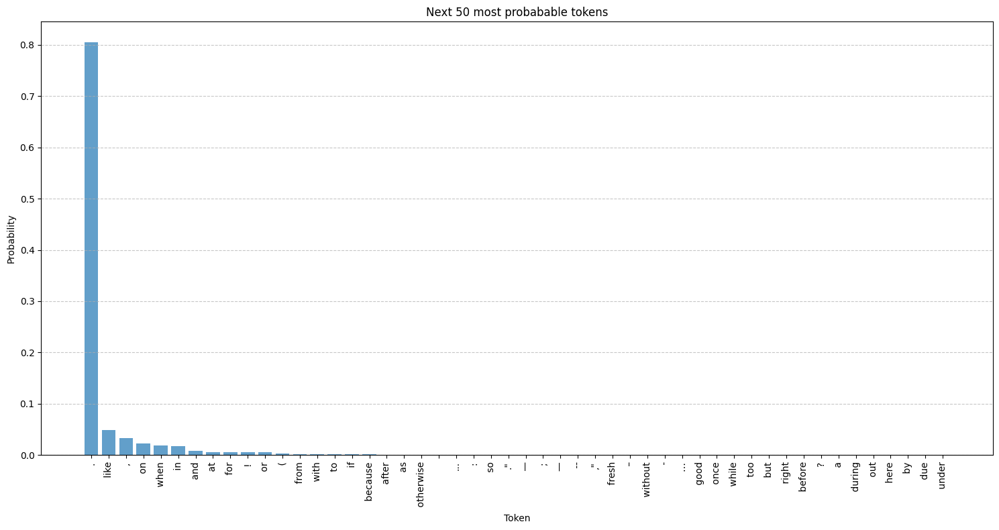

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.


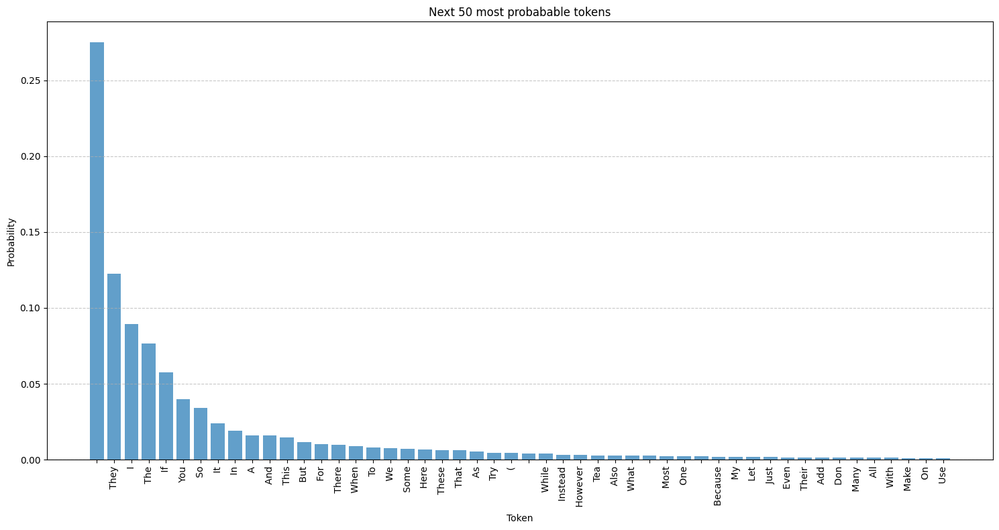

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.



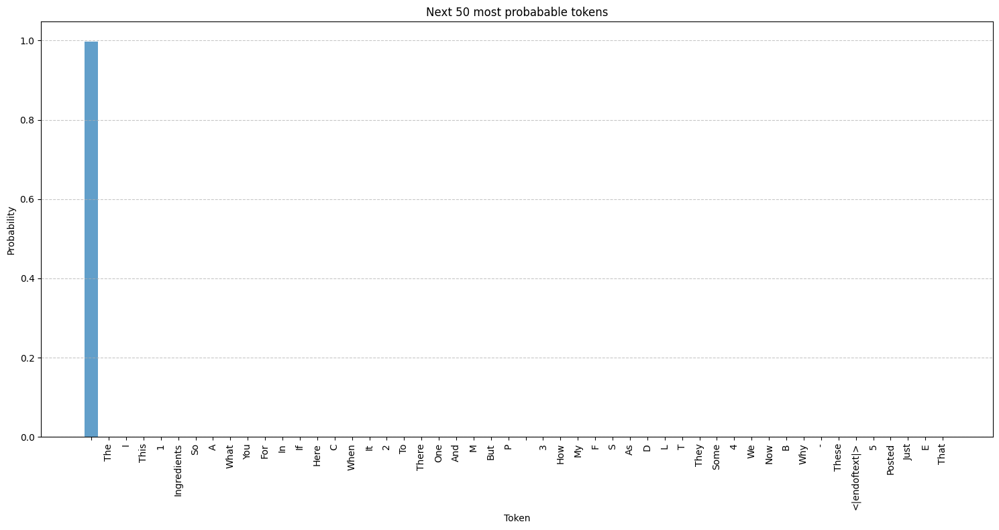

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.




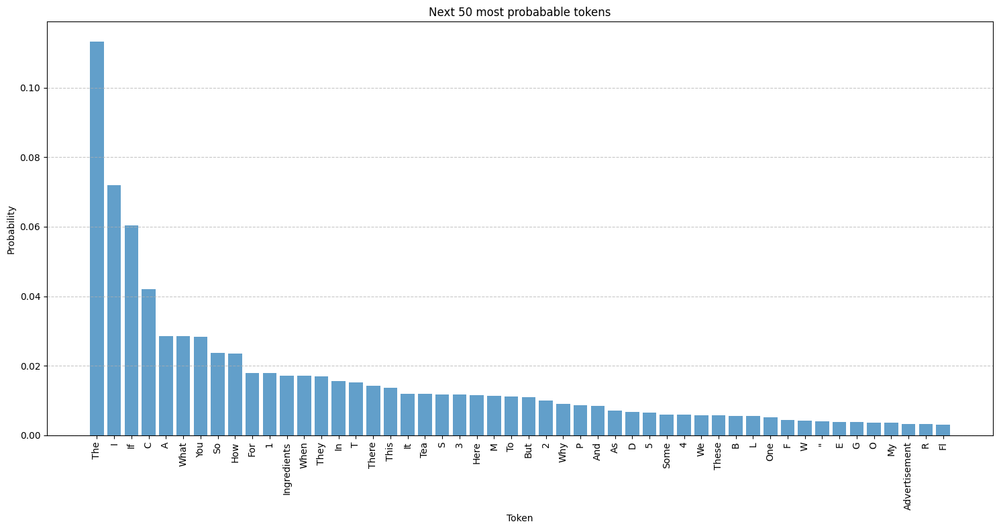

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The


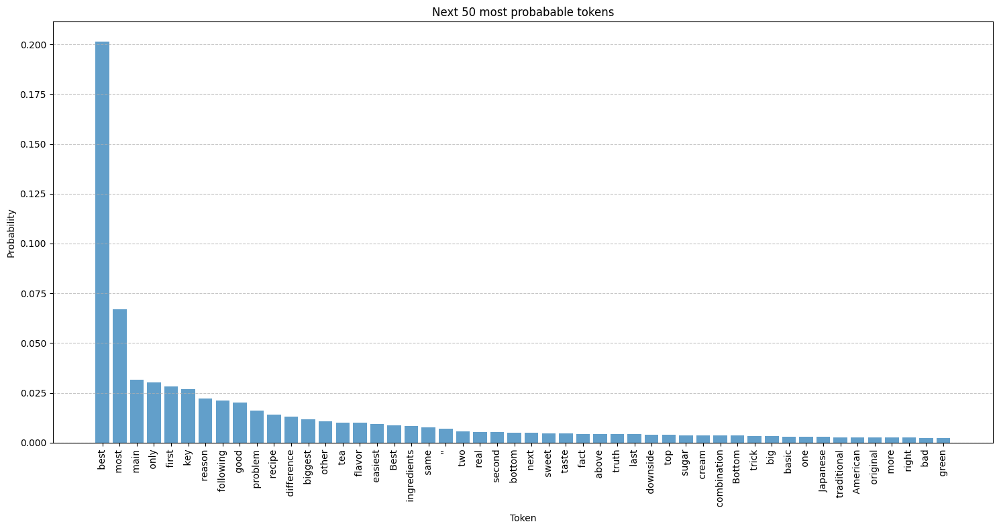

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best


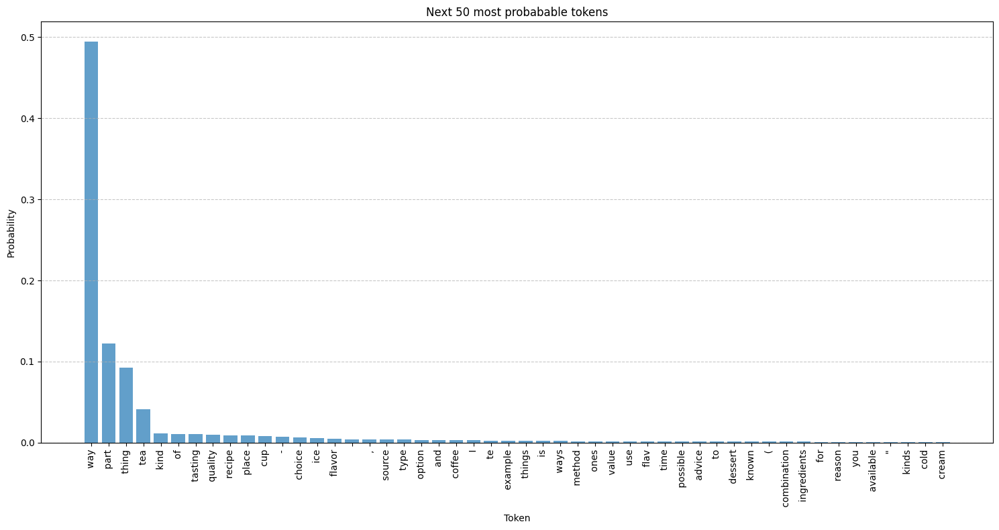

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way


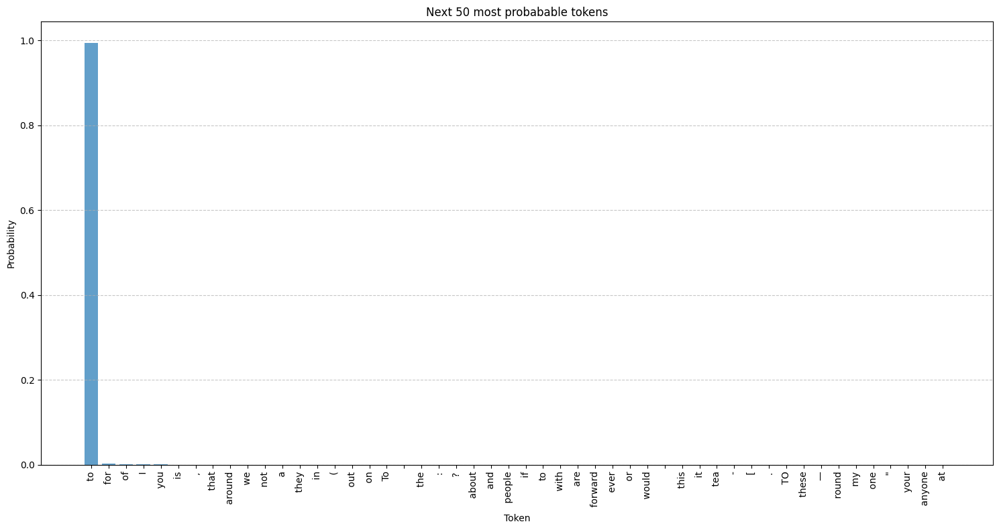

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to


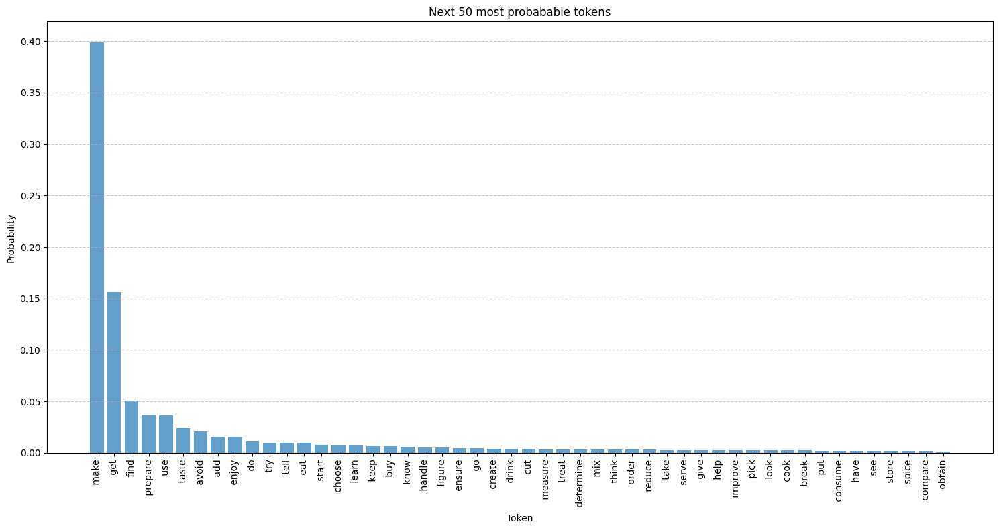

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make


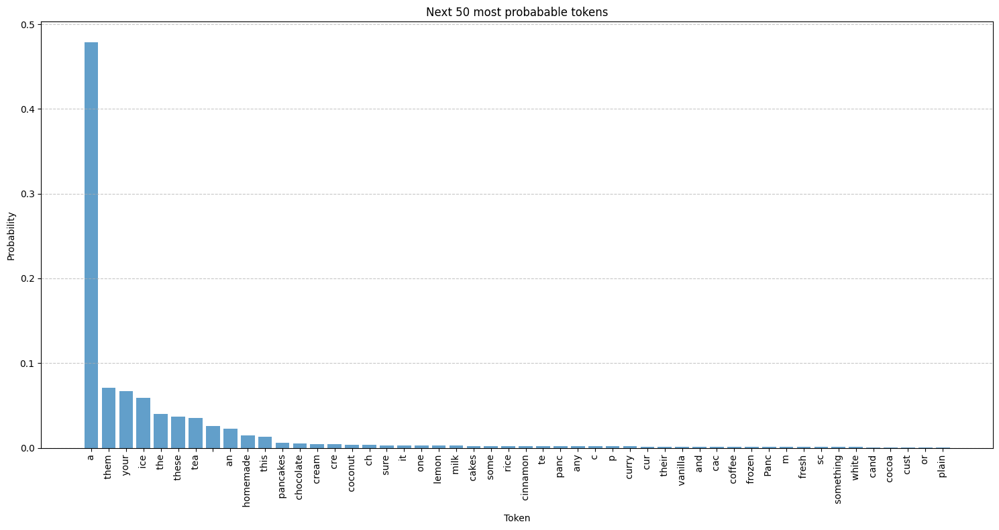

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a


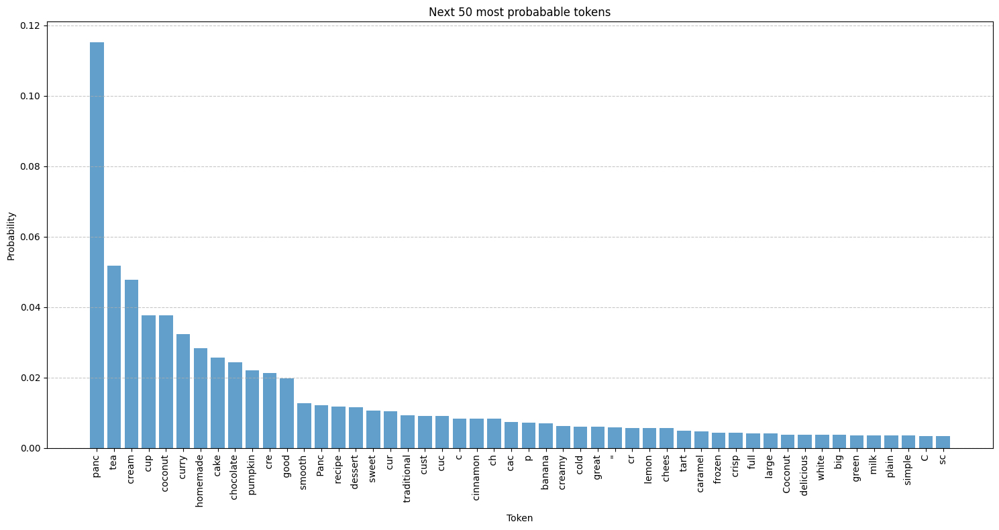

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a panc


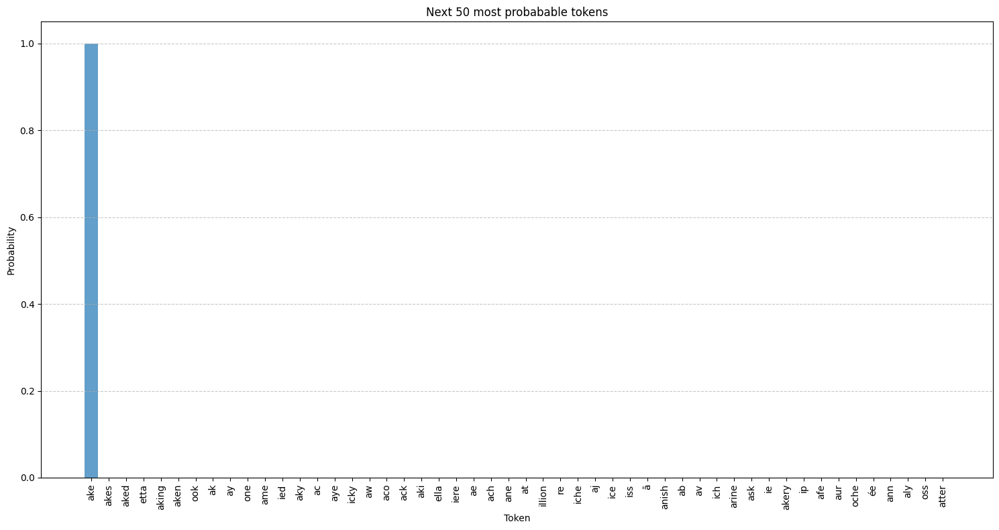

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake


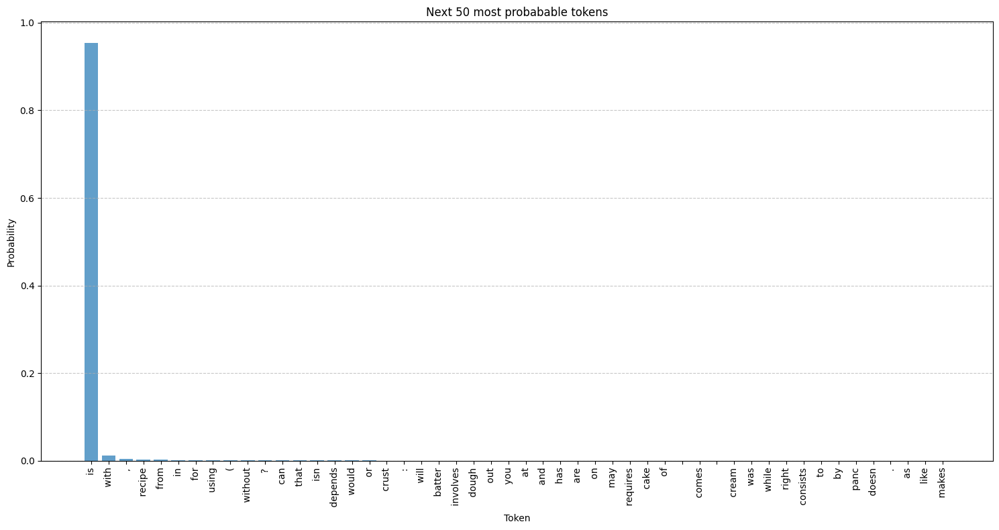

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is


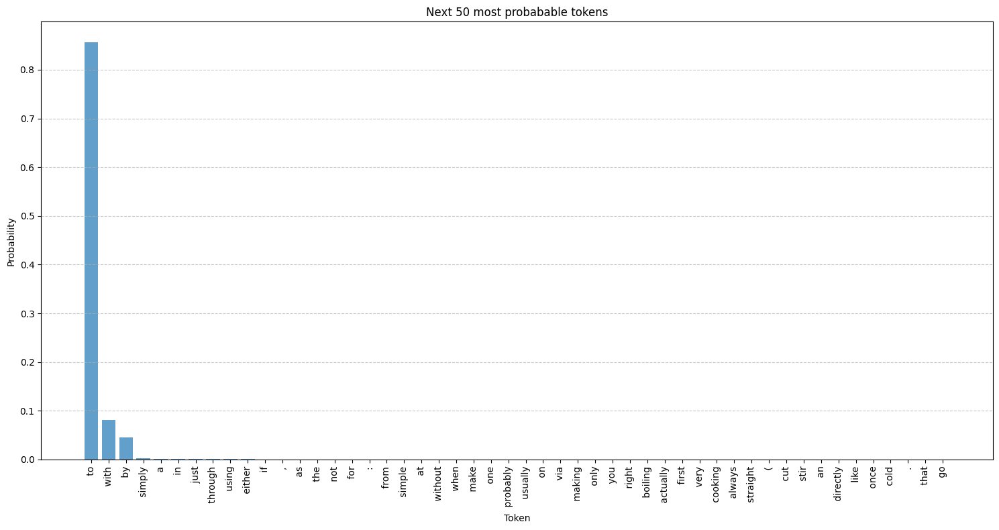

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to


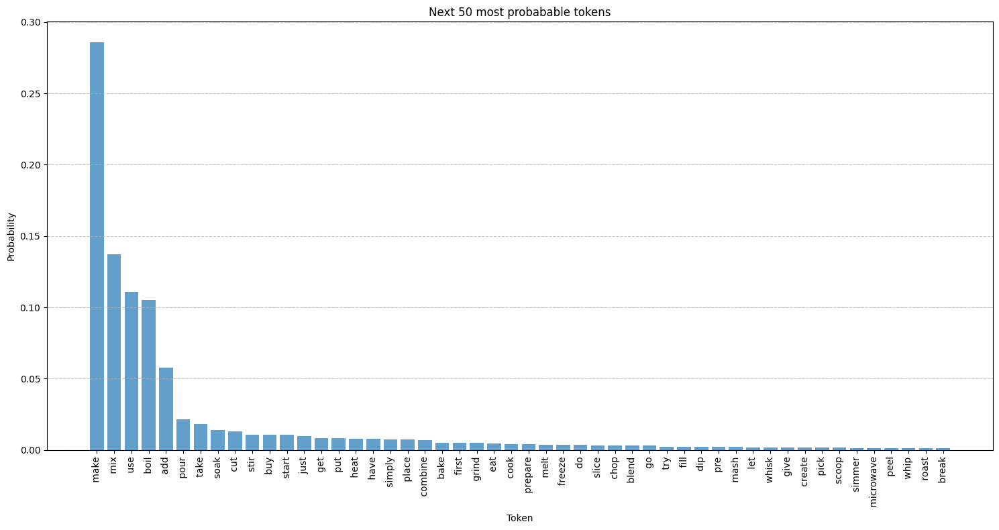

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make


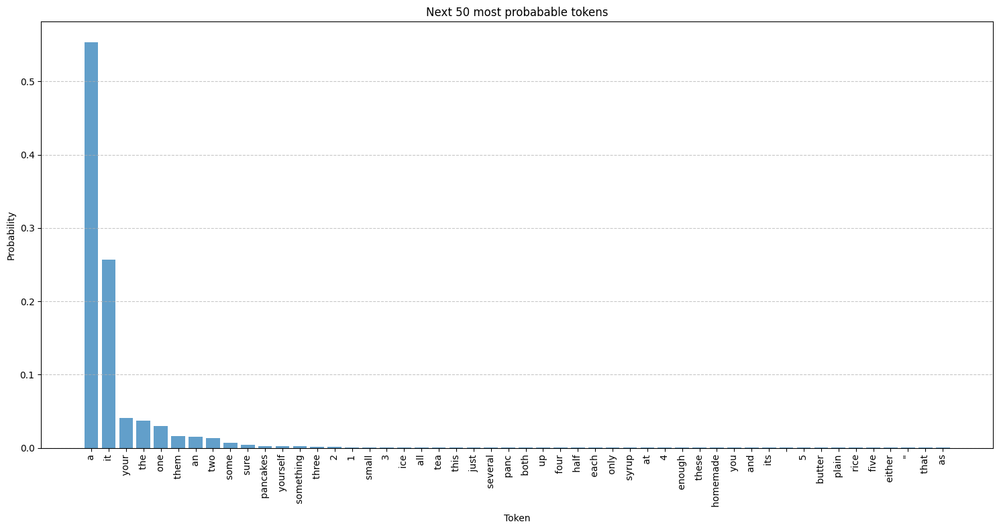

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a


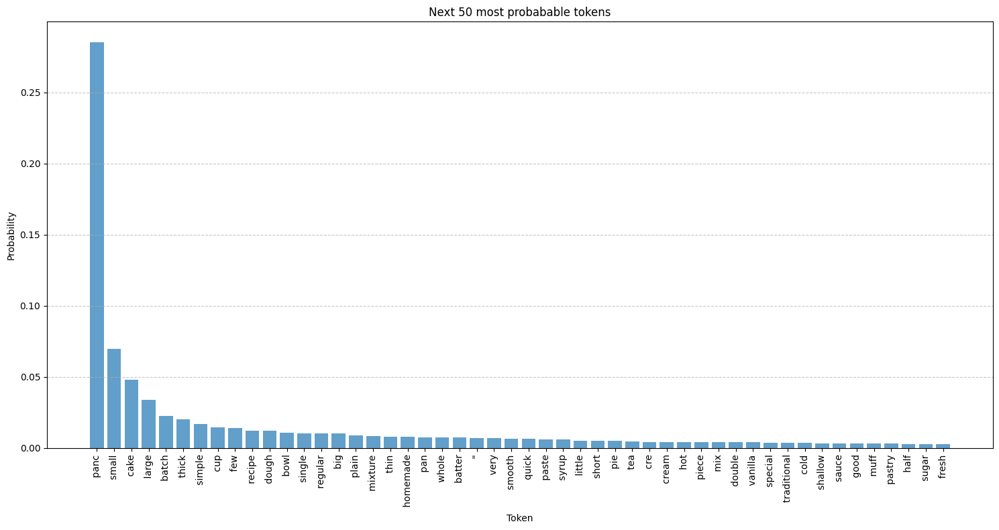

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a panc


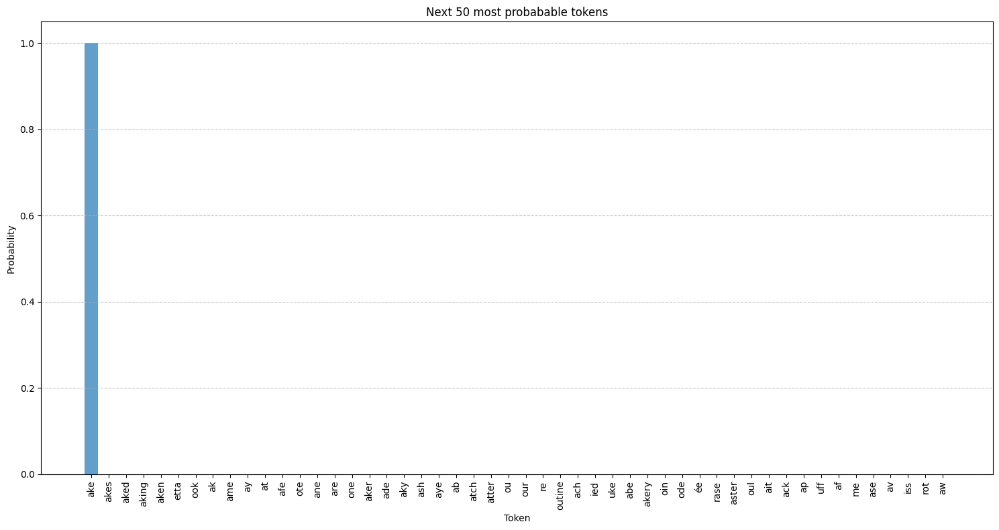

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake


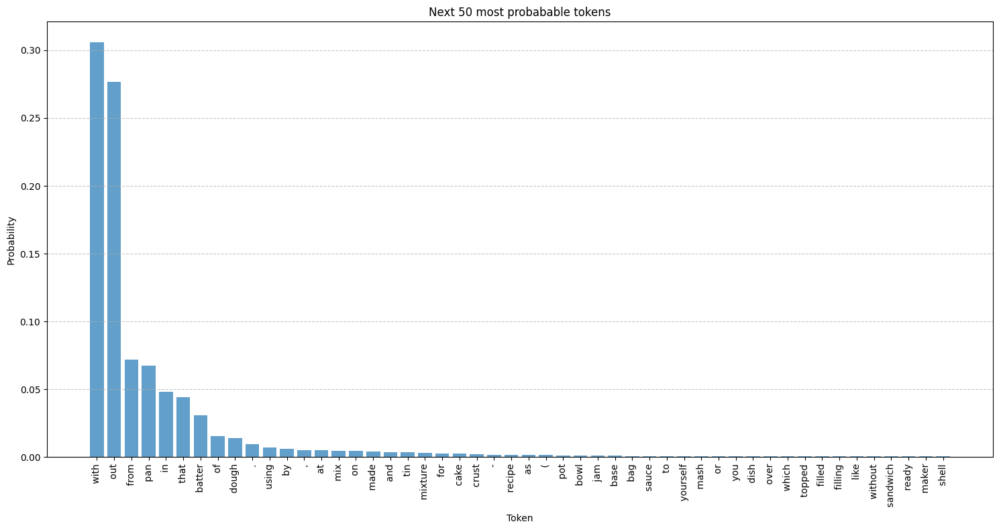

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with


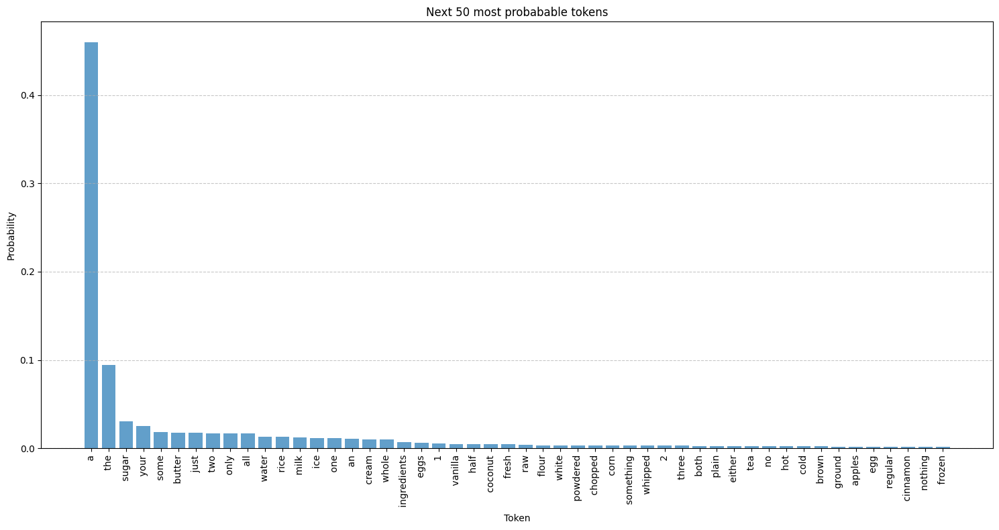

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a


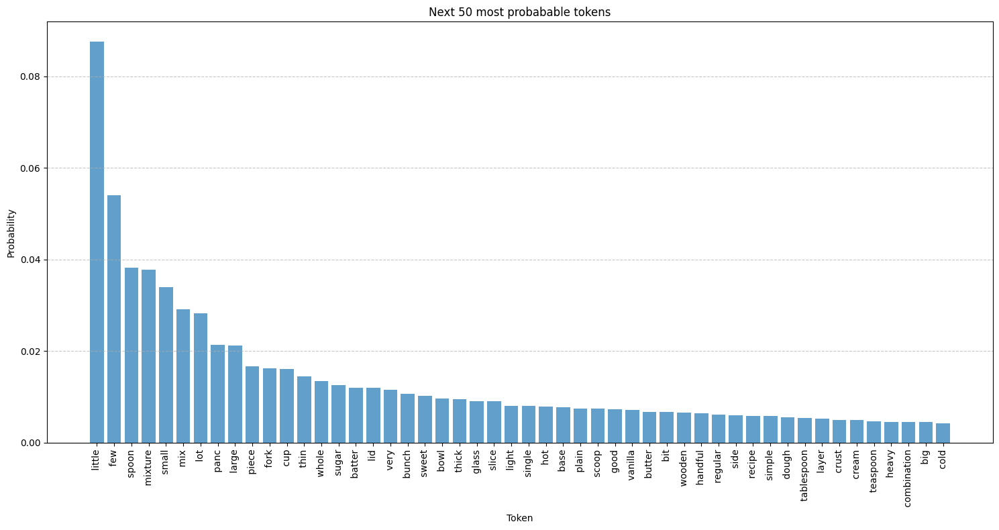

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little


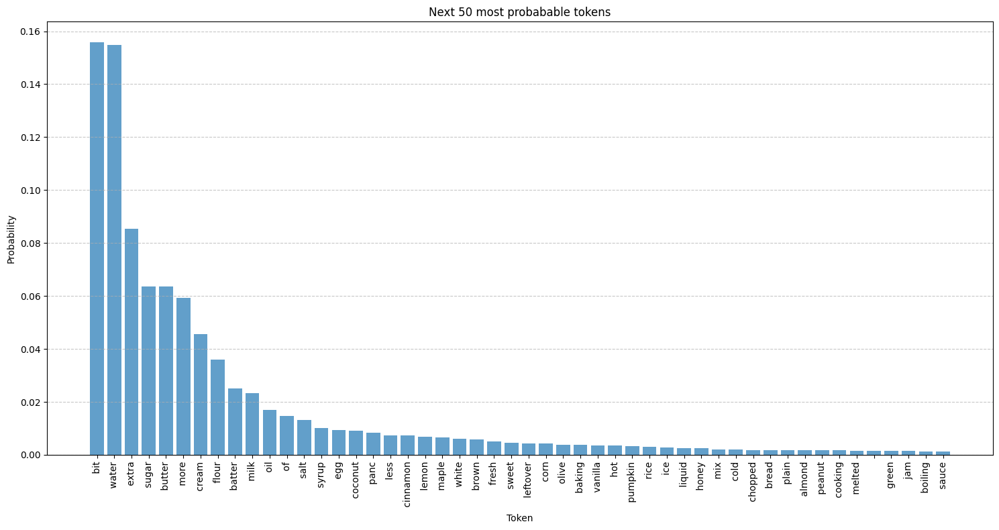

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit


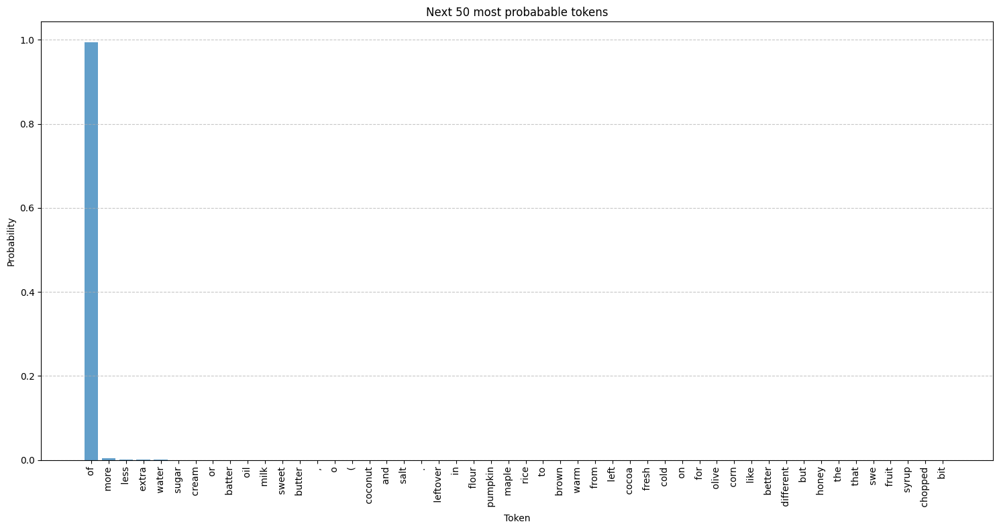

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of


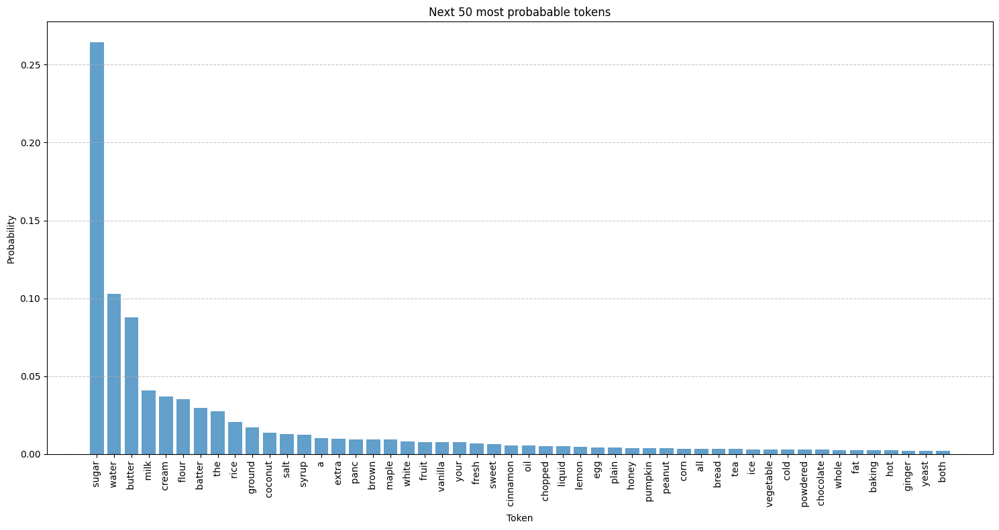

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar


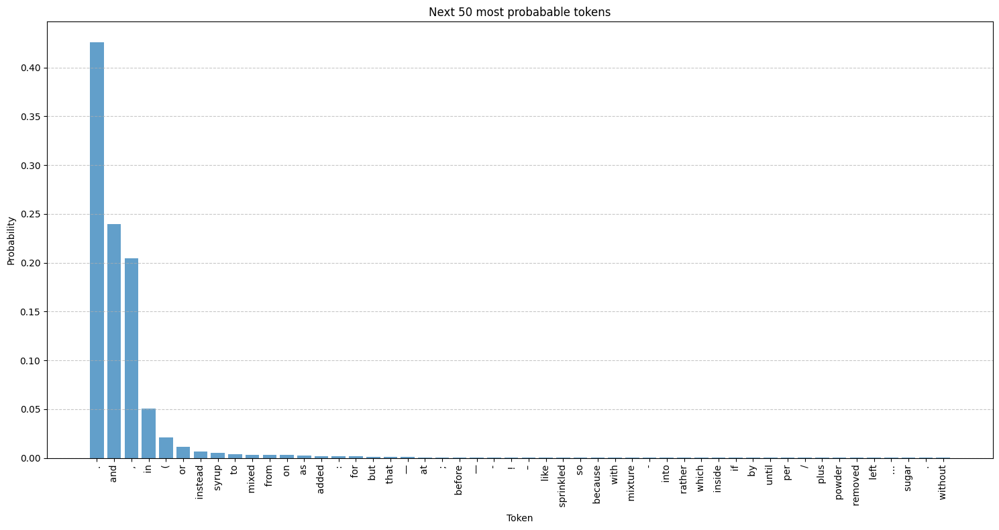

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar.


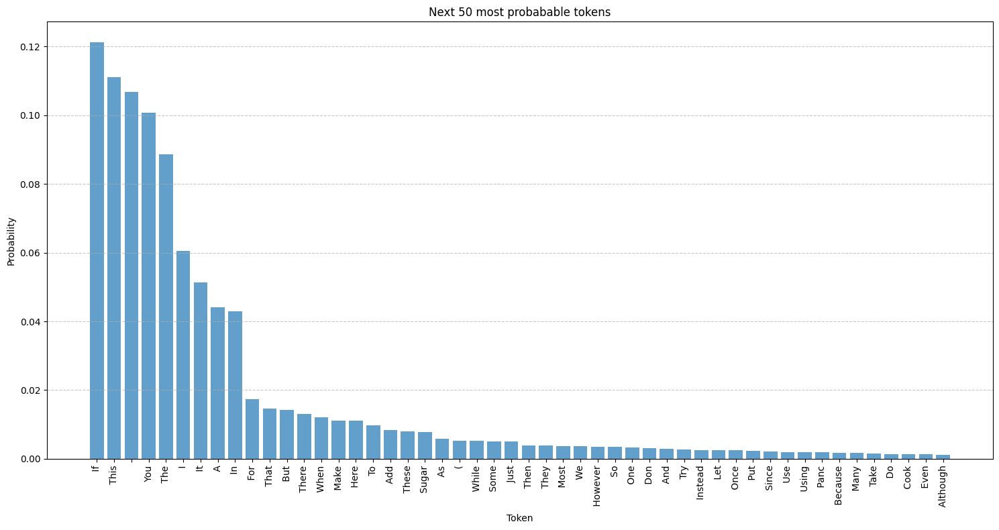

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar. If


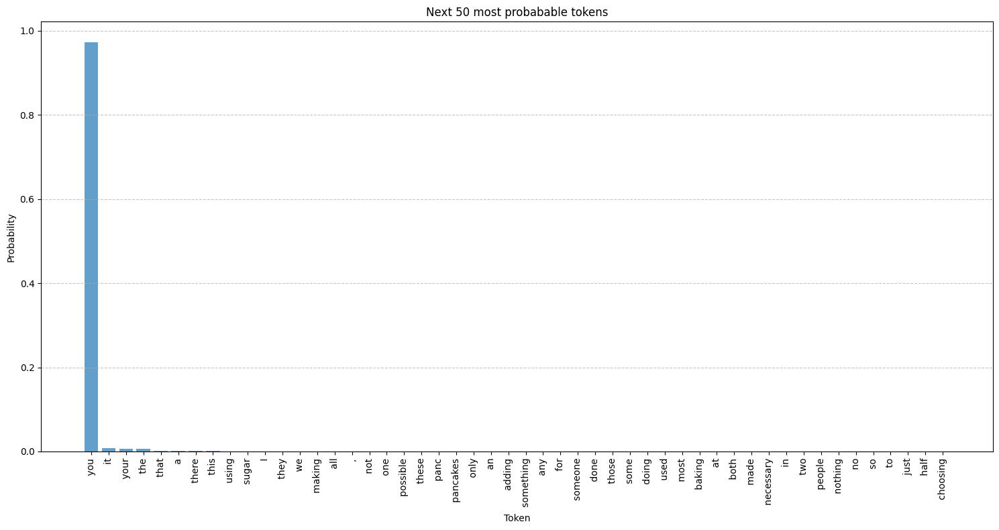

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar. If you


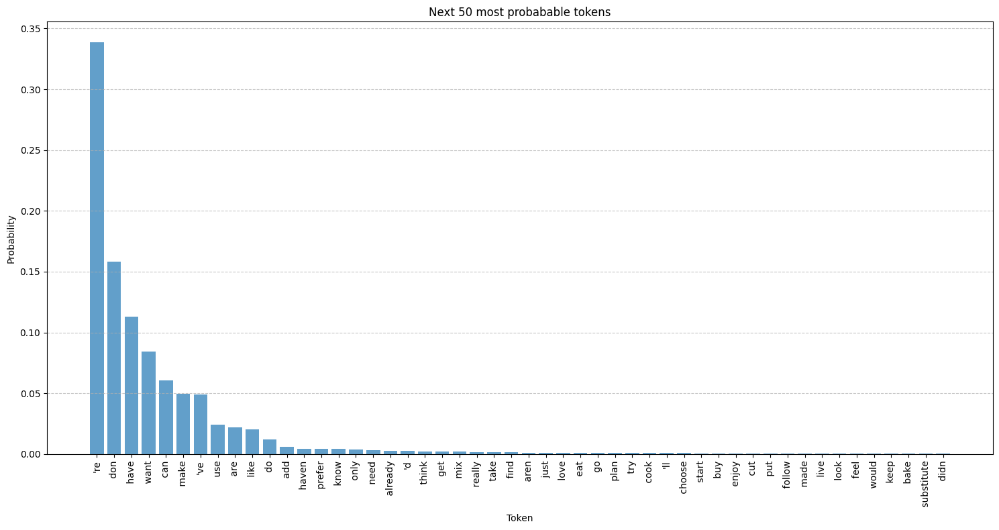

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar. If you're


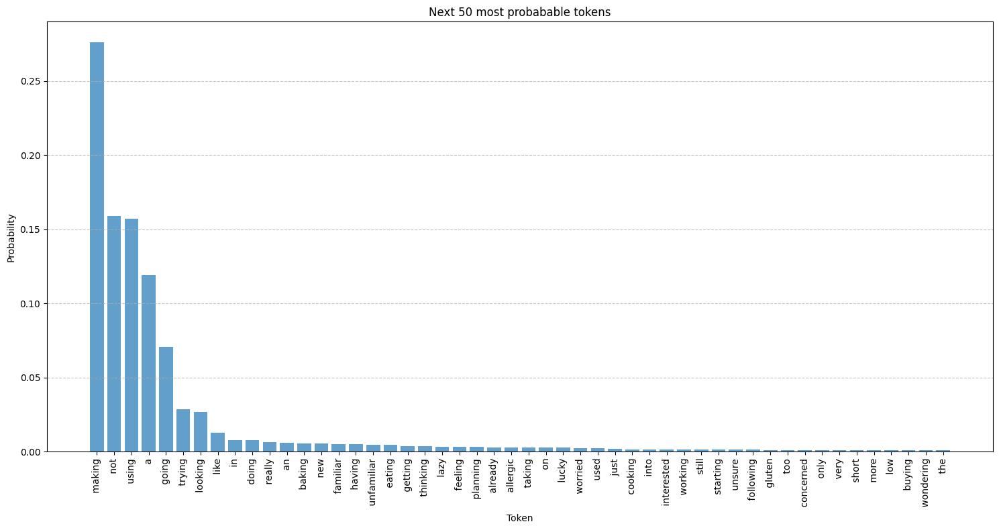

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar. If you're making


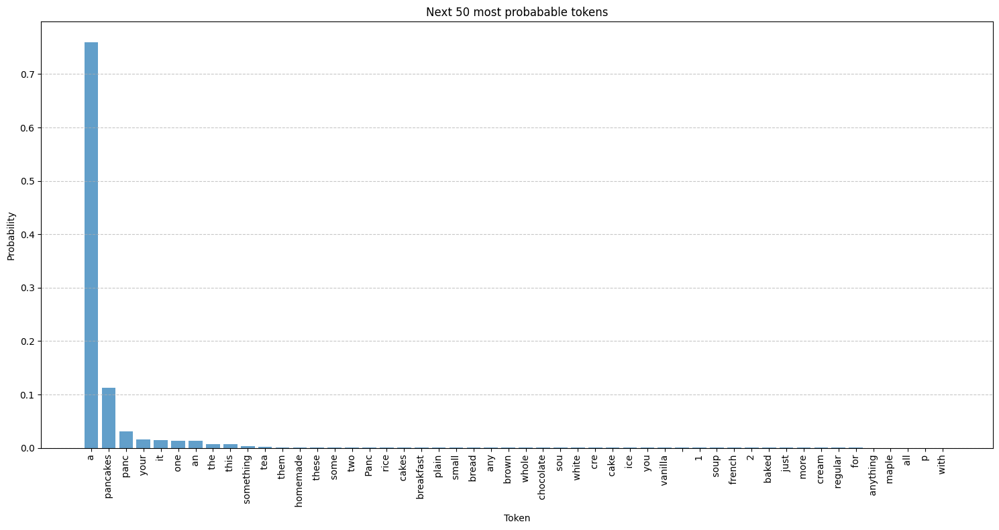

Generated so far: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar. If you're making a
Input text: Pancakes are good for ...
**Final generated text: Pancakes are good for iced tea, but they're not as good for tea as they look.

The best way to make a pancake is to make a pancake with a little bit of sugar. If you're making a


In [ ]:
# @title
# PLOTS FOR NEXT MOST PROBABLE TOKEN WITHOUT USING THE MULTINOMIAL DISTRIBUTION
for _ in range(max_length - len(input_ids[0])):

    # Pass the current input_ids through the model to get the logits
    with torch.no_grad():
        #outputs = model(input_ids)
        outputs = model(input_ids, attention_mask=torch.ones(input_ids.shape, dtype=torch.long))

    logits = outputs.logits[:, -1, :] # Get the logits for the last token\

    logits = logits / 0.7

    probs = torch.softmax(logits, dim=-1) # Convert logits to probabilities

    next_token_id = torch.argmax(probs, dim=-1).unsqueeze(-1) # Select the token with the highest probability

    input_ids = torch.cat([input_ids, next_token_id], dim=-1) # Append the selected token to the input sequence

    current_text = tokenizer.decode(input_ids[0], skip_special_tokens=True) # Decode the current state of the sequence and print it

    #Extract the top 50 probabilities and their indices
    #probs = torch.softmax(logits, dim=-1)
    top_probs, top_indices = torch.topk(probs, 50)

    #Convert to numpy for plotting
    #flatten() minimizes the dimensions of the tensor to 1
    top_probs_np = top_probs.detach().numpy().flatten()
    top_indices_np = top_indices.detach().numpy().flatten()

    #Decode the top indices to get their corresponding tokens

    top_tokens = [tokenizer.decode([idx]) for idx in top_indices_np]

    #Plotting them
    plt.figure(figsize=(15, 8))
    plt.bar(np.arange(50), top_probs_np, alpha=0.7)
    plt.xlabel('Token')
    plt.ylabel('Probability')
    plt.title('Next 50 most probabable tokens')
    plt.xticks(np.arange(50), top_tokens, rotation='vertical')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    print(f"Generated so far: {current_text}")

    #Stop if the model generates a special end-of-sequence token
    if next_token_id.item() == tokenizer.eos_token_id:
        break

final_text = tokenizer.decode(input_ids[0], skip_special_tokens=True)
print(f"Input text: {input_text}...")
print(f"**Final generated text: {final_text}")


**PROBABILITIES FOR NEXT MOST PROBABLE TOKEN *USING* THE MULTINOMIAL DISTRUBUTION & SAMPLING + TOTAL ENTROPY**

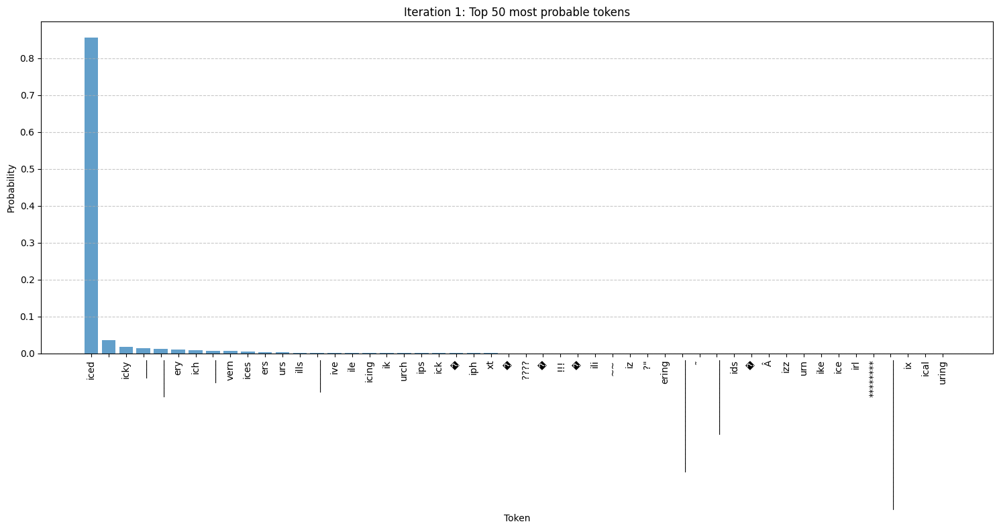

Generated so far: Pancakes are good for iced


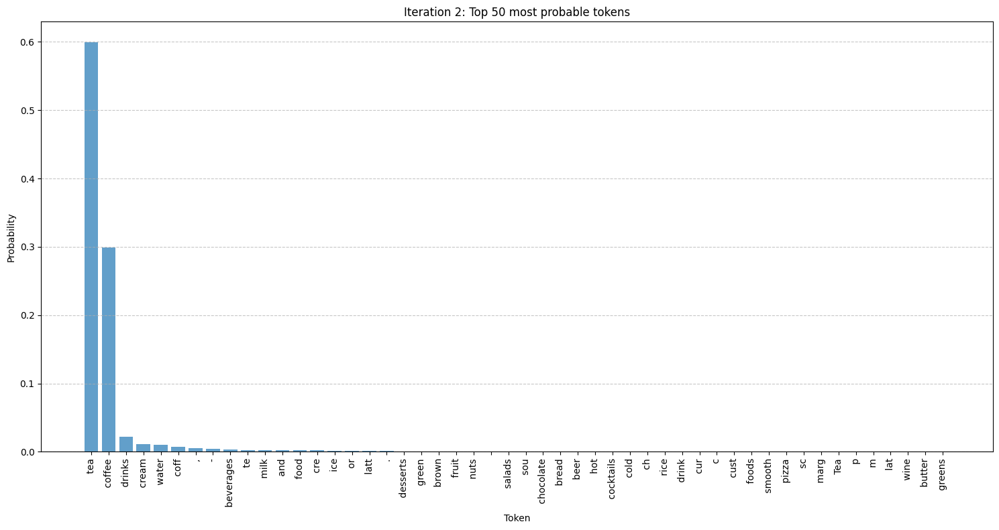

Generated so far: Pancakes are good for iced tea


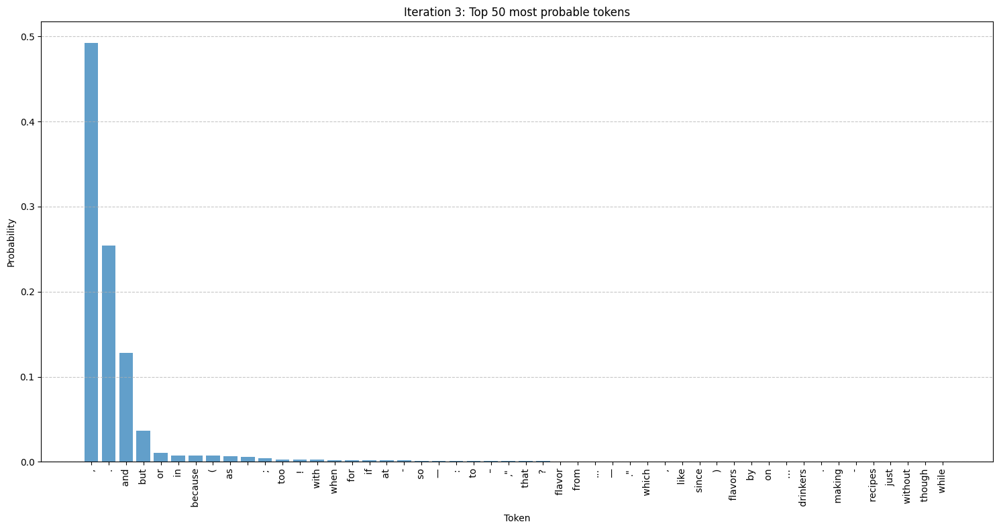

Generated so far: Pancakes are good for iced tea.


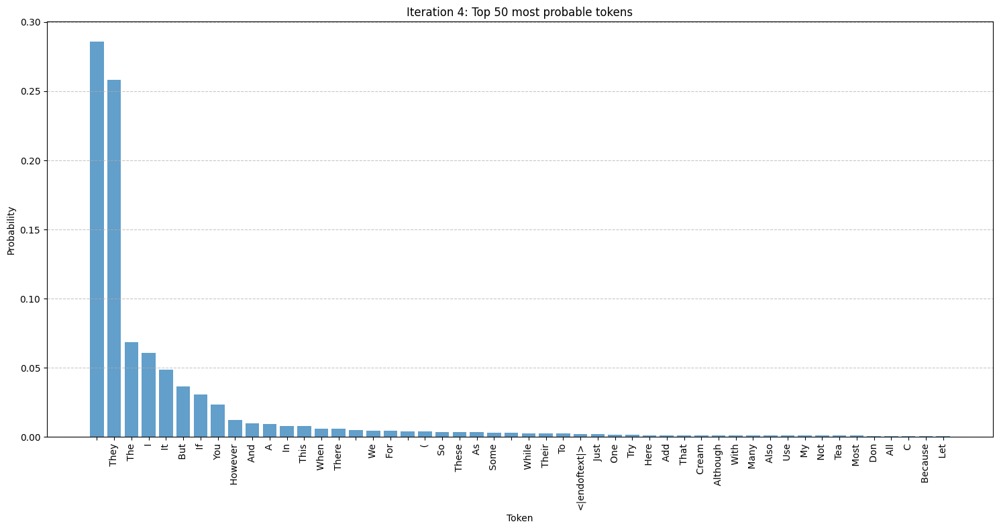

Generated so far: Pancakes are good for iced tea. Unless


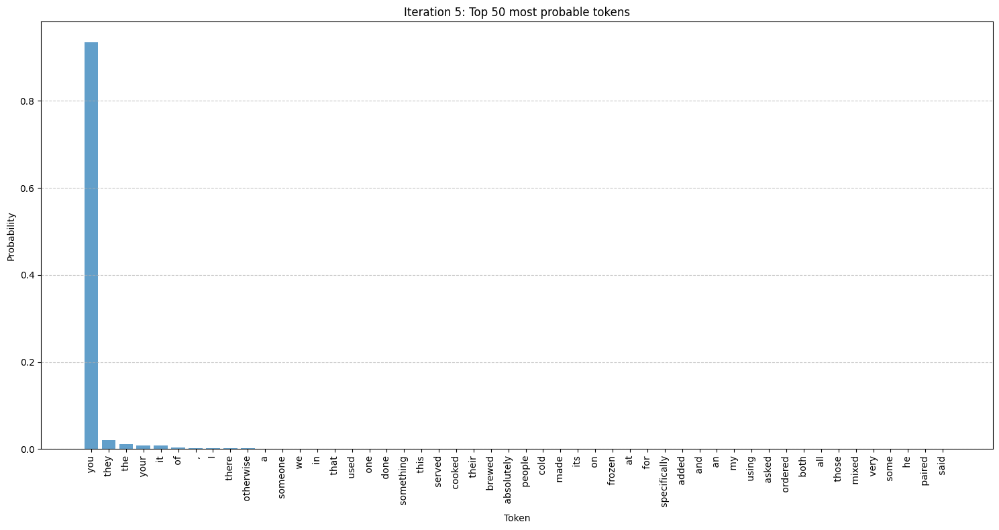

Generated so far: Pancakes are good for iced tea. Unless you


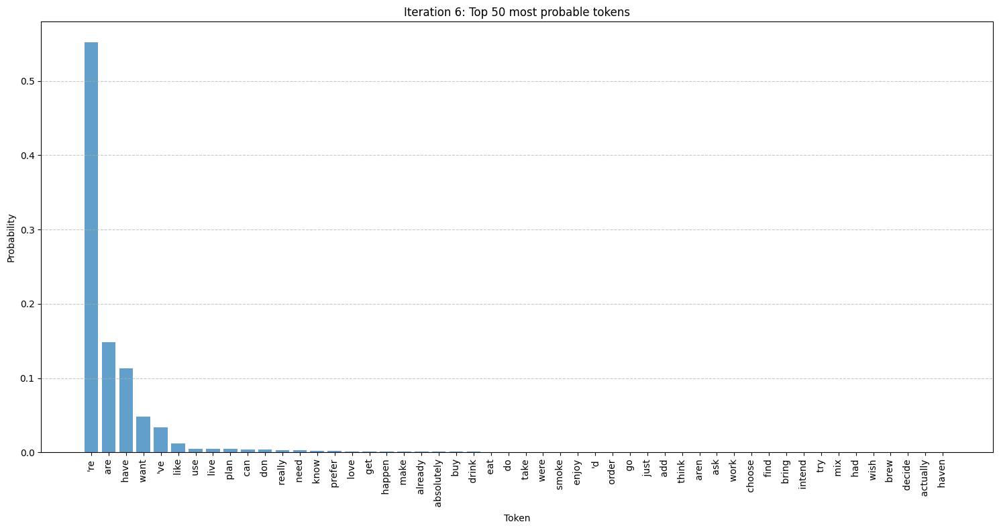

Generated so far: Pancakes are good for iced tea. Unless you have


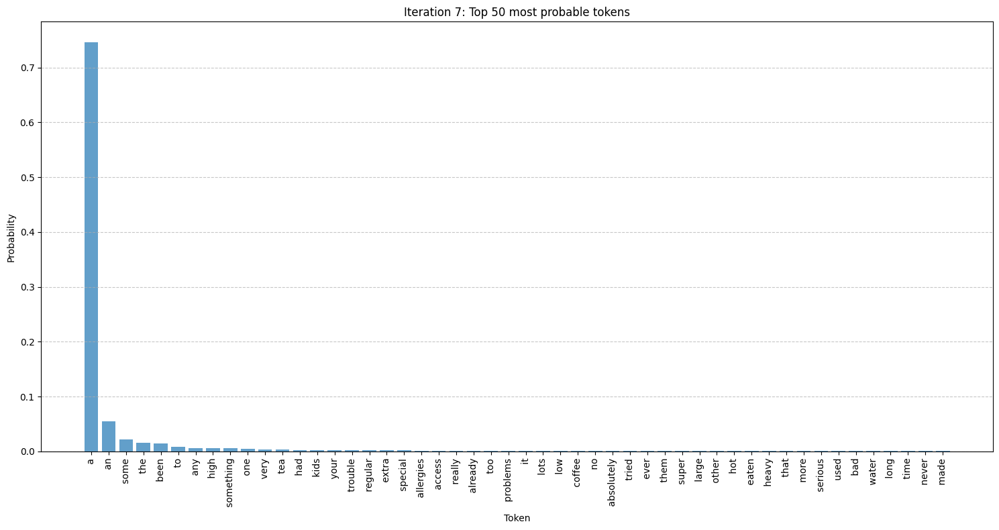

Generated so far: Pancakes are good for iced tea. Unless you have a


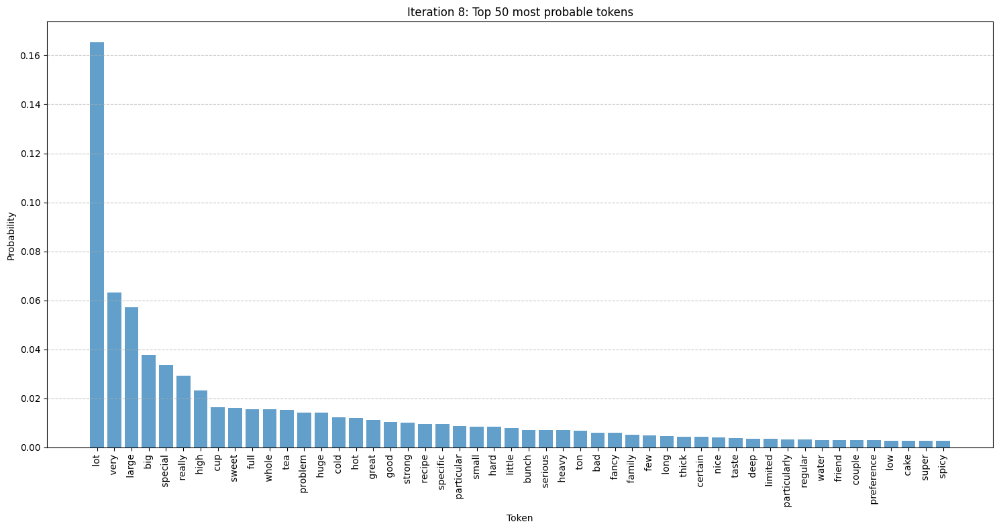

Generated so far: Pancakes are good for iced tea. Unless you have a very


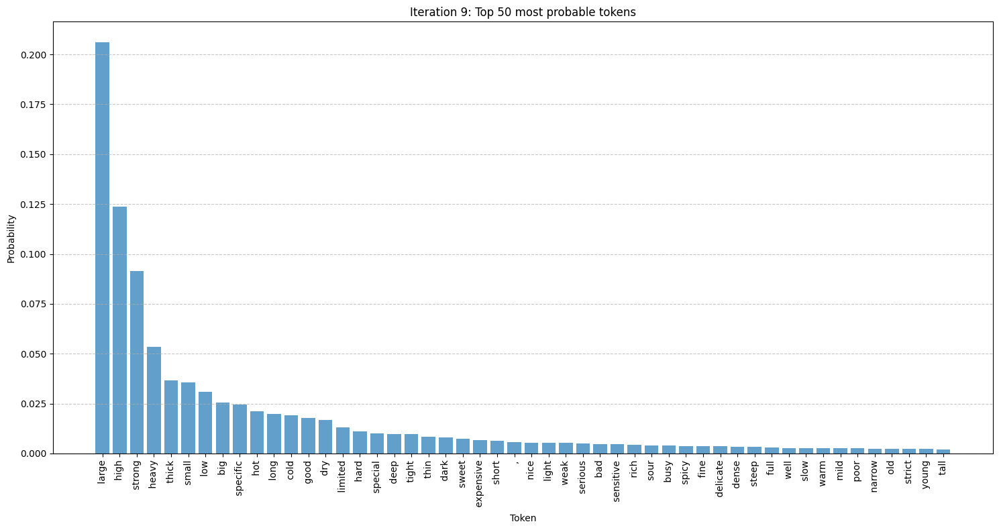

Generated so far: Pancakes are good for iced tea. Unless you have a very deep


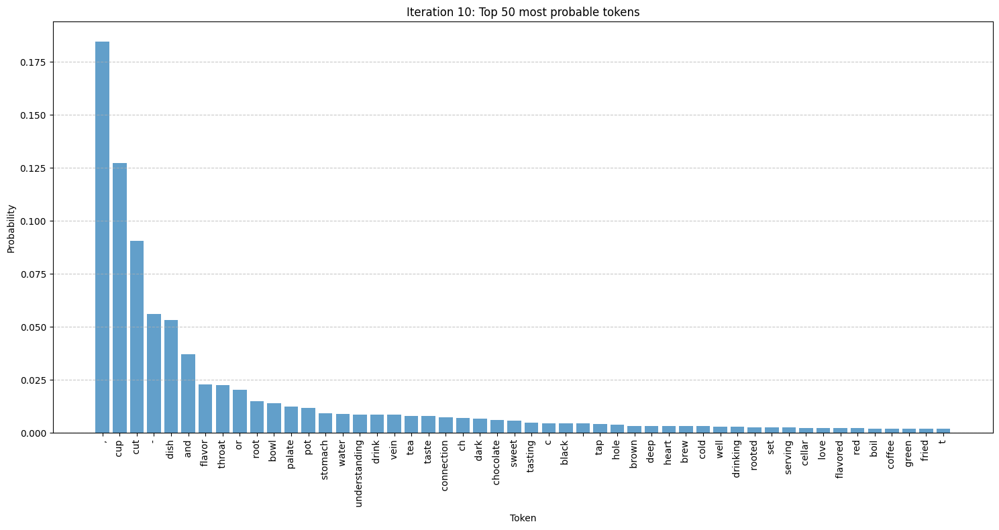

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup


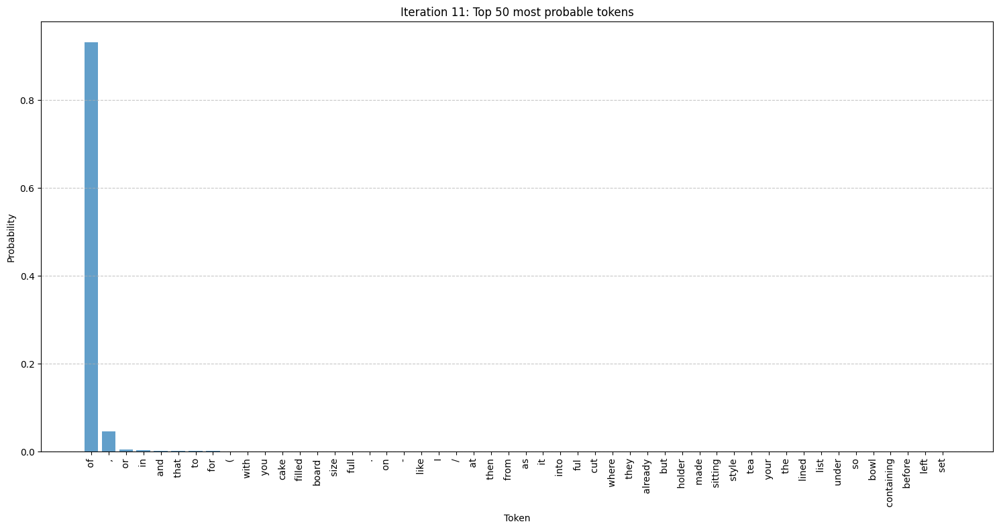

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of


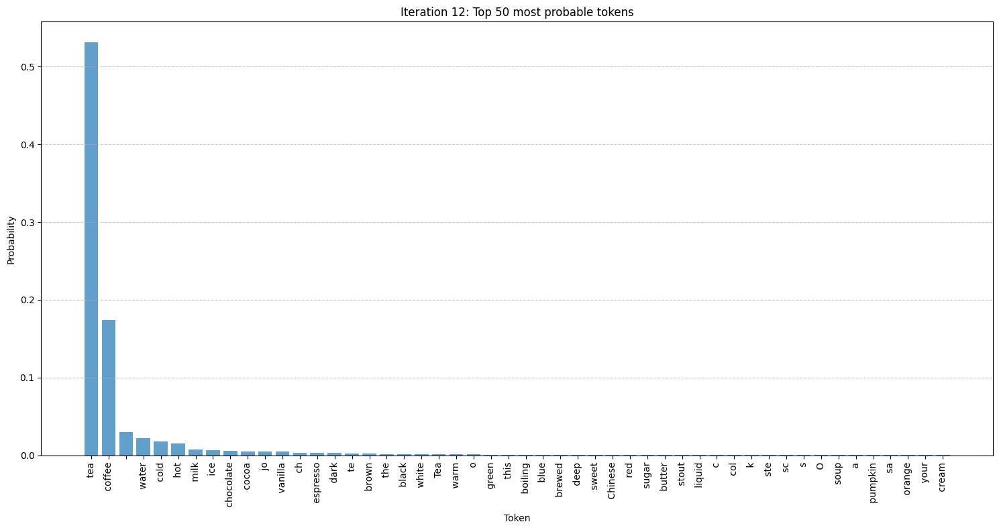

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea


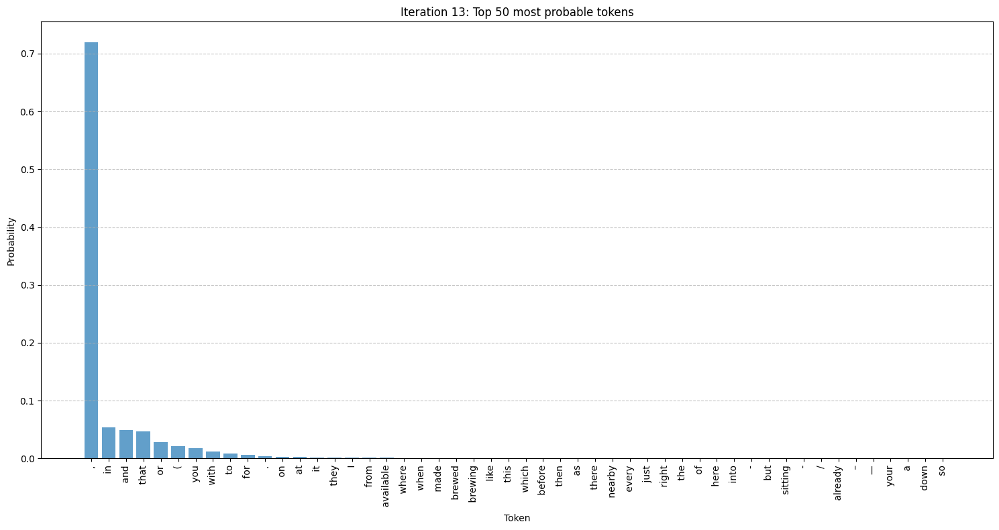

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea,


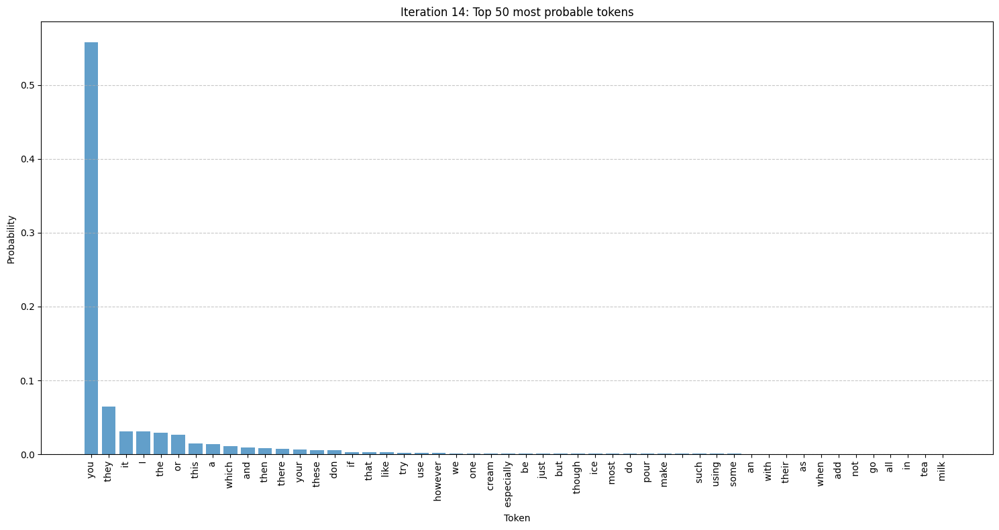

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you


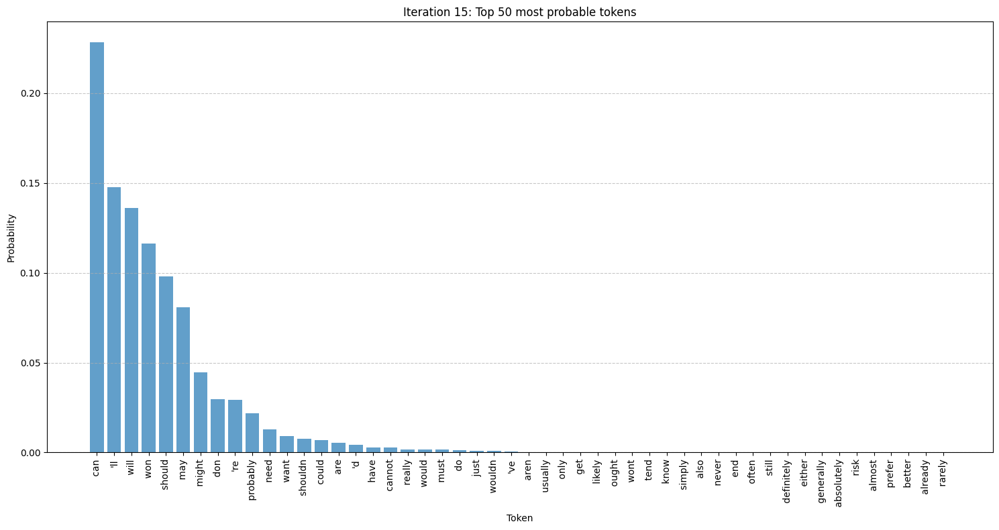

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won


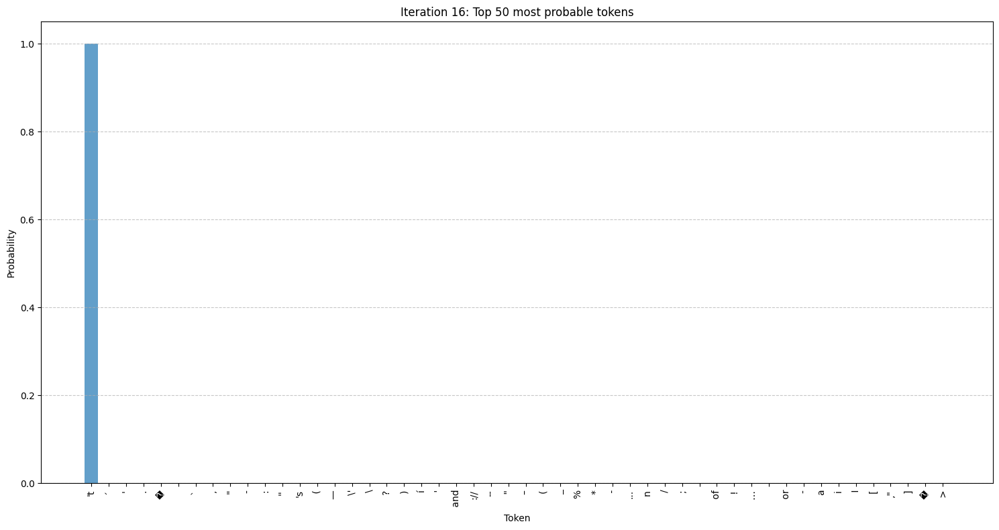

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't


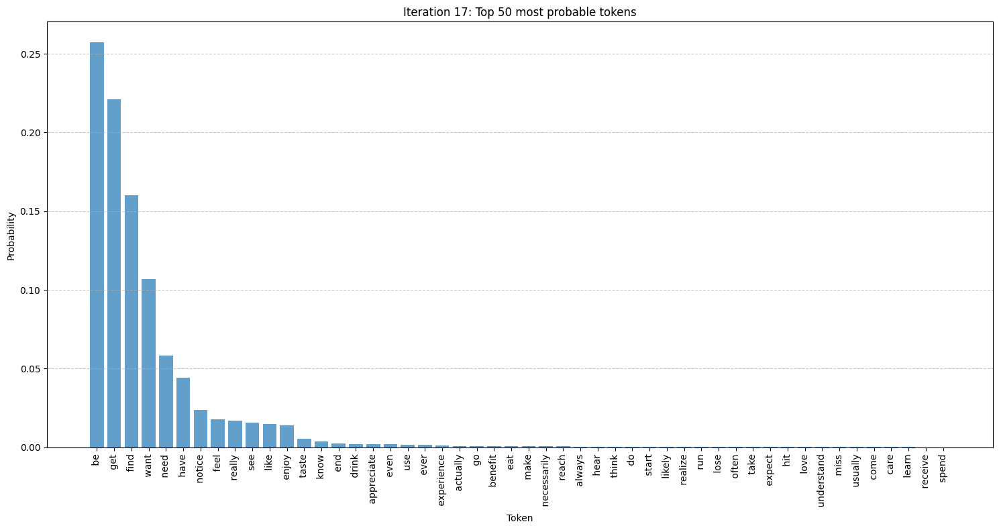

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be


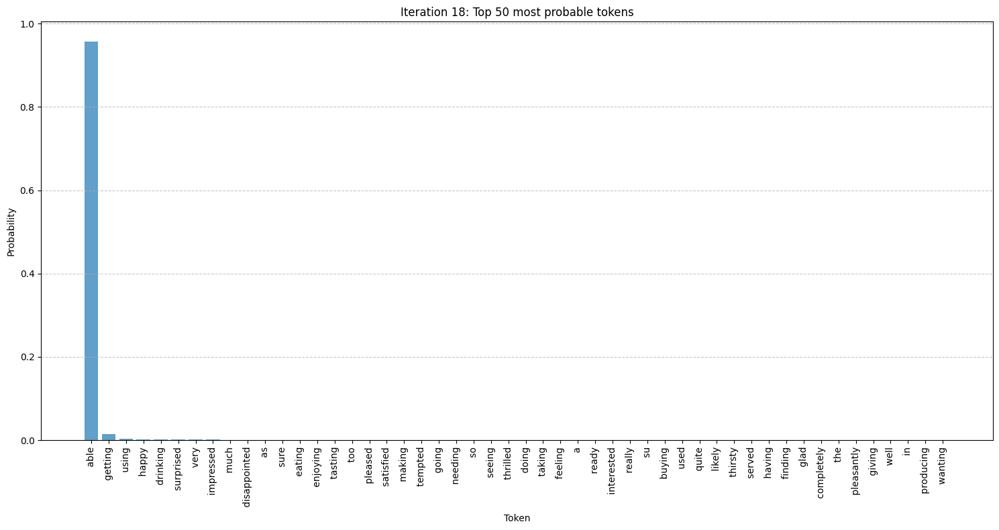

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able


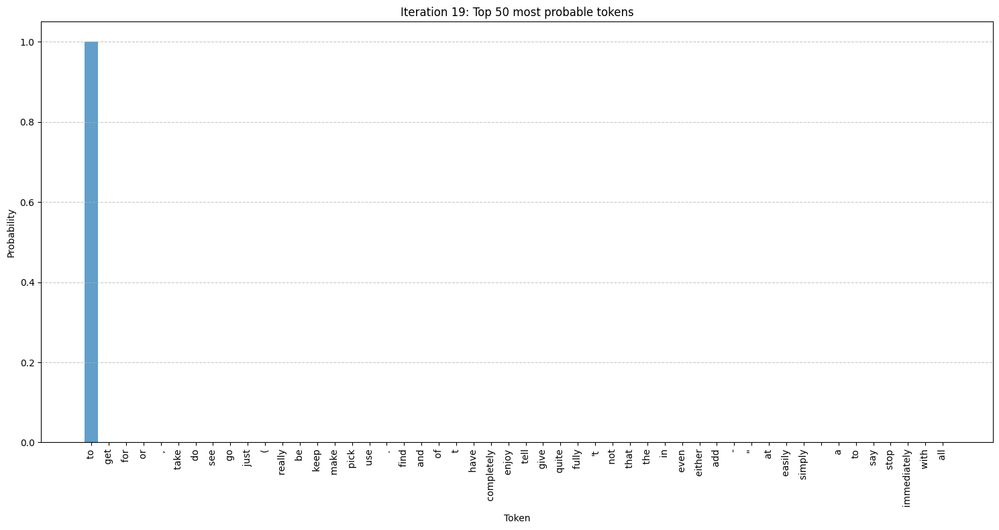

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to


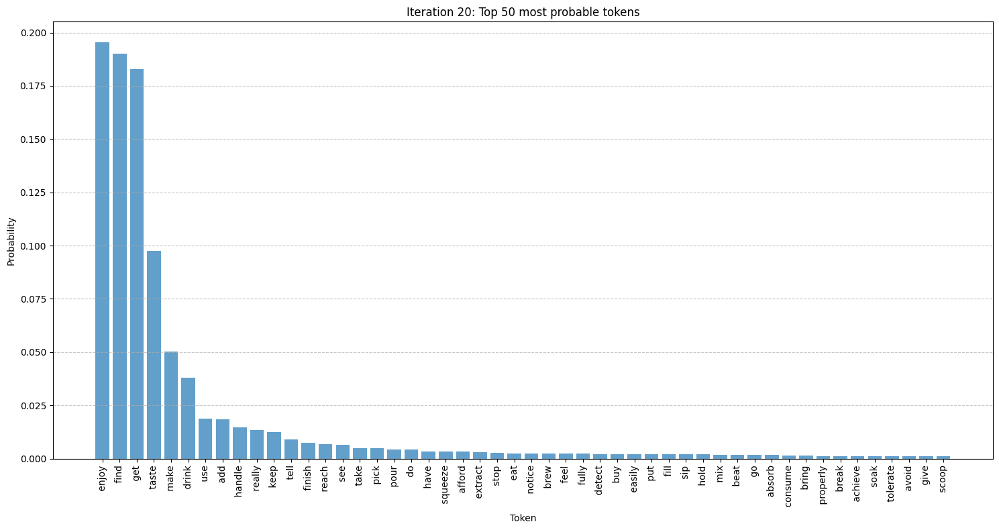

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get


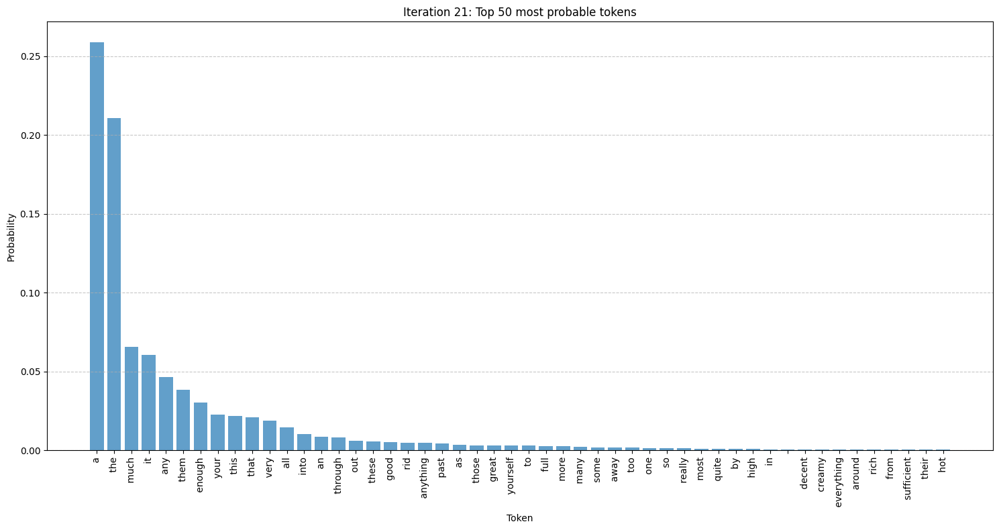

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a


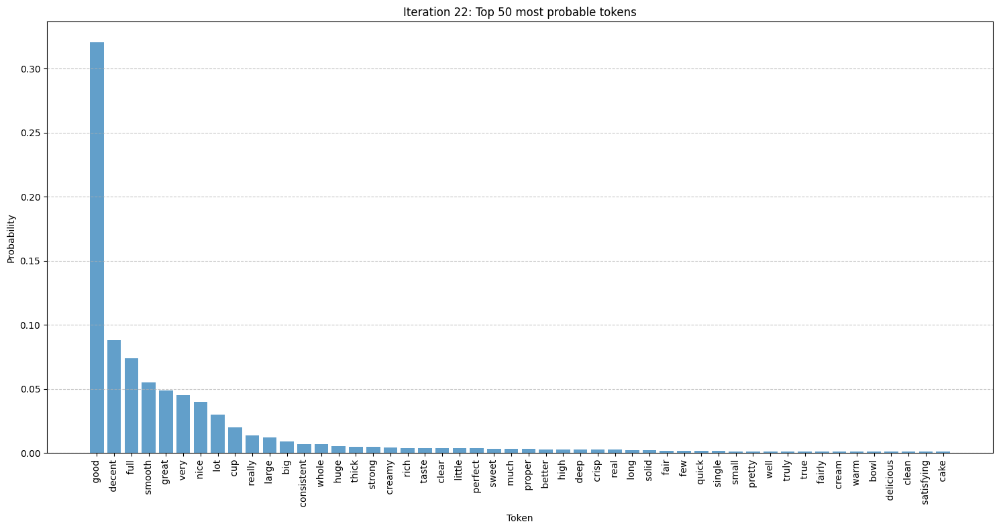

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good


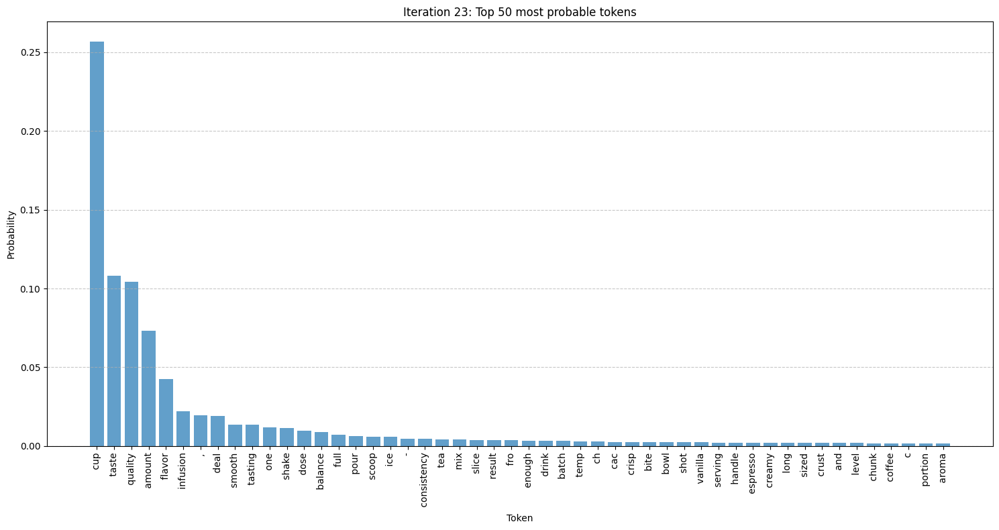

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor


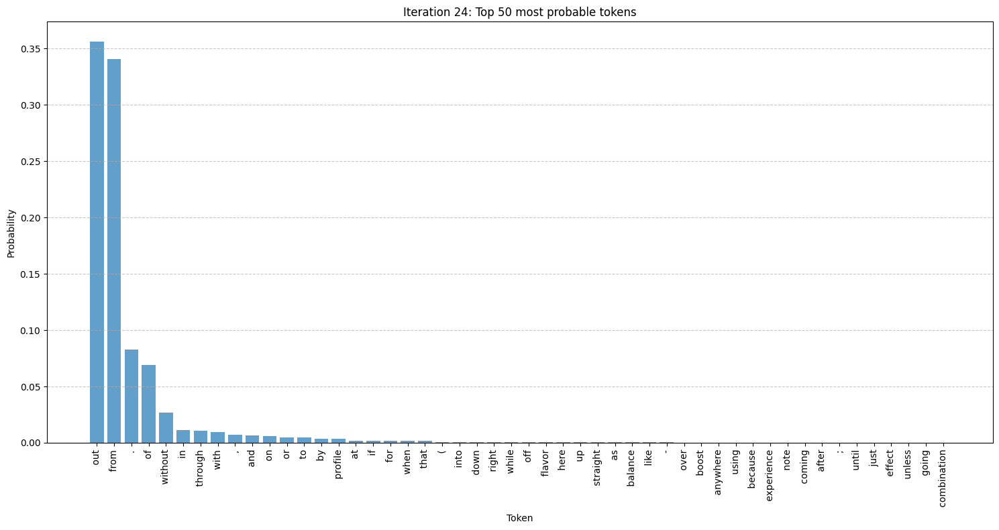

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out


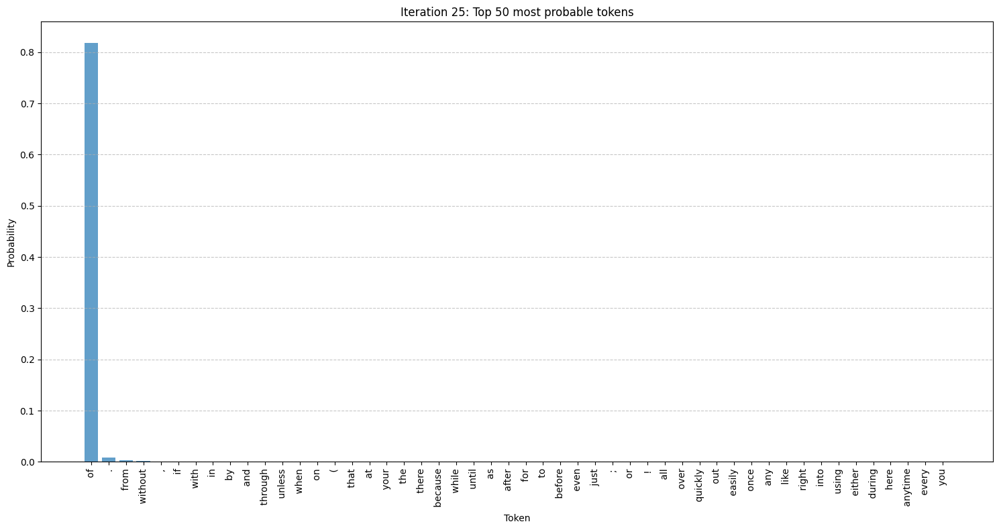

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of


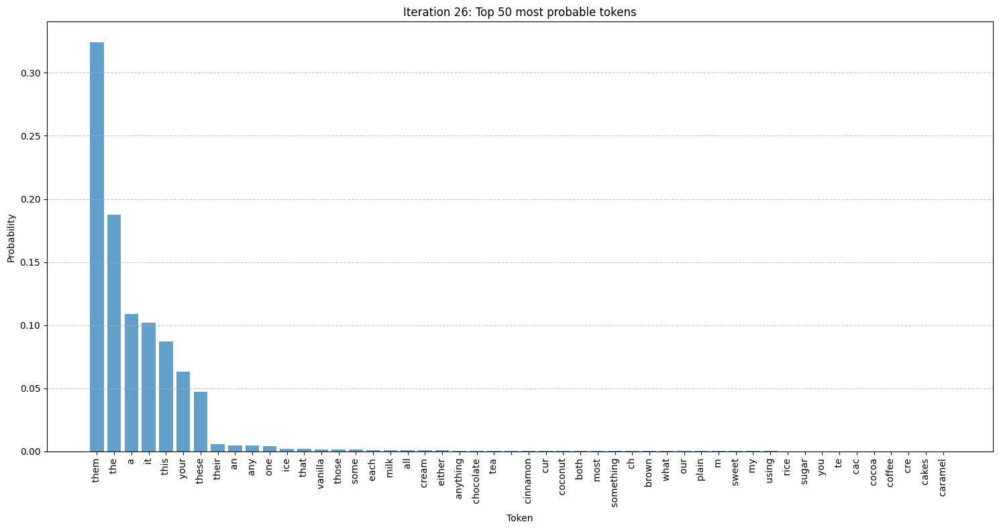

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them


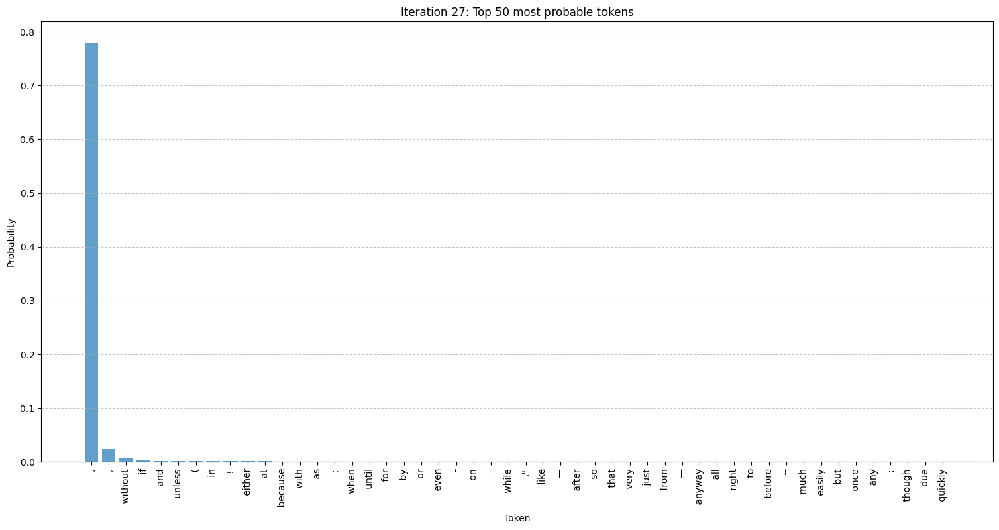

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.


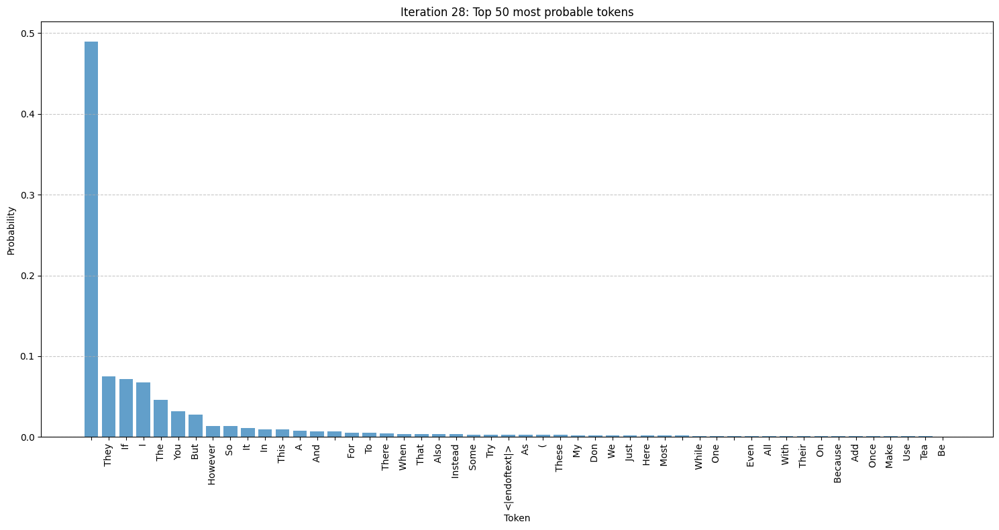

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.



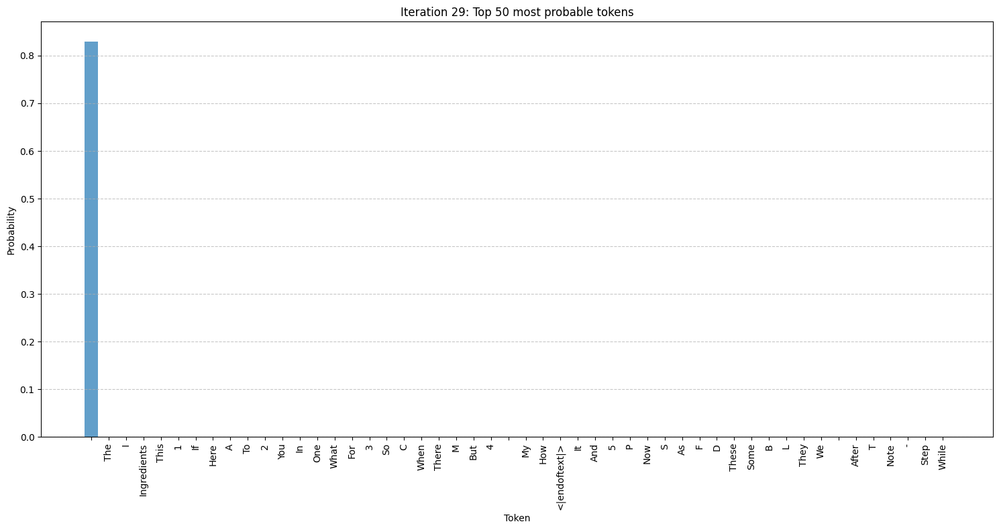

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.




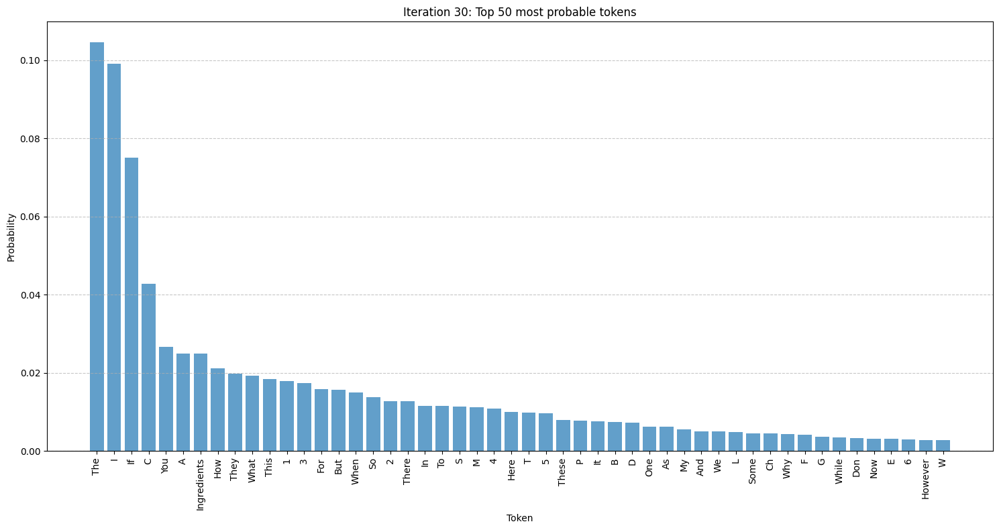

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I


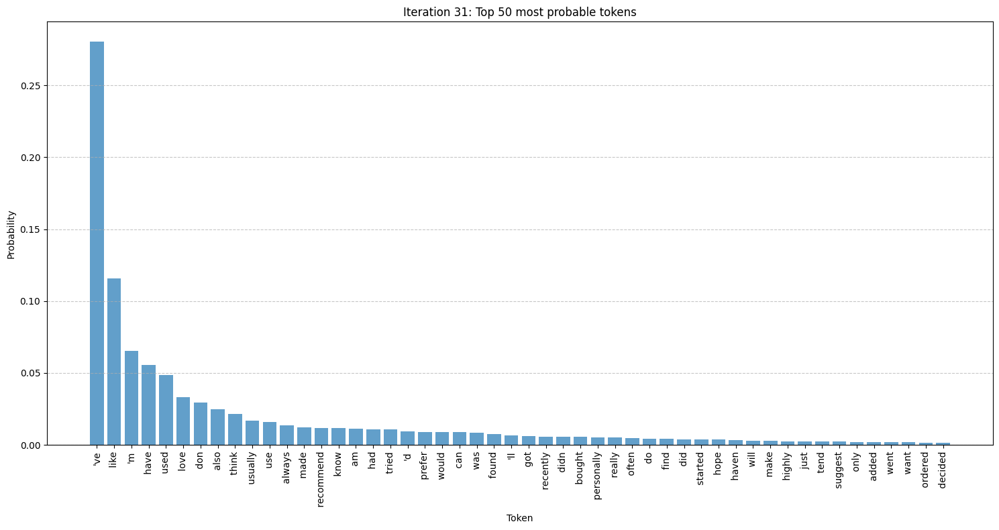

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used


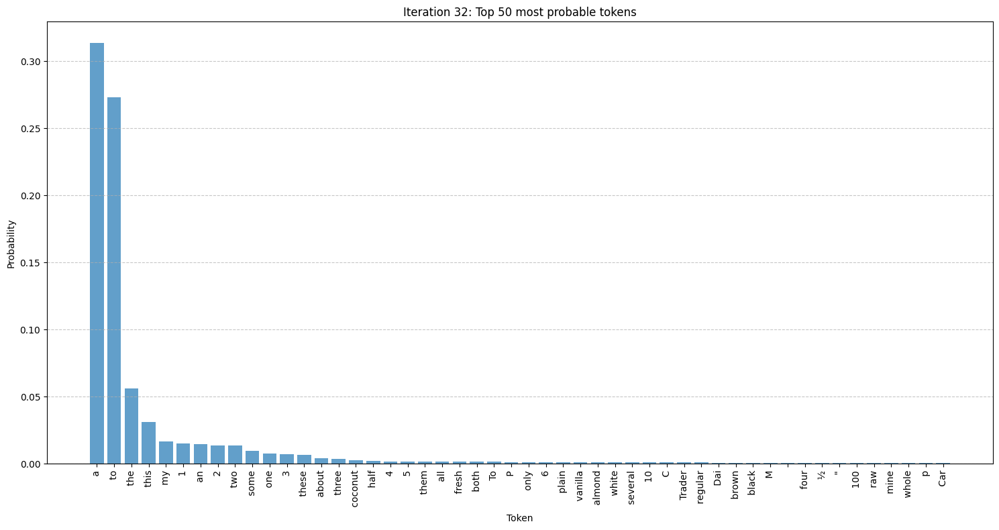

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a


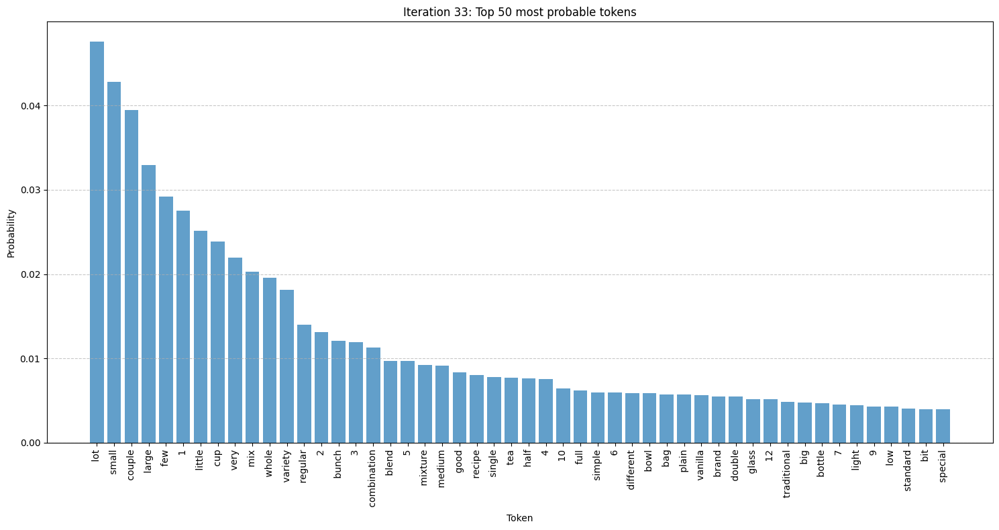

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot


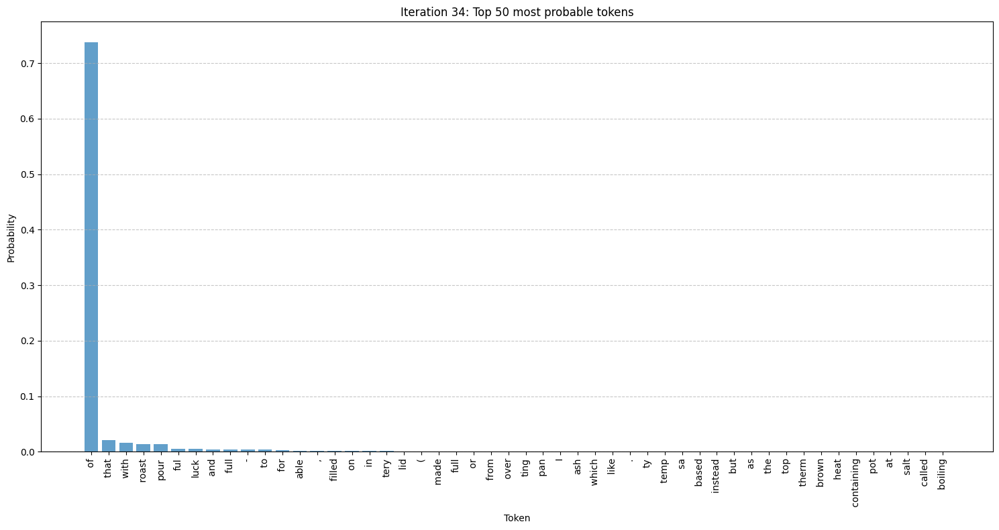

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of


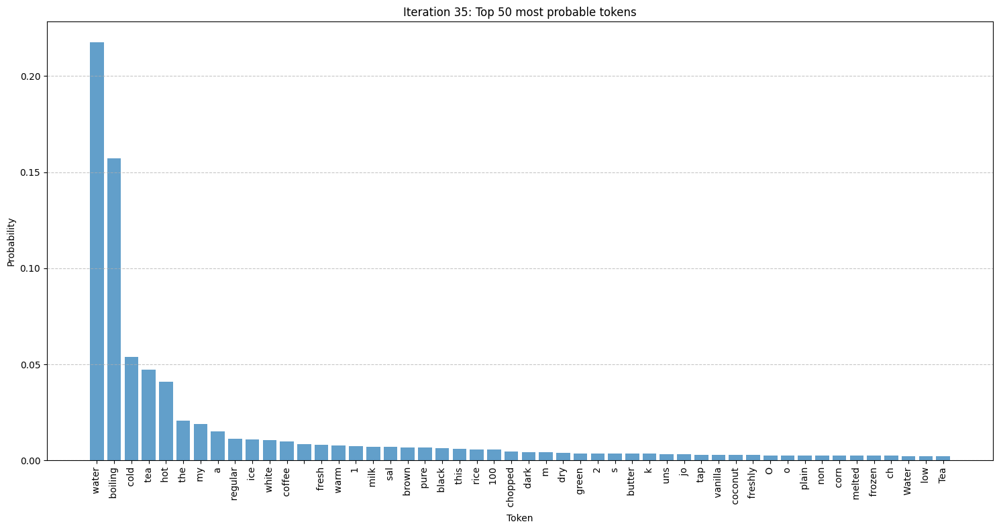

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white


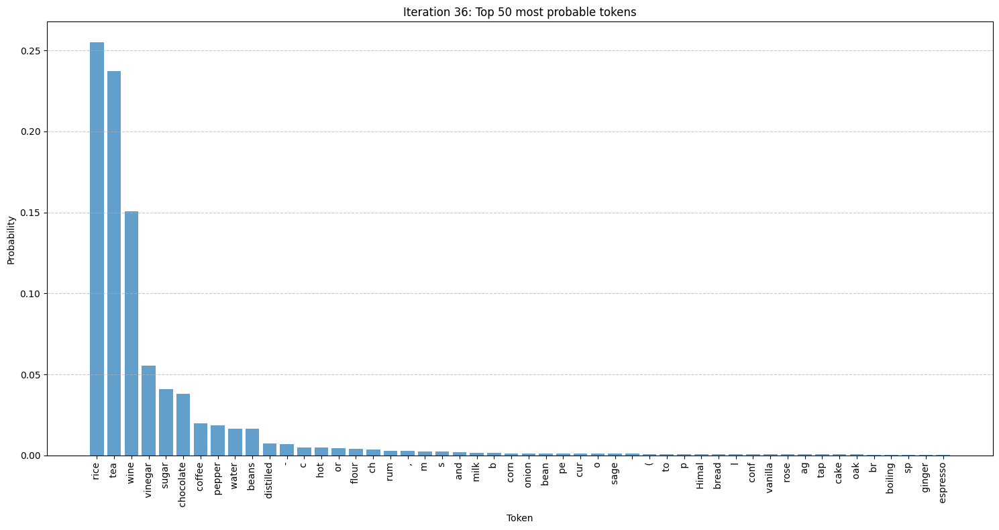

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine


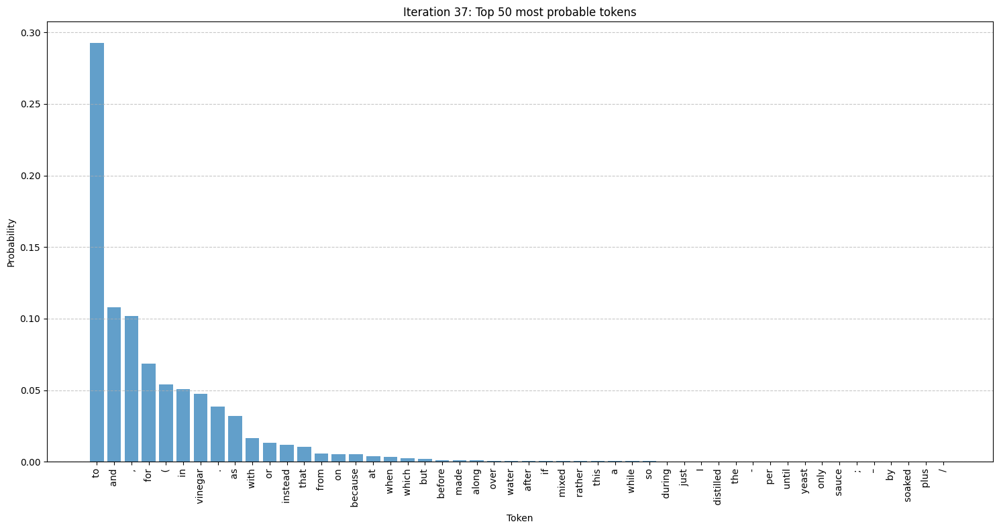

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to


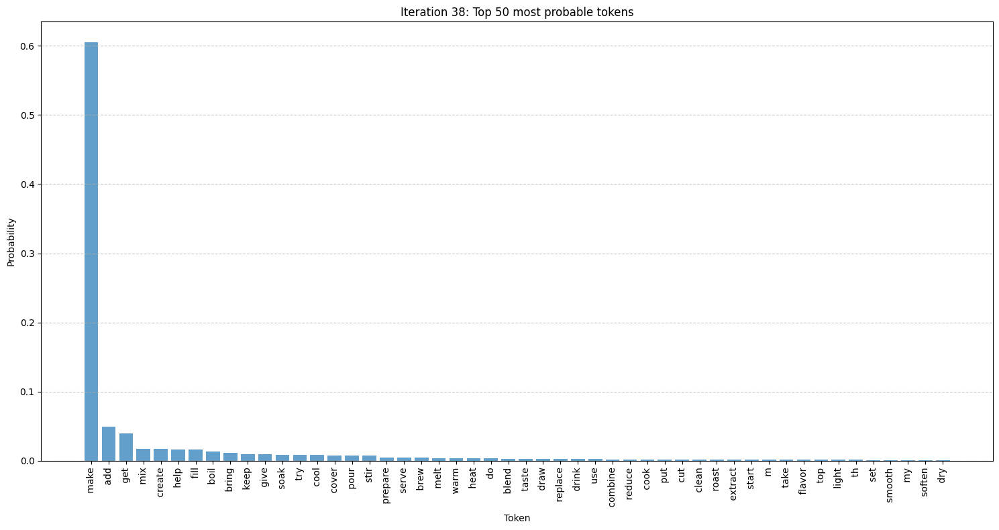

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make


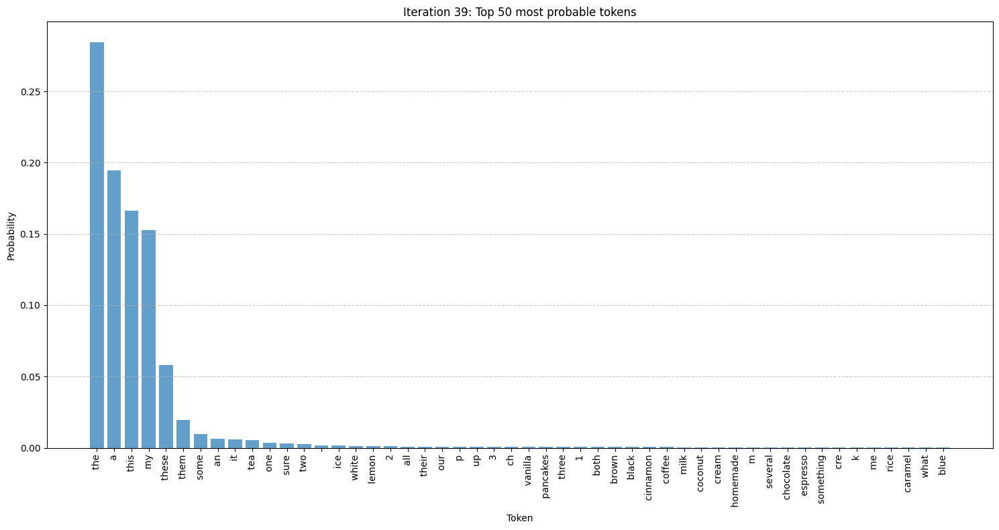

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make these


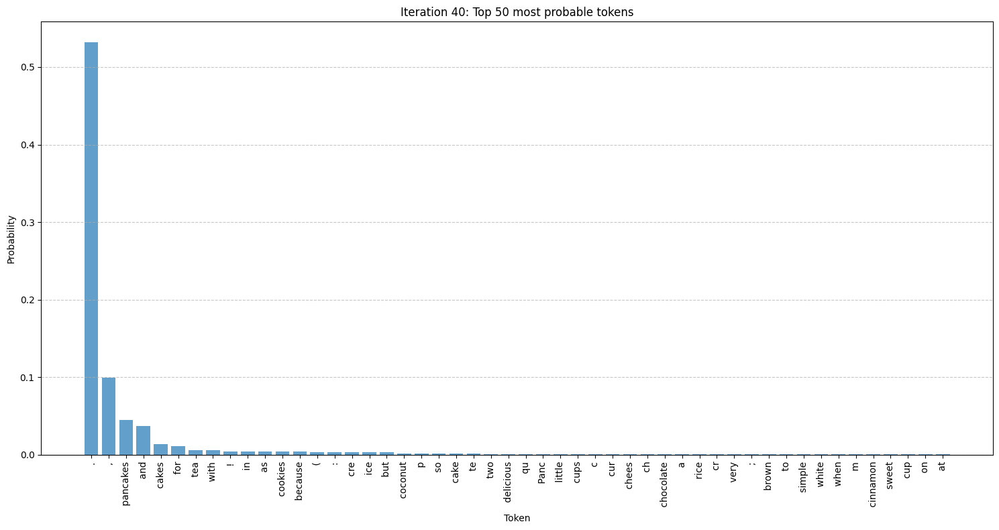

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make these.


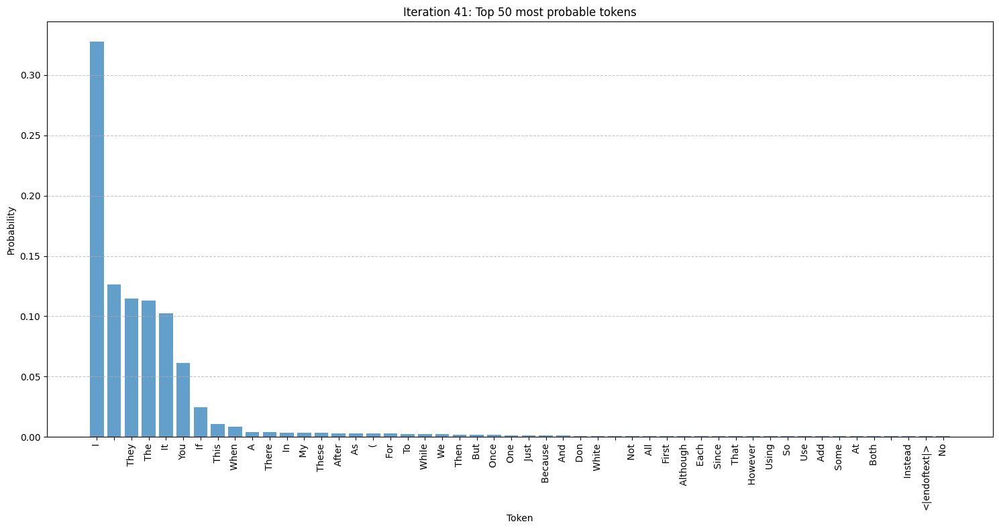

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make these.



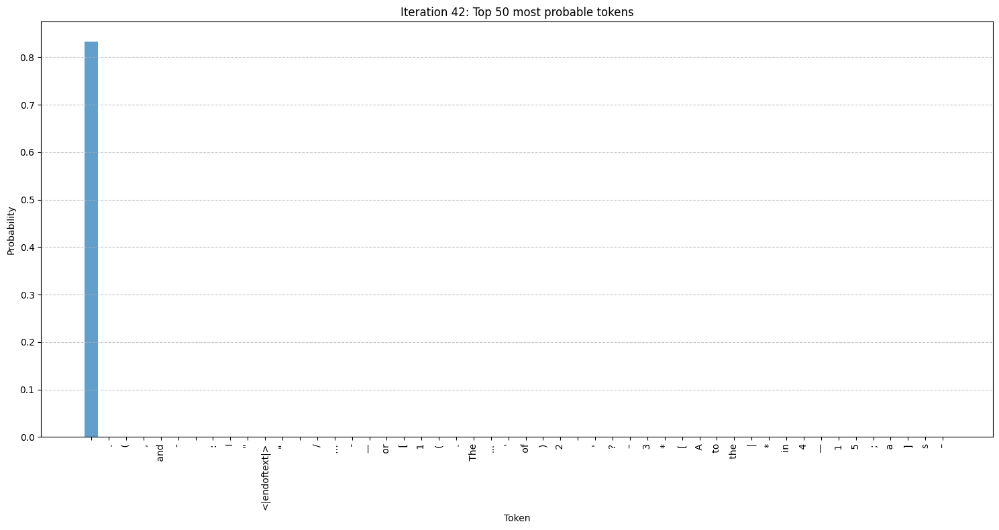

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make these.




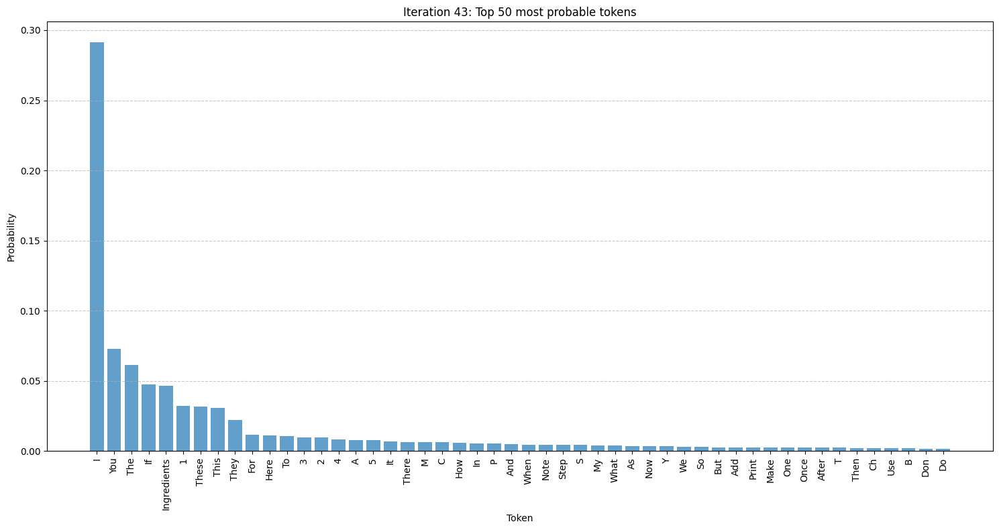

Generated so far: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make these.

I
Input text: Pancakes are good for ...
**Final generated text: Pancakes are good for iced tea. Unless you have a very deep cup of tea, you won't be able to get a good flavor out of them.

I used a pot of white wine to make these.

I


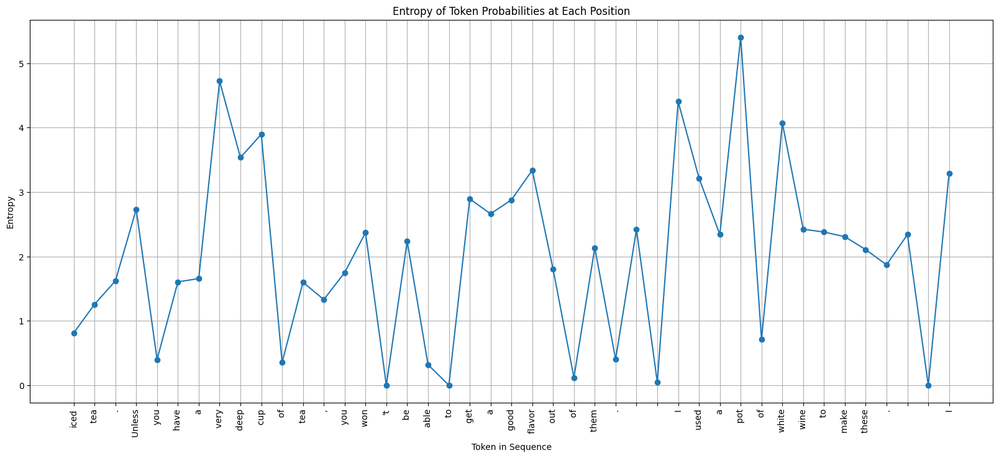

List of tokens with their positions in the sequence:
Position 7: iced
Position 8:  tea
Position 9: .
Position 10:  Unless
Position 11:  you
Position 12:  have
Position 13:  a
Position 14:  very
Position 15:  deep
Position 16:  cup
Position 17:  of
Position 18:  tea
Position 19: ,
Position 20:  you
Position 21:  won
Position 22: 't
Position 23:  be
Position 24:  able
Position 25:  to
Position 26:  get
Position 27:  a
Position 28:  good
Position 29:  flavor
Position 30:  out
Position 31:  of
Position 32:  them
Position 33: .
Position 34: 

Position 35: 

Position 36: I
Position 37:  used
Position 38:  a
Position 39:  pot
Position 40:  of
Position 41:  white
Position 42:  wine
Position 43:  to
Position 44:  make
Position 45:  these
Position 46: .
Position 47: 

Position 48: 

Position 49: I


In [ ]:
# @title
input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
top_k = 50
top_p = 0.95
temperature = 0.7
repetition_penalty = 1.2

# Initialize attention mask
attention_mask = torch.ones(input_ids.shape, dtype=torch.long)

# Initialize variables for entropy calculation
entropy_values = []
generated_tokens_with_positions = []

# Generate tokens one by one
output_ids = input_ids
generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

# Loop to generate tokens
for iteration in range(max_length - input_ids.size(1)):
    with torch.no_grad():
        outputs = model(output_ids, attention_mask=attention_mask)

    # Get the logits for the last token
    logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

    # Apply temperature scaling
    logits = logits / temperature

    # Convert logits to probabilities
    probs = torch.softmax(logits, dim=-1)

    # Calculate entropy
    entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
    entropy_values.append(entropy)

    # Apply repetition penalty
    if len(output_ids[0]) > 1:
        for token_id in set(output_ids[0].tolist()):
            probs[0, token_id] /= repetition_penalty

    # Sample from the probability distribution
    next_token_id = torch.multinomial(probs, num_samples=1)

    # Append the next token to the input_ids
    output_ids = torch.cat([output_ids, next_token_id], dim=-1)
    attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask

    # Decode the current token
    current_token = tokenizer.decode([next_token_id.item()])
    generated_tokens_with_positions.append((len(output_ids[0])-1, current_token))

    # Add the generated token to the list of tokens
    generated_tokens.append(current_token)

    # Extract the top 50 probabilities and their indices
    top_probs, top_indices = torch.topk(probs, 50)
    top_probs_np = top_probs.cpu().numpy().flatten()
    top_indices_np = top_indices.cpu().numpy().flatten()
    top_tokens = [tokenizer.decode([idx]) for idx in top_indices_np]

    # Plotting top probabilities
    plt.figure(figsize=(15, 8))
    plt.bar(np.arange(50), top_probs_np, alpha=0.7)
    plt.xlabel('Token')
    plt.ylabel('Probability')
    plt.title(f'Iteration {iteration+1}: Top 50 most probable tokens')
    plt.xticks(np.arange(50), top_tokens, rotation='vertical')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Decode the current state of the sequence
    current_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    print(f"Generated so far: {current_text}")

    # Stop if the model generates an end-of-sequence token
    if next_token_id.item() == tokenizer.eos_token_id:
        break

# Final generated text
final_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
print(f"Input text: {input_text}...")
print(f"**Final generated text: {final_text}")

# Align the length of generated tokens with entropy values
entropy_tokens = generated_tokens[len(generated_tokens) - len(entropy_values):]

# Plot the entropy values
plt.figure(figsize=(20, 8))
plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o')
plt.xticks(range(1, len(entropy_values) + 1), entropy_tokens, rotation='vertical')  # Use tokens for x-axis labels
plt.xlabel('Token in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position')
plt.grid(True)
plt.show()

# Print the list of tokens with their positions
print("List of tokens with their positions in the sequence:")
for position, token in generated_tokens_with_positions:
    print(f"Position {position}: {token}")


**CALCULATING THE ENTROPY FOR EACH GENERATED TOEKEN FOR DIFFERENT TEMPERATURES**

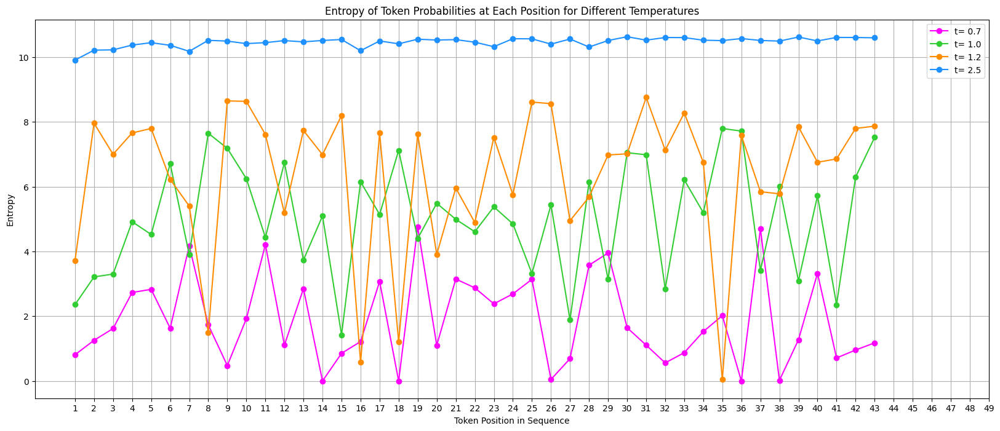

List of tokens with their positions in the sequence for the last temperature evaluated:
Position 7:  Moines
Position 8:  Stub
Position 9: claw
Position 10: wayne
Position 11: 2008
Position 12:  publicly
Position 13:  baseline
Position 14:  stance
Position 15:  €
Position 16:  caf
Position 17:  synchronization
Position 18: Poll
Position 19:  reverse
Position 20: asting
Position 21:  Econom
Position 22:  Krugman
Position 23:  circa
Position 24:  Fury
Position 25:  tie
Position 26:  Dickinson
Position 27:  Using
Position 28:  Thanksgiving
Position 29:  lords
Position 30: enda
Position 31:  decre
Position 32: atom
Position 33:  th
Position 34: et
Position 35: ane
Position 36:  todd
Position 37:  pumpkin
Position 38:  loot
Position 39: esm
Position 40:  being
Position 41:  sprung
Position 42:  rear
Position 43:  15
Position 44: izon
Position 45:  Jennifer
Position 46: emonium
Position 47:  victory
Position 48:  programme
Position 49:  Way


In [ ]:
input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
top_k = 50
top_p = 0.95
repetition_penalty = 1.1
temperatures = [0.7, 1.0, 1.2, 2.5]
colors = ['fuchsia', 'limegreen', 'darkorange', 'dodgerblue']

temperature_entropy_dict = {}

for temperature in temperatures:
    # Initialize variables for entropy calculation
    entropy_values = []
    generated_tokens_with_positions = []

    # Generate tokens one by one
    output_ids = input_ids
    generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

    # Loop to generate tokens
    for iteration in range(max_length - input_ids.size(1)):
        attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask
        with torch.no_grad():
            outputs = model(output_ids, attention_mask=attention_mask)

        # Get the logits for the last token
        logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

        # Apply temperature scaling
        logits = logits / temperature

        # Convert logits to probabilities
        probs = torch.softmax(logits, dim=-1)

        # Calculate entropy
        entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
        entropy_values.append(entropy)

        # Apply repetition penalty
        if len(output_ids[0]) > 1:
            for token_id in set(output_ids[0].tolist()):
                probs[0, token_id] /= repetition_penalty

        # Sample from the probability distribution
        next_token_id = torch.multinomial(probs, num_samples=1)

        # Append the next token to the input_ids
        output_ids = torch.cat([output_ids, next_token_id], dim=-1)

        # Decode the current token
        current_token = tokenizer.decode([next_token_id.item()])
        generated_tokens_with_positions.append((len(output_ids[0])-1, current_token))

        # Add the generated token to the list of tokens
        generated_tokens.append(current_token)

        # Stop if the model generates an end-of-sequence token
        if next_token_id.item() == tokenizer.eos_token_id:
            break

    # Store entropies for this temperature
    temperature_entropy_dict[temperature] = (entropy_values, generated_tokens[len(generated_tokens) - len(entropy_values):])


plt.figure(figsize=(20, 8))

for i, (temperature, (entropy_values, _)) in enumerate(temperature_entropy_dict.items()):
    plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o', label=f't= {temperature}', color=colors[i])

plt.xticks(range(1, max_length))  # Use token positions as x-axis labels

plt.xlabel('Token Position in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position for Different Temperatures')
plt.legend(loc='best')
plt.grid(True)
plt.show()

print("List of tokens with their positions in the sequence for temperature=2.5 evaluated (just for a reference of the position in the period):")
for position, token in generated_tokens_with_positions:
    print(f"Position {position}: {token}")

**High Temperature:**
Higher values make the model's output more random and creative.
The probability distribution is flattened, making it more likely for the model to choose less probable words.
This can lead to more diverse and unexpected outputs but can also result in incoherent or nonsensical text.

**Low Temperature:**
Lower values make the output more deterministic and focused.
The probability distribution becomes sharper, making it more likely for the model to choose the highest probability words.
This results in more predictable and repetitive text, often sticking to the safest or most likely choices.

**CACLULATING THE ENTROPY FOR EACH GENERATED TOKEN FOR DIFFERENT REPETITION PENALTY VALUES**

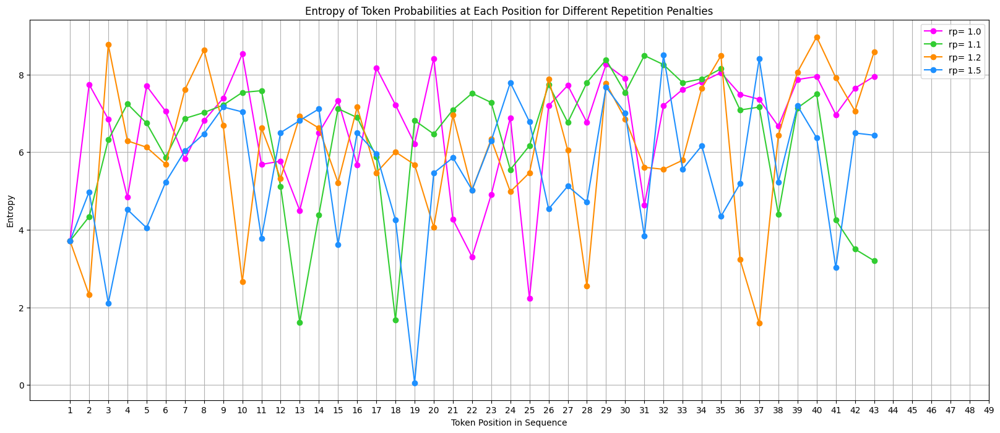

In [ ]:
input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
temperature = 1.2
repetition_penalties = [1.0, 1.1, 1.2, 1.5]
colors = ['fuchsia', 'limegreen', 'darkorange', 'dodgerblue']

repetition_penalty_entropy_dict = {}

for repetition_penalty in repetition_penalties:
    # Initialize variables for entropy calculation
    entropy_values = []
    generated_tokens_with_positions = []

    # Generate tokens one by one
    output_ids = input_ids
    generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

    # Loop to generate tokens
    for iteration in range(max_length - input_ids.size(1)):
        attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask
        with torch.no_grad():
            outputs = model(output_ids, attention_mask=attention_mask)

        # Get the logits for the last token
        logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

        # Apply temperature scaling
        logits = logits / temperature

        # Convert logits to probabilities
        probs = torch.softmax(logits, dim=-1)

        # Calculate entropy
        entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
        entropy_values.append(entropy)

        # Apply repetition penalty
        if len(output_ids[0]) > 1:
            for token_id in set(output_ids[0].tolist()):
                probs[0, token_id] /= repetition_penalty

        # Sample from the probability distribution
        next_token_id = torch.multinomial(probs, num_samples=1)

        # Append the next token to the input_ids
        output_ids = torch.cat([output_ids, next_token_id], dim=-1)

        # Decode the current token
        current_token = tokenizer.decode([next_token_id.item()])
        generated_tokens_with_positions.append((len(output_ids[0])-1, current_token))

        # Add the generated token to the list of tokens
        generated_tokens.append(current_token)

        # Stop if the model generates an end-of-sequence token
        if next_token_id.item() == tokenizer.eos_token_id:
            break

    # Store entropies for this repetition penalty
    repetition_penalty_entropy_dict[repetition_penalty] = (entropy_values, generated_tokens[len(generated_tokens) - len(entropy_values):])


plt.figure(figsize=(20, 8))

for i, (repetition_penalty, (entropy_values, _)) in enumerate(repetition_penalty_entropy_dict.items()):
    plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o', label=f'rp= {repetition_penalty}', color=colors[i])

plt.xticks(range(1, max_length))  # Use token positions as x-axis labels

plt.xlabel('Token Position in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position for Different Repetition Penalties')
plt.legend(loc='best')
plt.grid(True)
plt.show()

print("List of tokens with their positions in the sequence for the last repetition penalty evaluated:")
for position, token in generated_tokens_with_positions:
    print(f"Position {position}: {token}")


***FOR A SPECIFIC PROMPT*: FIDING THE ENTROPY AND PROBABILITY OF EACH TOKEN GENERATED ACCORDINGLY**

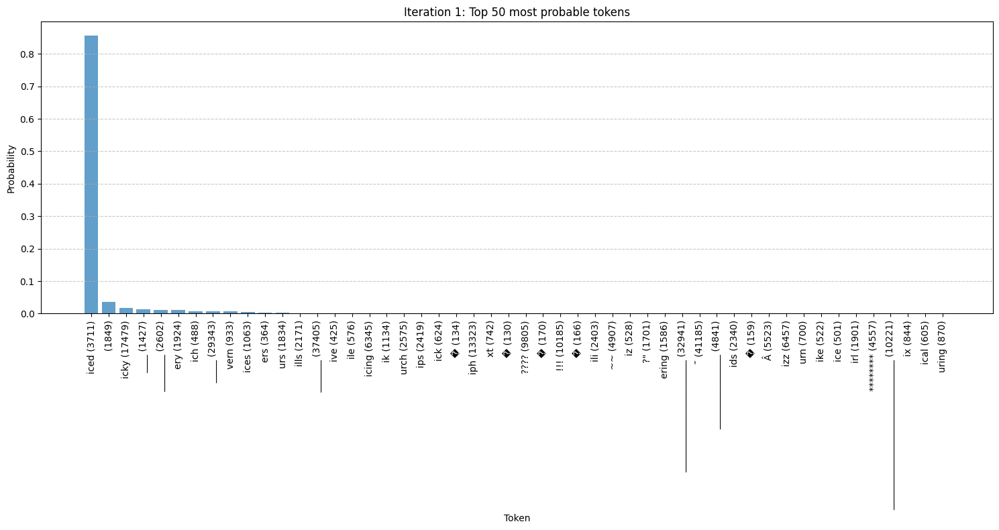

Generated so far: Pancakes are good for iced


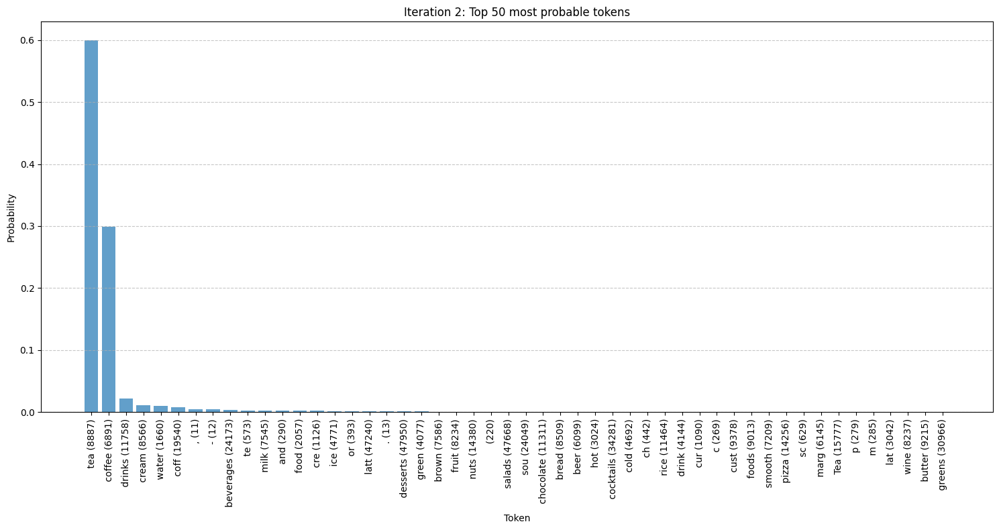

Generated so far: Pancakes are good for iced tea


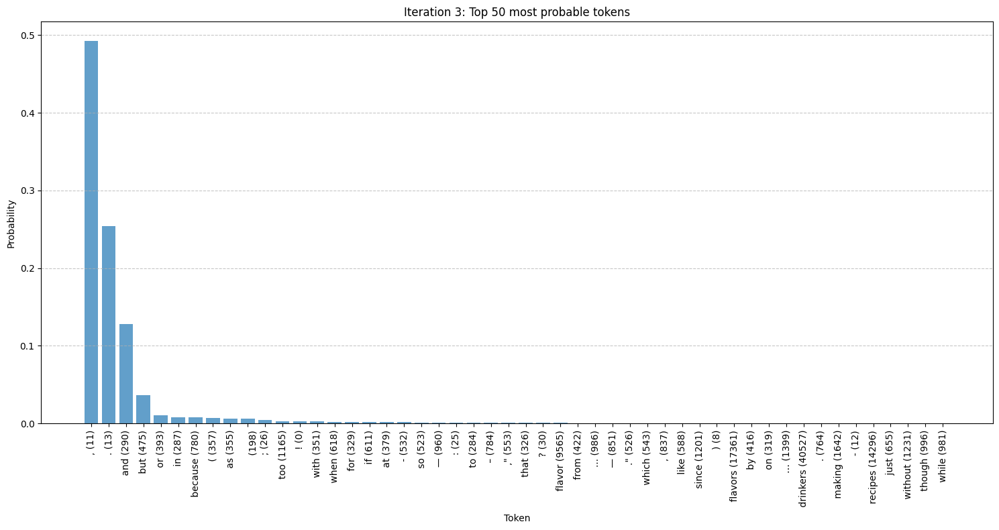

Generated so far: Pancakes are good for iced tea,


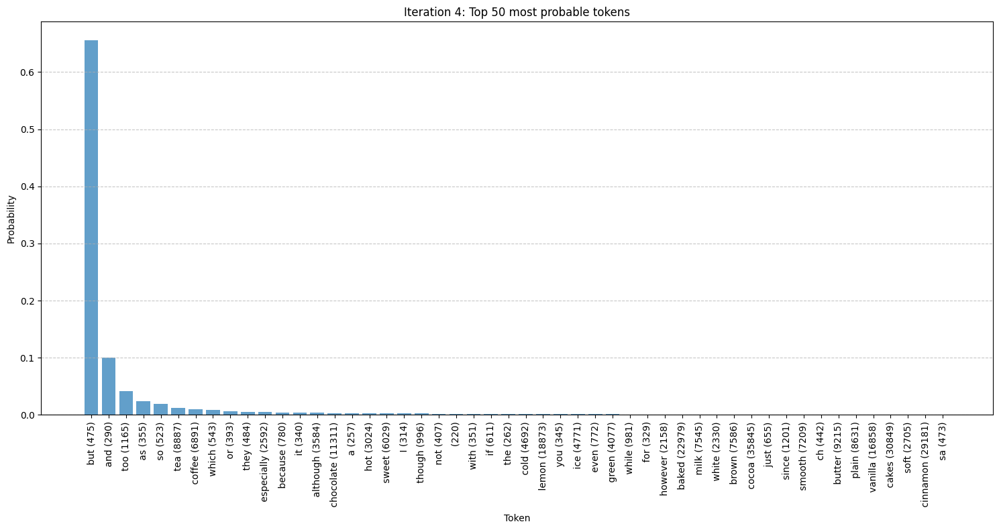

Generated so far: Pancakes are good for iced tea, and


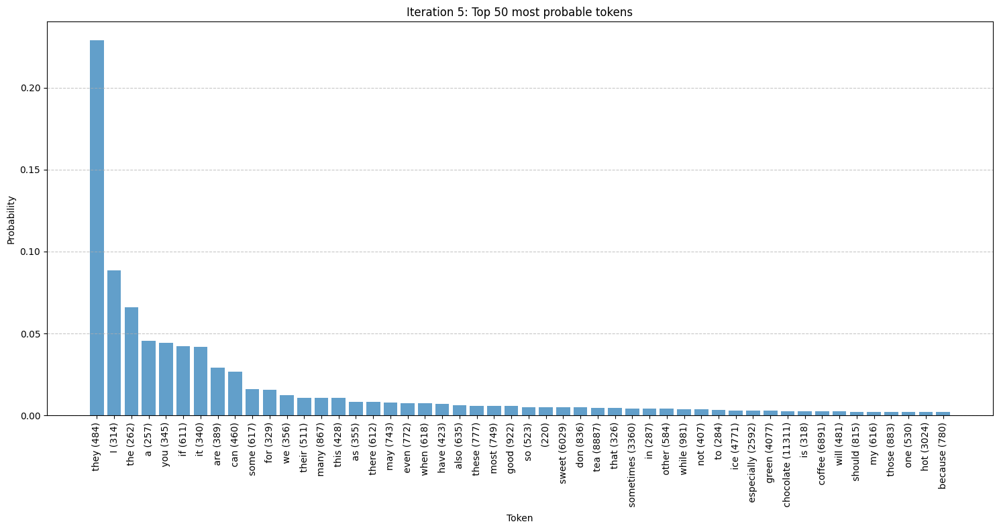

Generated so far: Pancakes are good for iced tea, and they


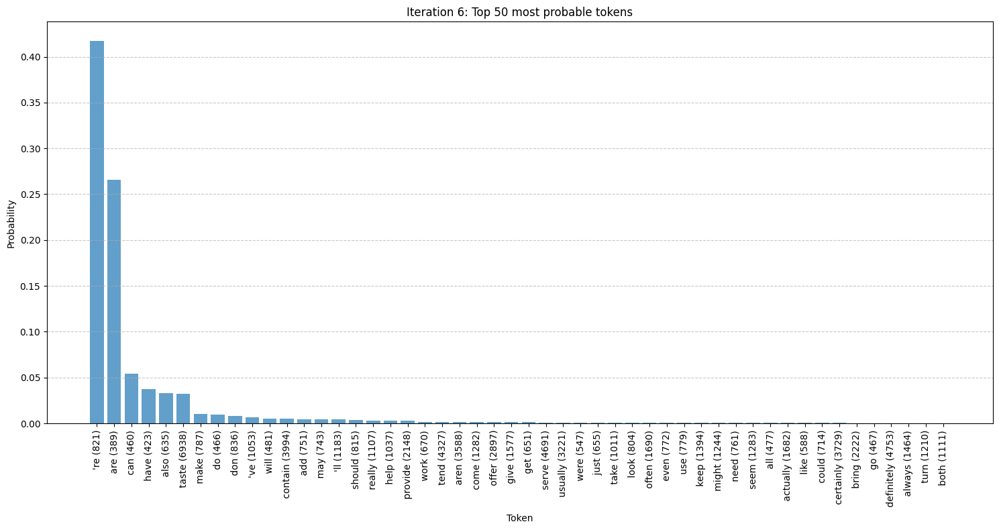

Generated so far: Pancakes are good for iced tea, and they're


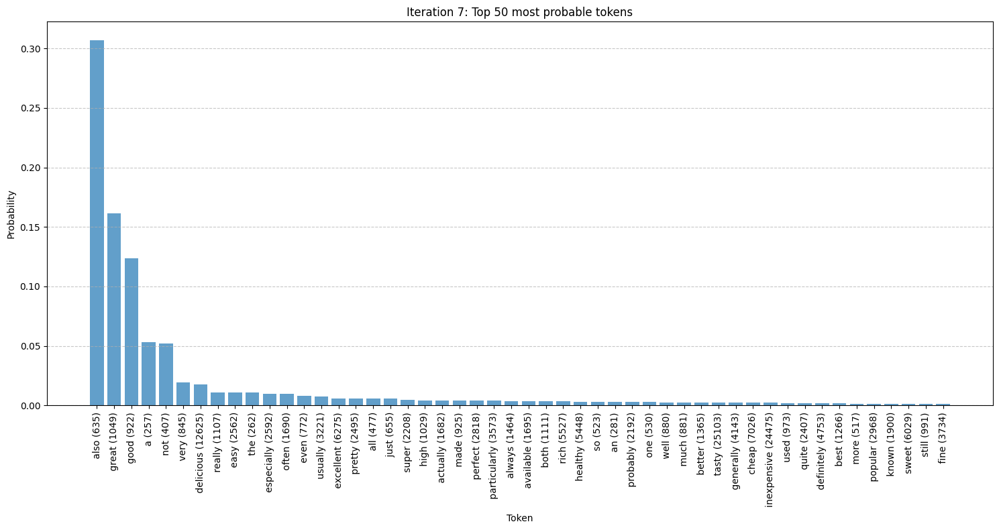

Generated so far: Pancakes are good for iced tea, and they're super


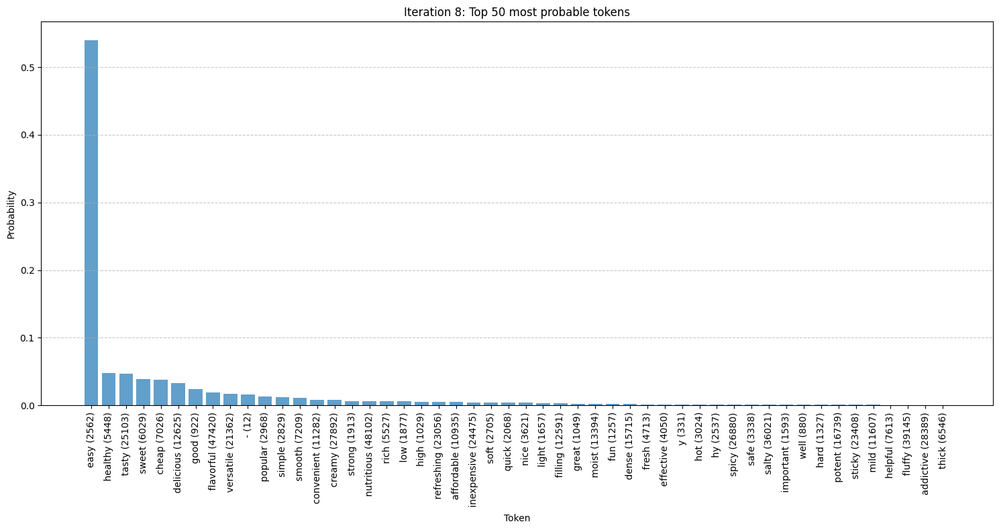

Generated so far: Pancakes are good for iced tea, and they're super simple


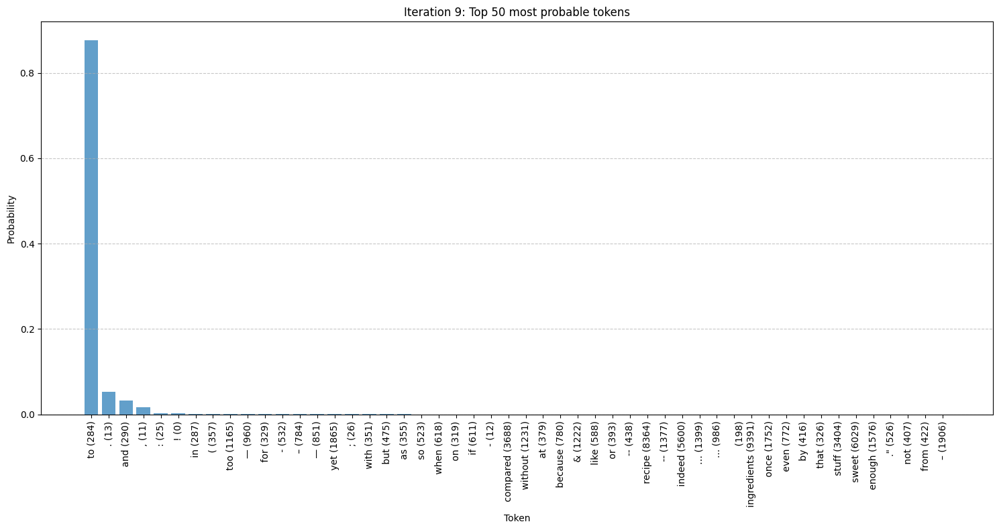

Generated so far: Pancakes are good for iced tea, and they're super simple.


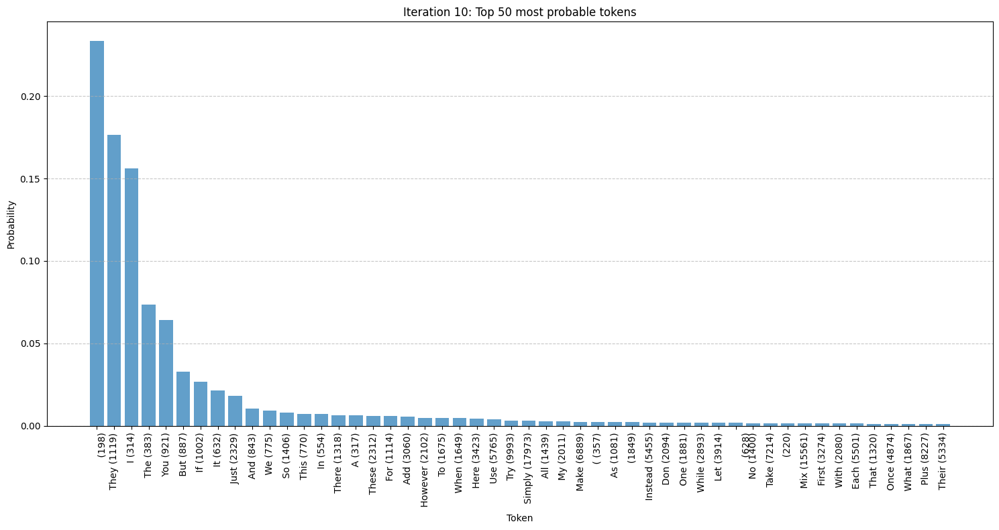

Generated so far: Pancakes are good for iced tea, and they're super simple. Then


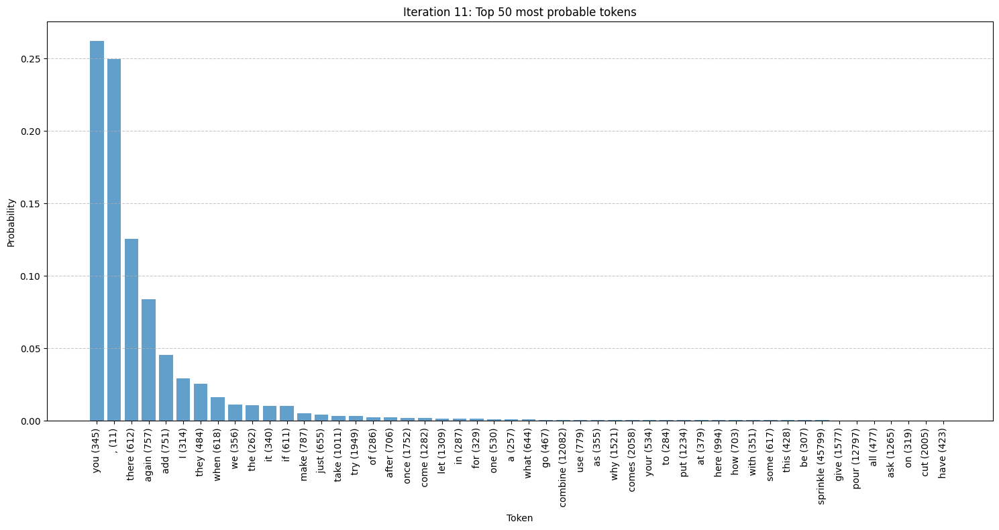

Generated so far: Pancakes are good for iced tea, and they're super simple. Then,


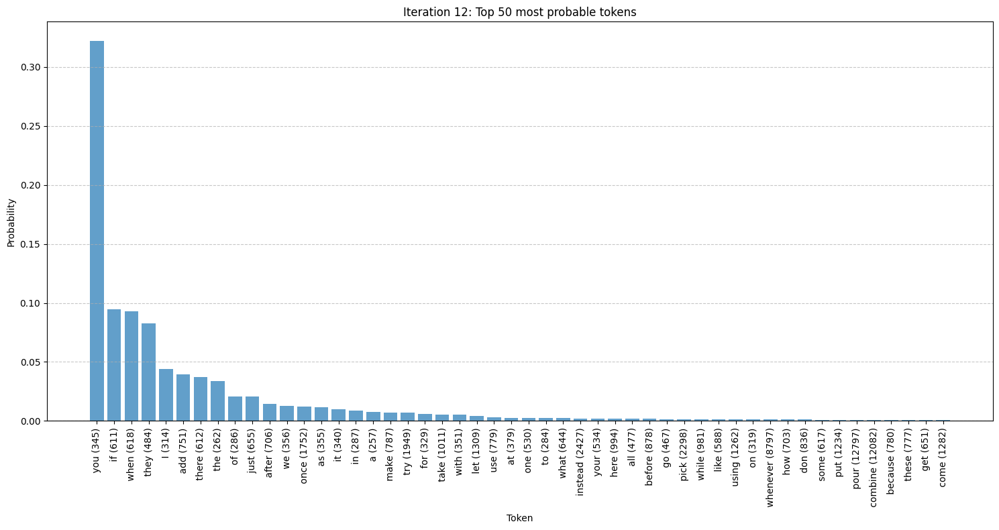

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you


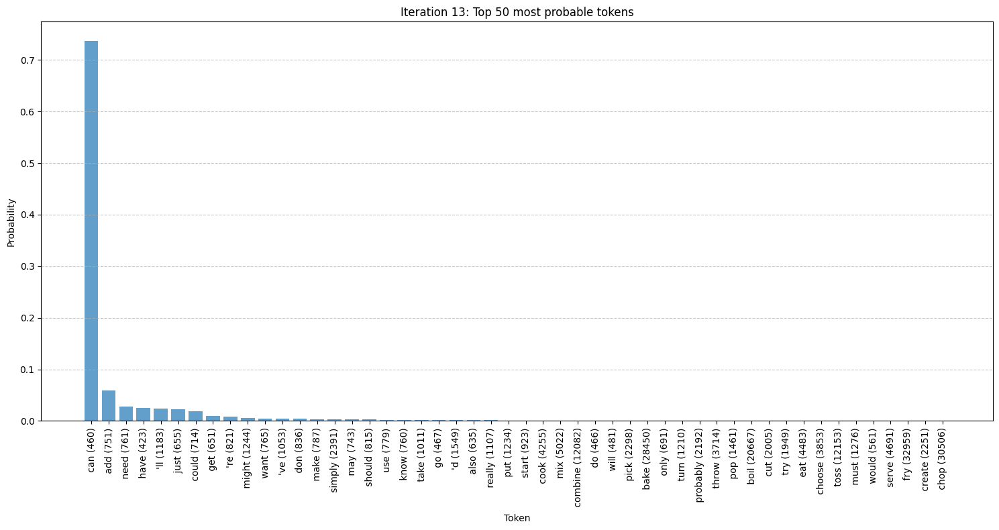

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can


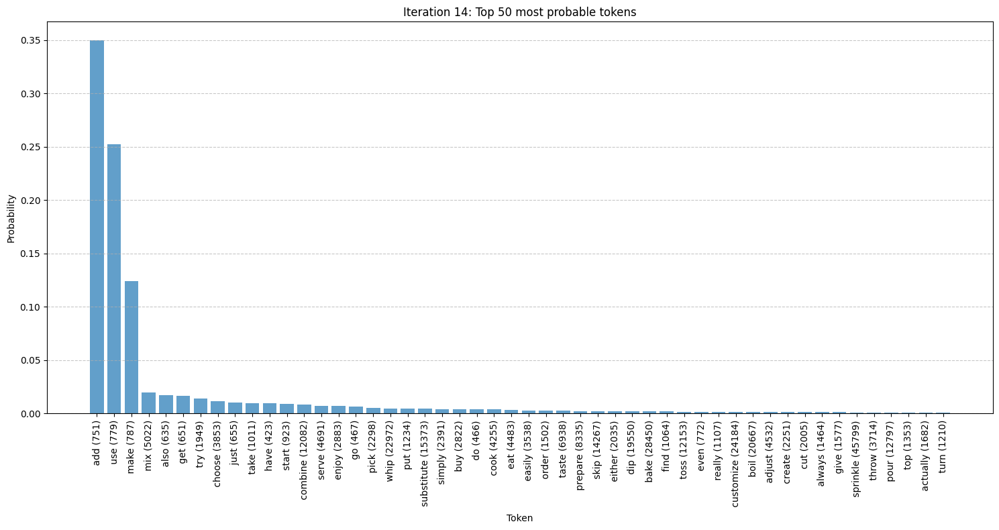

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply


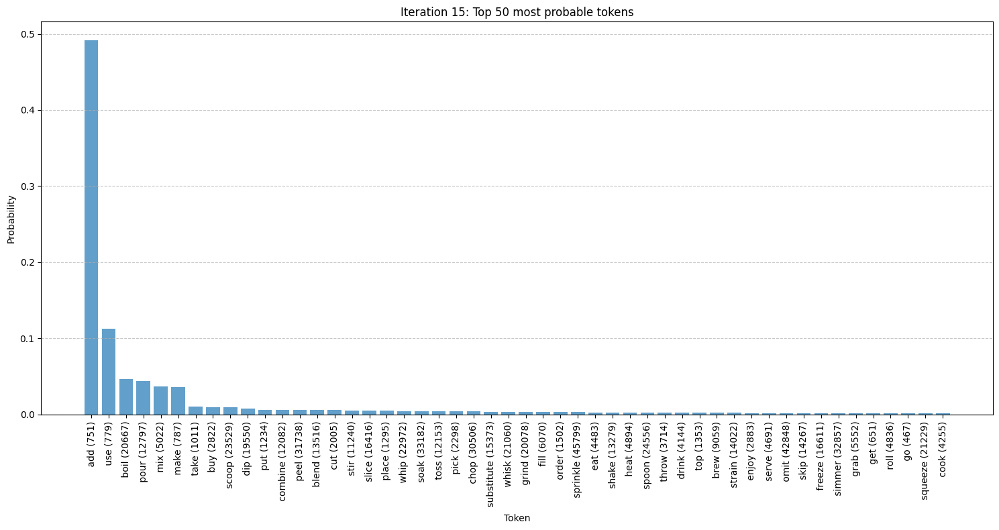

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil


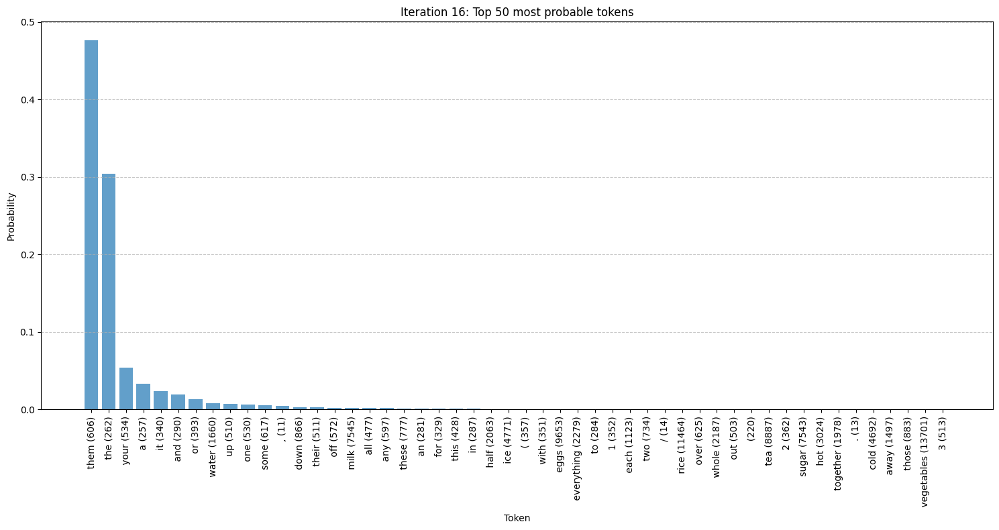

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them


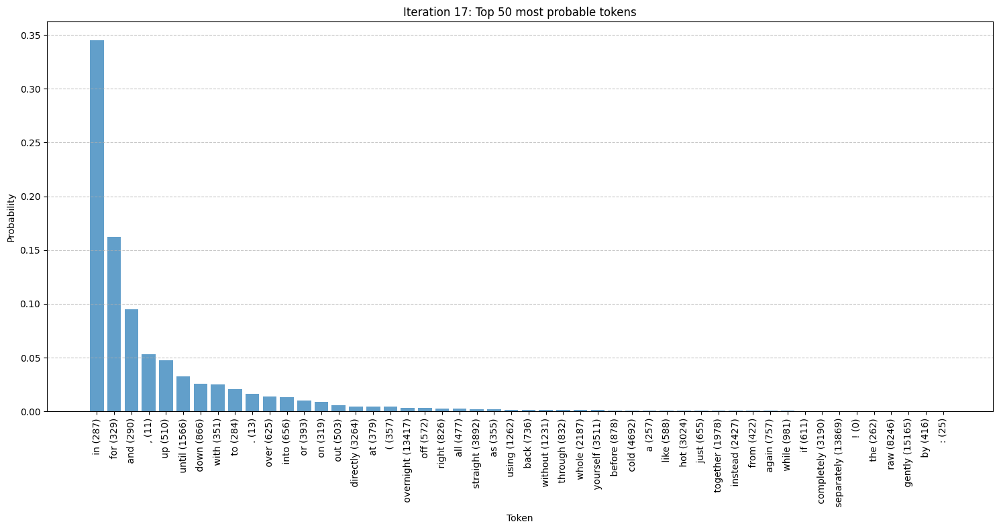

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for


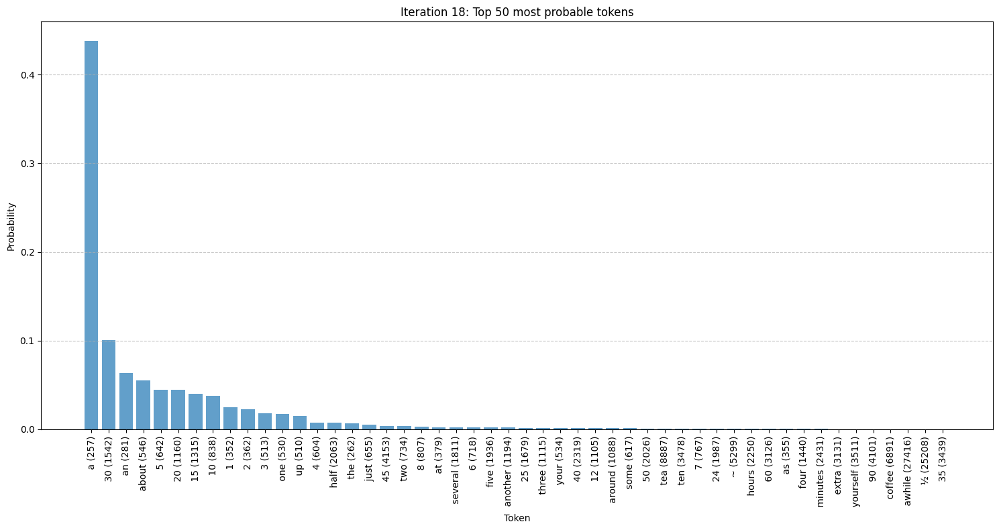

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a


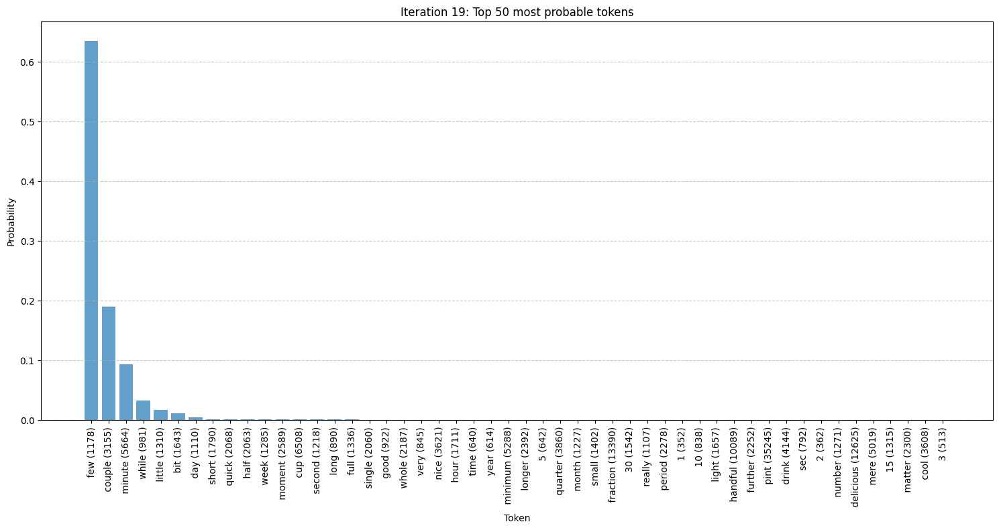

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few


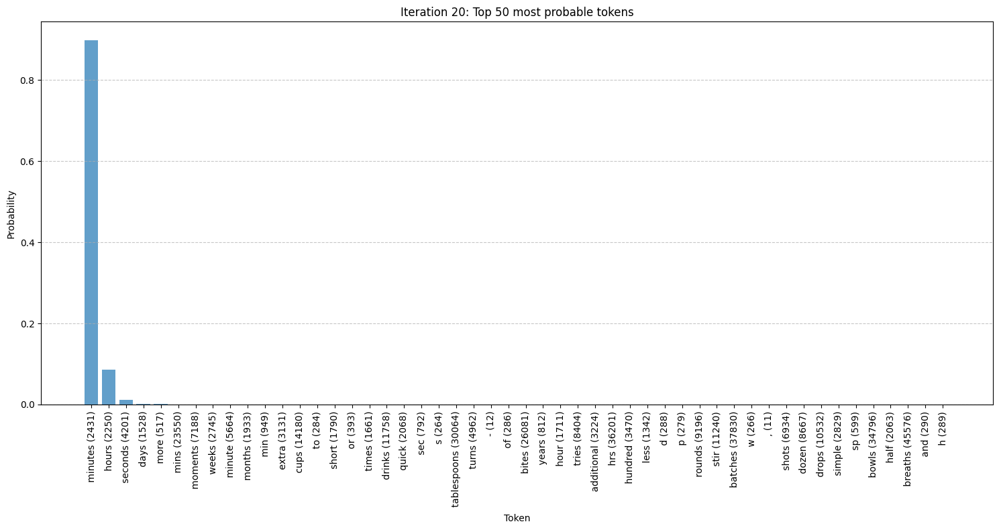

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes


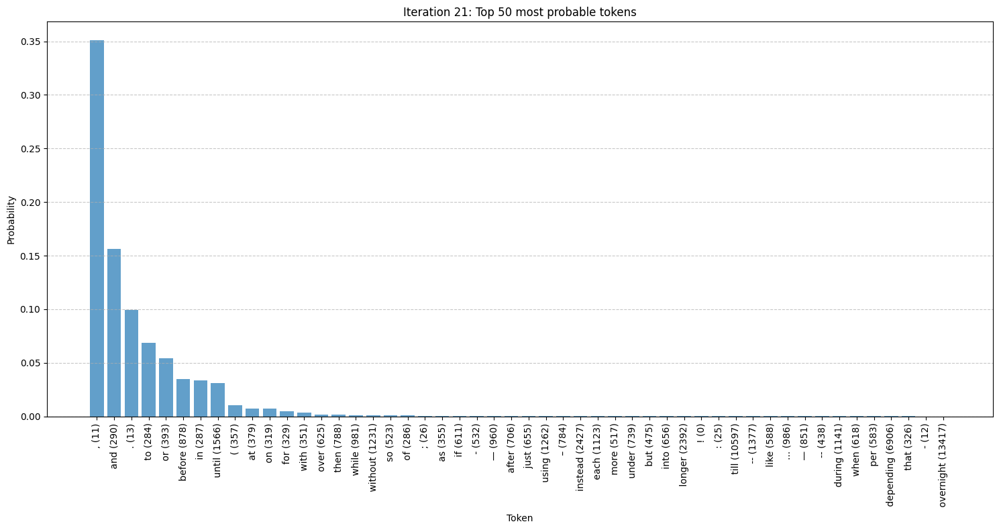

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or


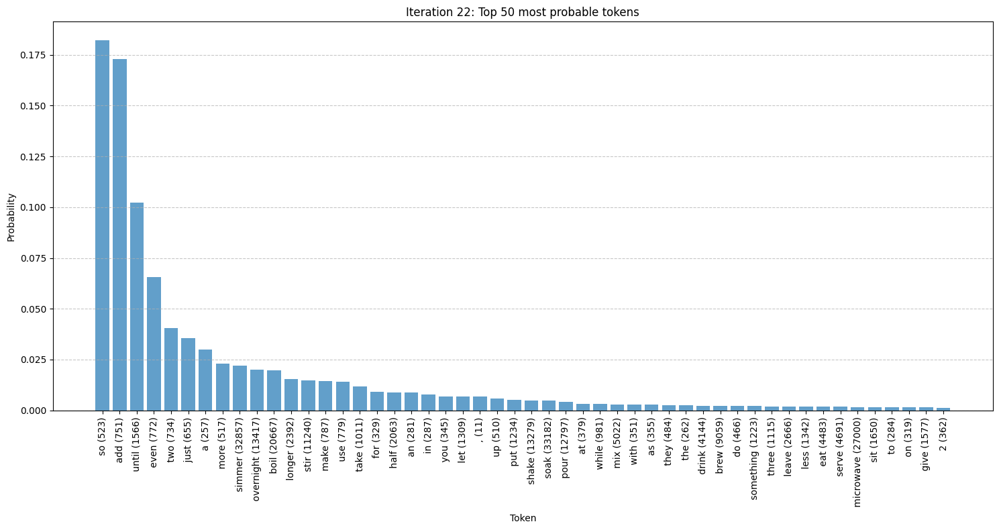

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so


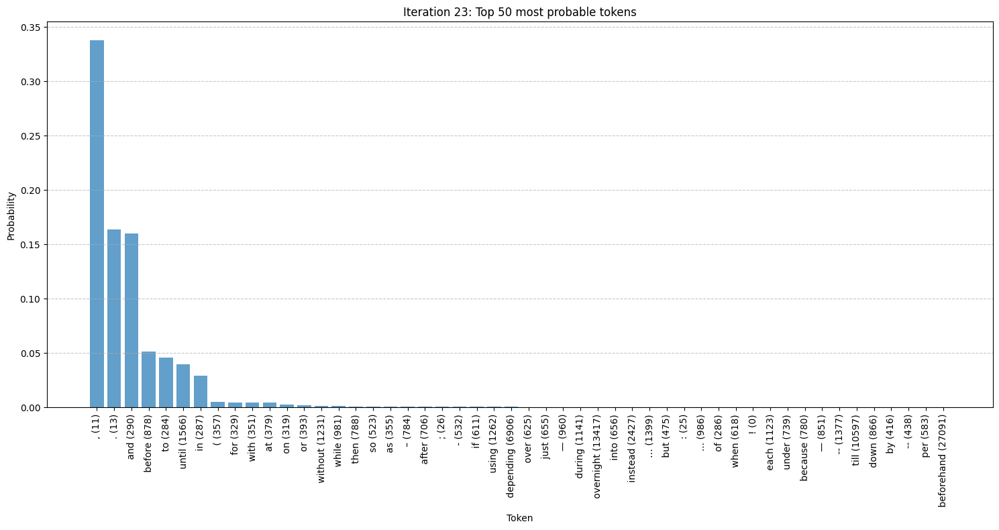

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and


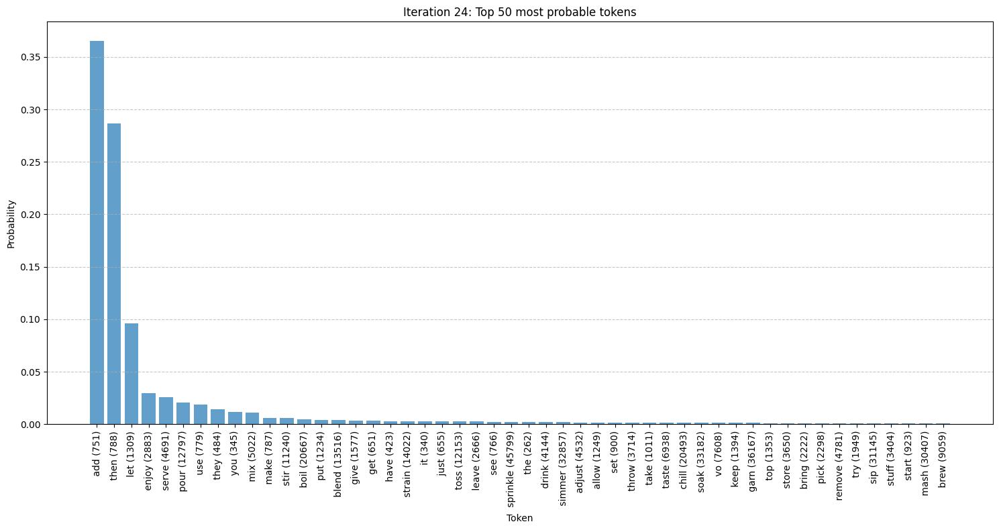

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then


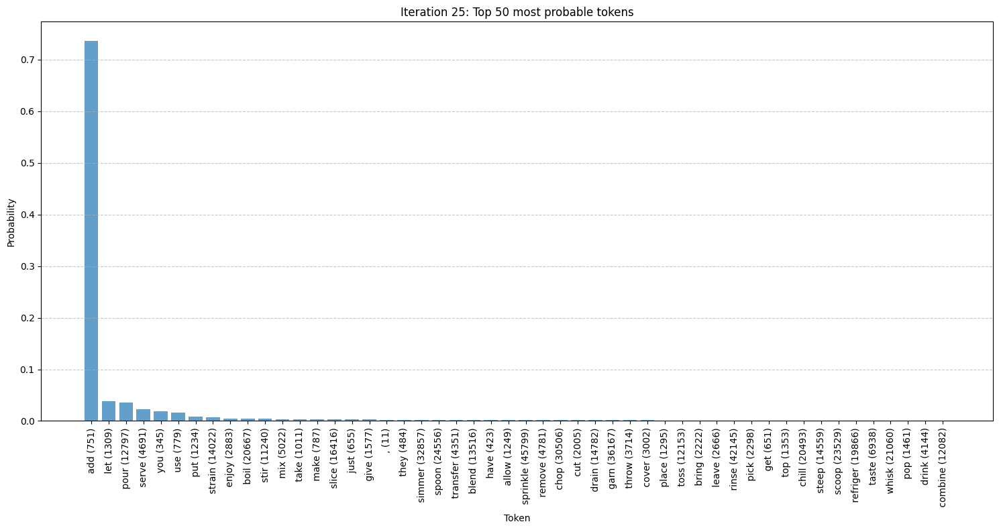

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add


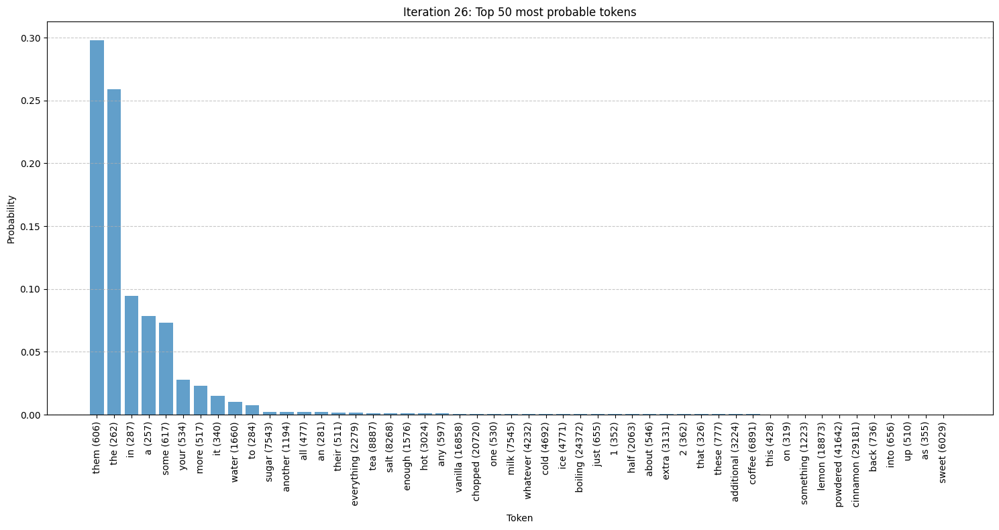

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the


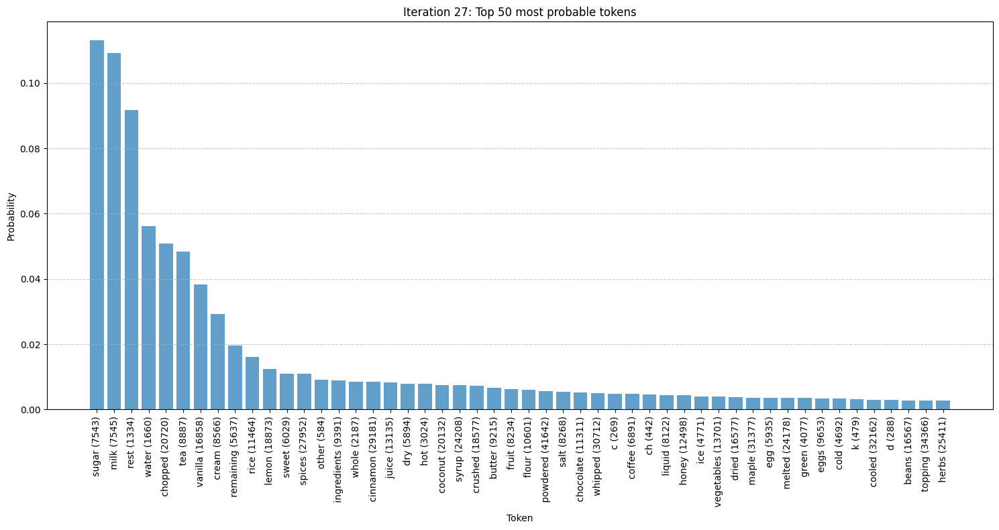

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar


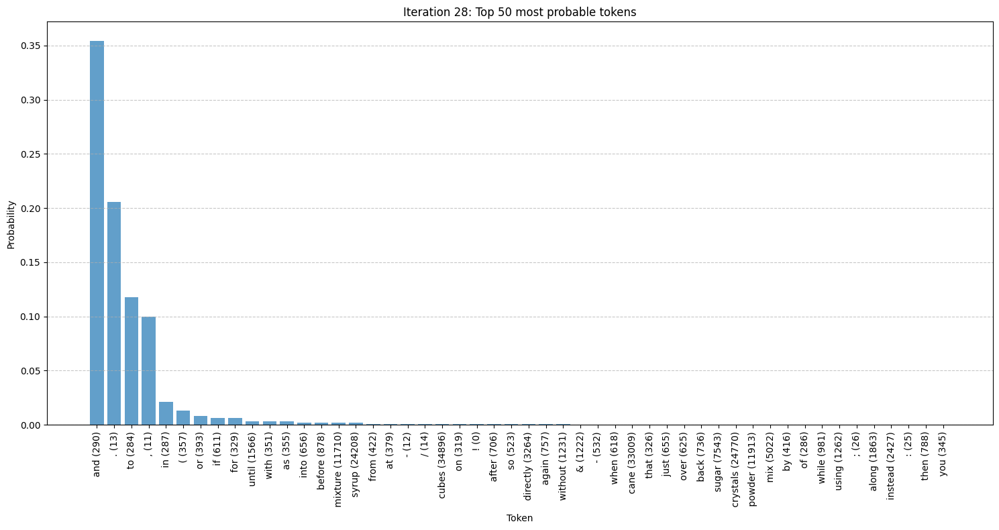

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to


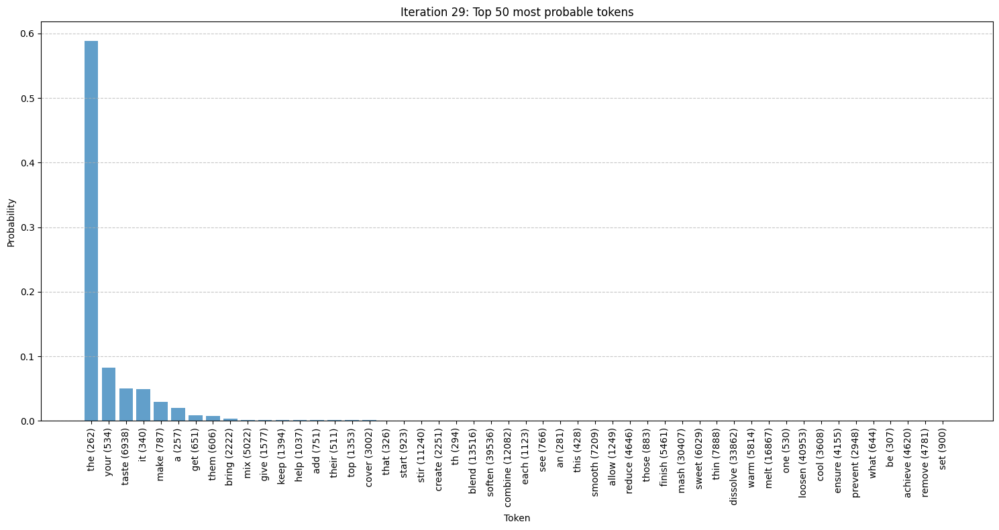

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the


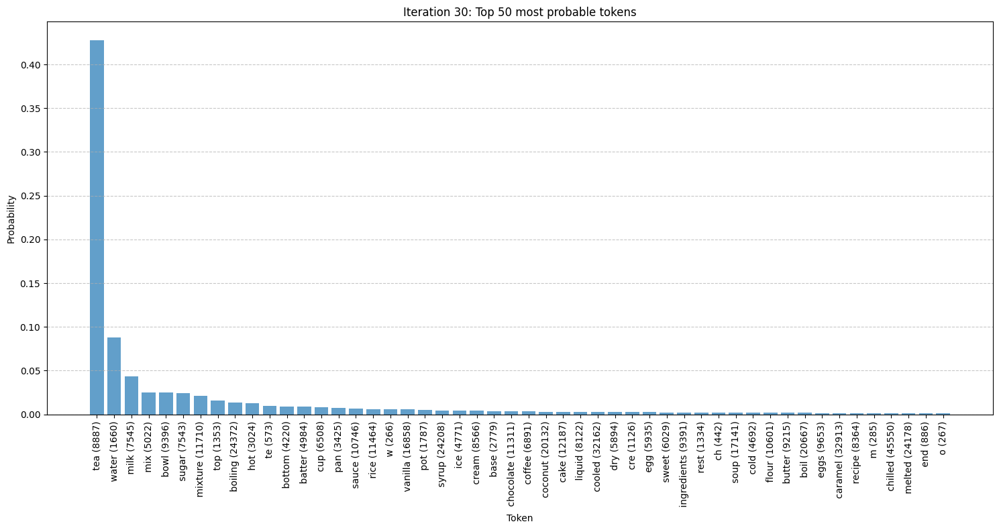

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling


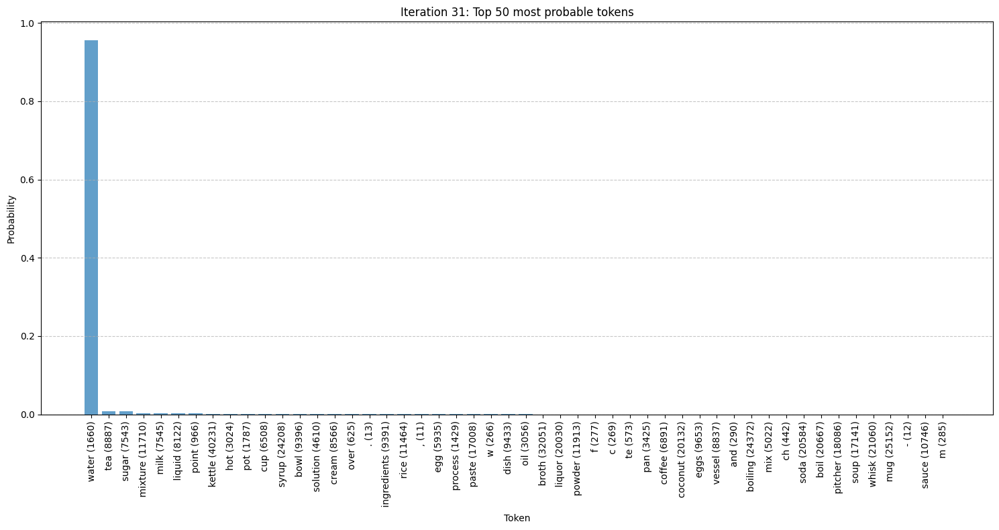

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water


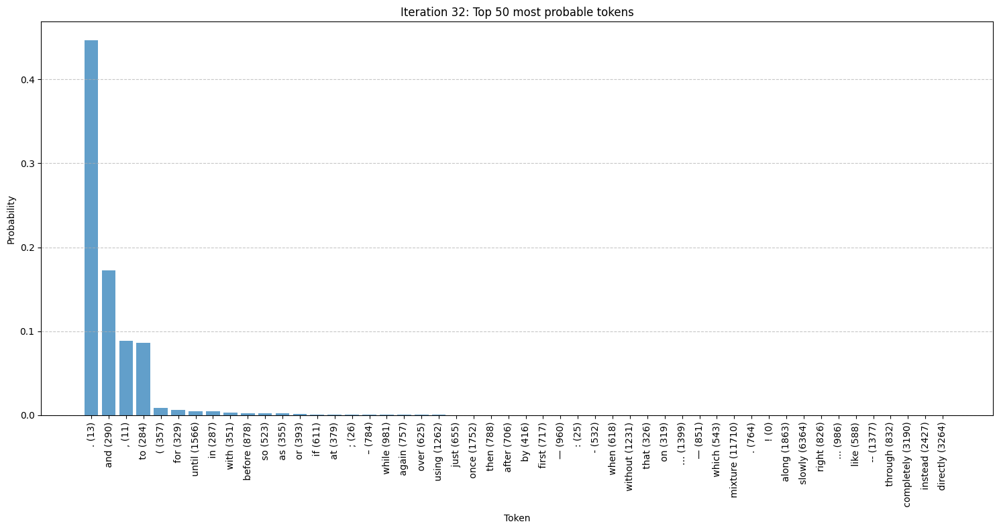

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water.


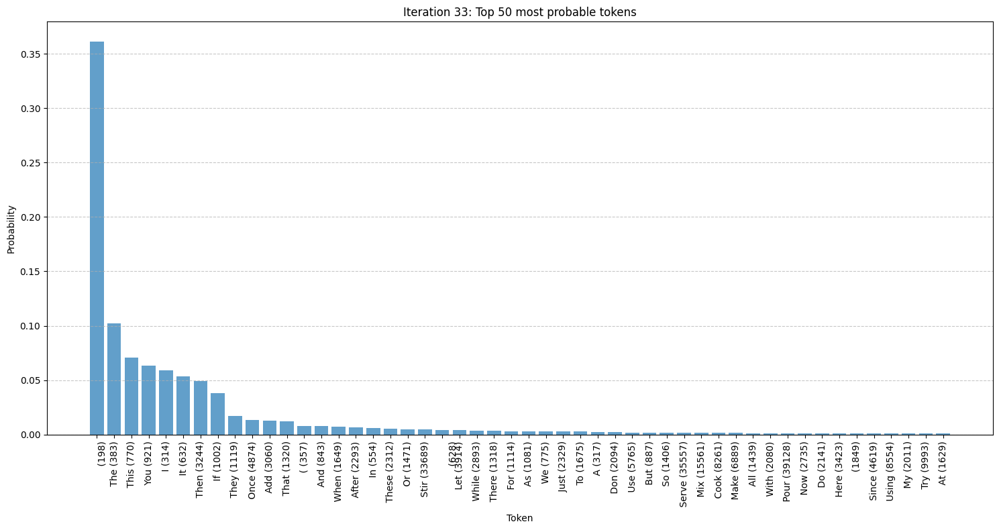

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The


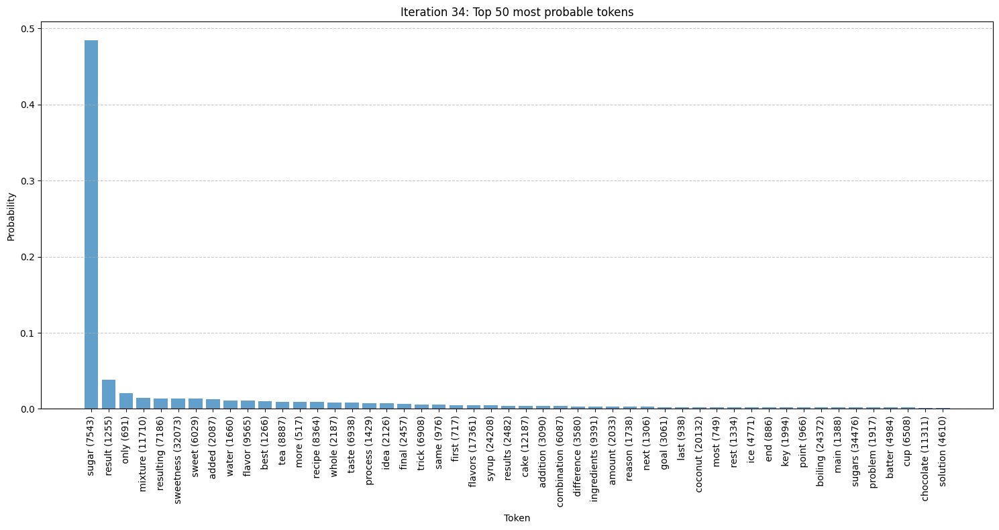

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar


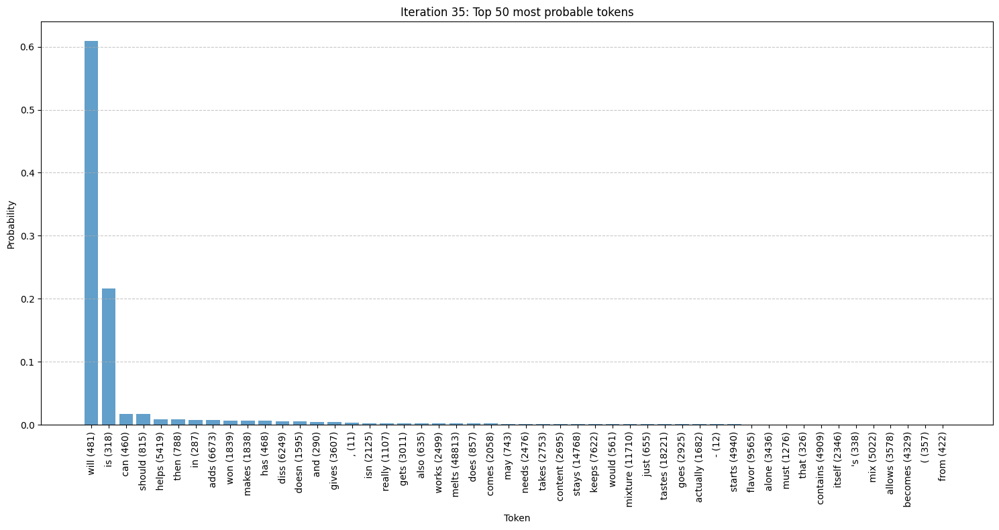

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will


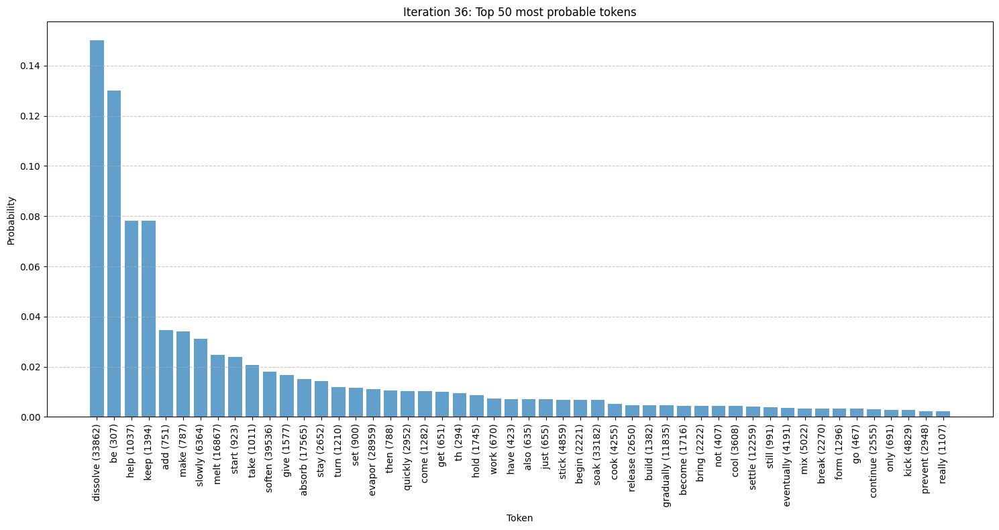

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take


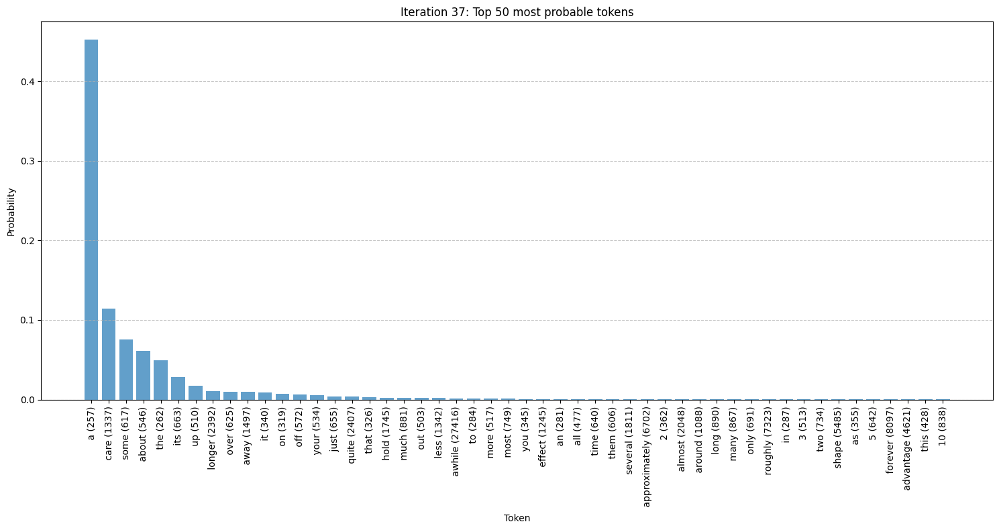

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less


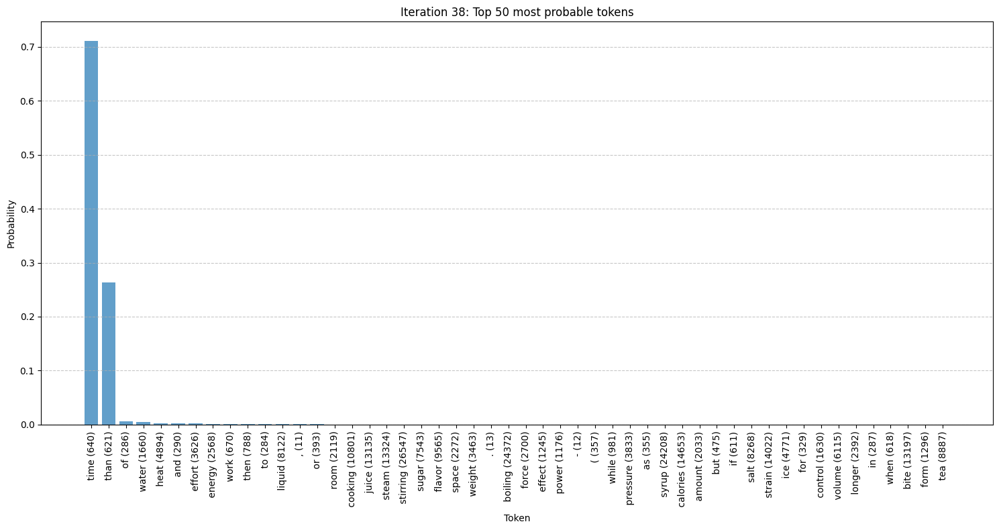

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time


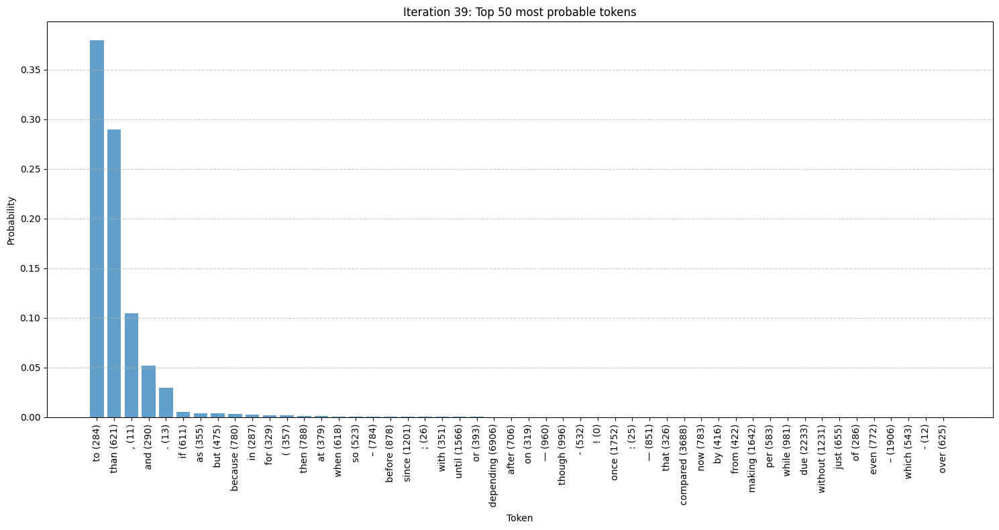

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time to


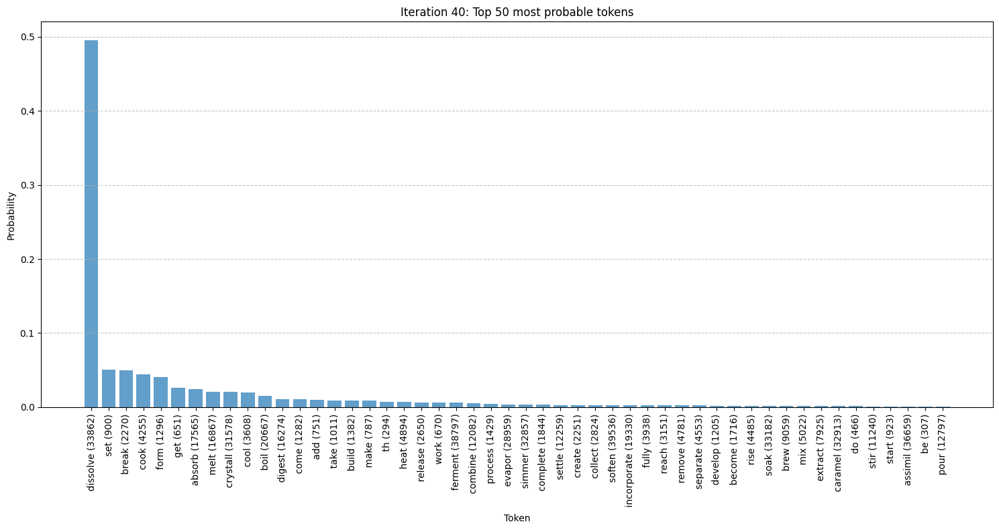

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time to break


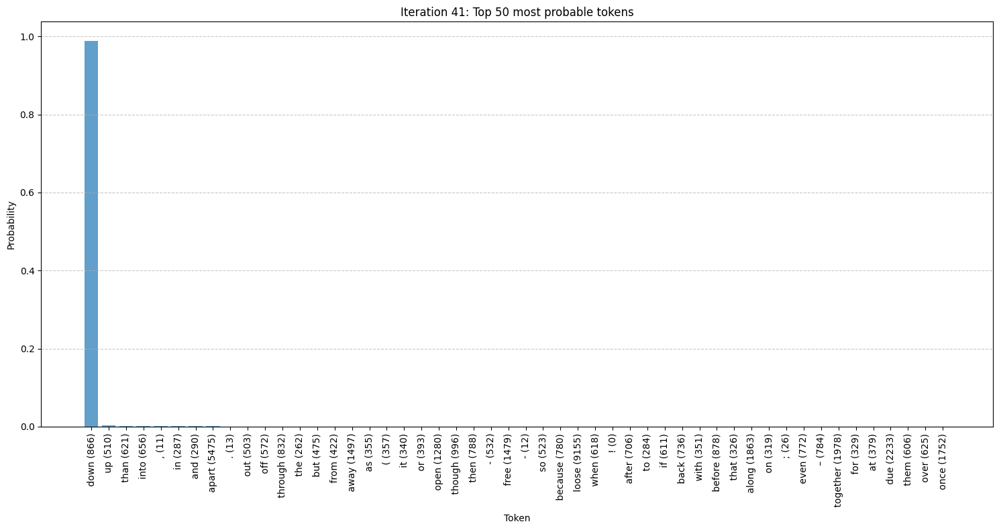

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time to break down


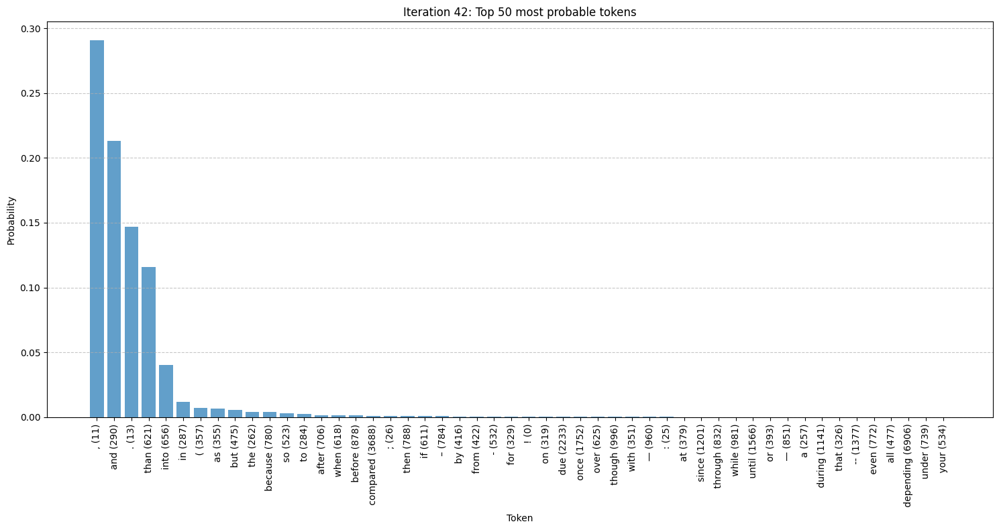

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time to break down because


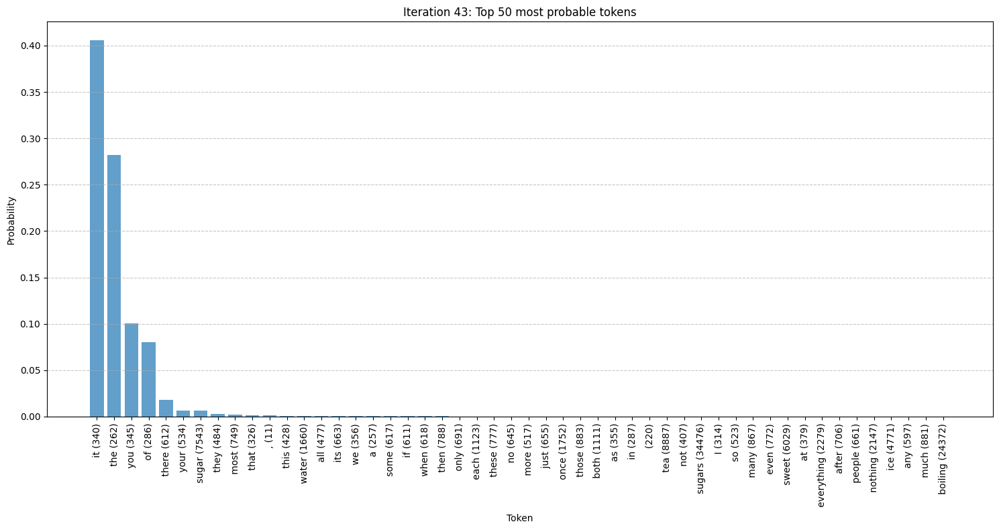

Generated so far: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time to break down because you
Input text: Pancakes are good for ...
**Final generated text: Pancakes are good for iced tea, and they're super simple. Then, you can simply boil them for a few minutes or so and then add the sugar to the boiling water. The sugar will take less time to break down because you


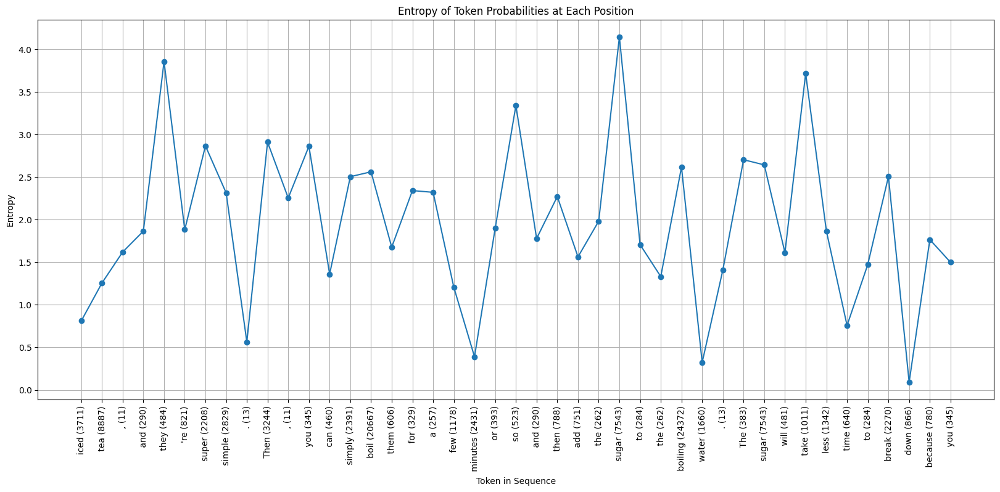

List of tokens with their positions in the sequence:
Position 7: iced (3711)
Position 8:  tea (8887)
Position 9: , (11)
Position 10:  and (290)
Position 11:  they (484)
Position 12: 're (821)
Position 13:  super (2208)
Position 14:  simple (2829)
Position 15: . (13)
Position 16:  Then (3244)
Position 17: , (11)
Position 18:  you (345)
Position 19:  can (460)
Position 20:  simply (2391)
Position 21:  boil (20667)
Position 22:  them (606)
Position 23:  for (329)
Position 24:  a (257)
Position 25:  few (1178)
Position 26:  minutes (2431)
Position 27:  or (393)
Position 28:  so (523)
Position 29:  and (290)
Position 30:  then (788)
Position 31:  add (751)
Position 32:  the (262)
Position 33:  sugar (7543)
Position 34:  to (284)
Position 35:  the (262)
Position 36:  boiling (24372)
Position 37:  water (1660)
Position 38: . (13)
Position 39:  The (383)
Position 40:  sugar (7543)
Position 41:  will (481)
Position 42:  take (1011)
Position 43:  less (1342)
Position 44:  time (640)
Position 45:

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

input_text = "Pancakes are good for "
input_ids = tokenizer.encode(input_text, return_tensors="pt")

# Parameters for generation
max_length = 50
top_k = 50
top_p = 0.95
temperature = 0.7
repetition_penalty = 1.2

# Initialize attention mask
attention_mask = torch.ones(input_ids.shape, dtype=torch.long)

# Initialize variables for entropy calculation
entropy_values = []
generated_tokens_with_positions = []

# Generate tokens one by one
output_ids = input_ids
generated_tokens = tokenizer.convert_ids_to_tokens(output_ids[0])

# Loop to generate tokens
for iteration in range(max_length - input_ids.size(1)):
    with torch.no_grad():
        outputs = model(output_ids, attention_mask=attention_mask)

    # Get the logits for the last token
    logits = outputs.logits[:, -1, :]  # Shape: [batch_size, vocab_size]

    # Apply temperature scaling
    logits = logits / temperature

    # Convert logits to probabilities
    probs = torch.softmax(logits, dim=-1)

    # Calculate entropy
    entropy = -torch.sum(probs * torch.log(probs + 1e-12), dim=-1).item()
    entropy_values.append(entropy)

    # Apply repetition penalty
    if len(output_ids[0]) > 1:
        for token_id in set(output_ids[0].tolist()):
            probs[0, token_id] /= repetition_penalty

    # Sample from the probability distribution
    next_token_id = torch.multinomial(probs, num_samples=1)

    # Append the next token to the input_ids
    output_ids = torch.cat([output_ids, next_token_id], dim=-1)
    attention_mask = torch.ones(output_ids.shape, dtype=torch.long)  # Update attention mask

    # Decode the current token
    current_token = tokenizer.decode([next_token_id.item()])
    generated_tokens_with_positions.append((len(output_ids[0]) - 1, current_token, next_token_id.item()))

    # Add the generated token to the list of tokens
    generated_tokens.append(current_token)

    # Extract the top 50 probabilities and their indices
    top_probs, top_indices = torch.topk(probs, 50)
    top_probs_np = top_probs.cpu().numpy().flatten()
    top_indices_np = top_indices.cpu().numpy().flatten()
    top_tokens = [f'{tokenizer.decode([idx])} ({idx})' for idx in top_indices_np]

    # Plotting top probabilities
    plt.figure(figsize=(15, 8))
    plt.bar(np.arange(50), top_probs_np, alpha=0.7)
    plt.xlabel('Token')
    plt.ylabel('Probability')
    plt.title(f'Iteration {iteration + 1}: Top 50 most probable tokens')
    plt.xticks(np.arange(50), top_tokens, rotation='vertical')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Decode the current state of the sequence
    current_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    print(f"Generated so far: {current_text}")

    # Stop if the model generates an end-of-sequence token
    if next_token_id.item() == tokenizer.eos_token_id:
        break

# Final generated text
final_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
print(f"Input text: {input_text}...")
print(f"**Final generated text: {final_text}")

# Align the length of generated tokens with entropy values
entropy_tokens = generated_tokens[len(generated_tokens) - len(entropy_values):]

# Plot the entropy values
plt.figure(figsize=(20, 8))
plt.plot(range(1, len(entropy_values) + 1), entropy_values, marker='o')
entropy_labels = [f'{token} ({token_id})' for token, token_id in zip(entropy_tokens, [t[2] for t in generated_tokens_with_positions])]
plt.xticks(range(1, len(entropy_values) + 1), entropy_labels, rotation='vertical')  # Use tokens for x-axis labels
plt.xlabel('Token in Sequence')
plt.ylabel('Entropy')
plt.title('Entropy of Token Probabilities at Each Position')
plt.grid(True)
plt.show()

# Print the list of tokens with their positions
print("List of tokens with their positions in the sequence:")
for position, token, token_id in generated_tokens_with_positions:
    print(f"Position {position}: {token} ({token_id})")
